In [1]:
# ripser_parallel: https://giotto-ai.github.io/giotto-ph/build/html/modules/ripser_parallel.html
# bottleneck dist: https://persim.scikit-tda.org/en/latest/notebooks/distances.html

!pip3 install giotto-ph
import numpy as np
from gph import ripser_parallel

!pip install ipython

from IPython.display import Image  # to display images
import sys
!{sys.executable} -m pip install giotto-tda

# here comes our protagonist!
from gph import ripser_parallel

# Import utils
import numpy as np
from gtda.homology._utils import _postprocess_diagrams

# To generate dataset
from sklearn import datasets

# Plotting
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from plotly import graph_objects as go
from gtda.plotting import plot_diagram, plot_point_cloud

!pip3 install Cython ripser tadasets
!pip3 install persim #provides matching
#used this: https://persim.scikit-tda.org/en/latest/notebooks/distances.html
import persim
import tadasets
import ripser
#other packages:
import math
import scipy
import torch
import random

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 526.4/526.4 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.9/452.9 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 2.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ripser: filename=ripser-0.6.4-cp310-cp310-linux_x86_64.whl size=754656 sha256=0532a5aaf3e2e28fdd3b50705cf6fe20e2e14daecf903f52d6bb7d0e401c3e27
  Stored in directory: /root/.cache/pip/wheels/c5/f5/66/f41f708b049057431155934f74e20ca6001a085fcd2e6

In [2]:
!pip3 install torchvision
!pip3 install tqdm
!pip3 install six

#%matplotlib inline
import argparse
import os
import random
import torch
import torchvision
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
from torch.utils.data import DataLoader
from torchvision.utils import make_grid

import torchvision.datasets as dset
from torchvision import datasets

import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

#for dataset:
!pip install Pillow
!pip install PIL
!pip install image
import PIL.Image as Image
import zipfile

device = "cuda" if torch.cuda.is_available() else "cpu"

ERROR: Could not find a version that satisfies the requirement PIL (from versions: none)
ERROR: No matching distribution found for PIL
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 21.8 MB/s eta 0:00:00
  Created wheel for image: filename=image-1.5.33-py2.py3-none-any.whl size=19481 sha256=faa46a5f2cff892add897dea5d67740462624708c914fc836f60381f4da1f0e5
  Stored in directory: /root/.cache/pip/wheels/70/0c/a4/7cfa53a5c6225c2db2bfec08e782b43d0f25fdae2e995b69be
Successfully built image


Topological regularizers:

In [3]:
## push0 and push1 are not used here

def get_dgm(point_cloud, deg):
  # Compute the persistence diagram without backprop
  with torch.no_grad():
        ##convert points for computing PD:
        points_np = point_cloud.numpy()
        # get PD with generators:
        dgm = ripser_parallel(points_np, maxdim=deg, return_generators=True)
  return dgm

#euclidean dist for torch tensors:
def dist(point1, point2):
    return torch.sqrt(torch.sum((point2 - point1)**2))

#euclidean dist for numpy points:
def dist_np(point1, point2):
    return np.sqrt(np.sum((point2 - point1)**2))

#supremum dist for torch tensors:
def dist_sup_tc(b1, d1, b2, d2):
    # Calculate the sup norm between points (b1, d1) and (b2, d2)
    return torch.max(torch.abs(b1 - b2), torch.abs(d1 - d2))

def d_bottleneck0(point_cloud, dgm, dgm2): # got_loss=1 if got loss, =0 if loss does not depend on dgm
    got_loss = 1
    with torch.no_grad():
        distance_bottleneck, matching = persim.bottleneck(dgm['dgms'][0][:-1], dgm2['dgms'][0][:-1], matching=True)
        #find the pair that gives the max distance:
        index = np.argmax(matching[:, 2])
        i, j = int(matching[index][0]), int(matching[index][1]) #i, j: the i-th and j-th point of the dgm1, dgm2 respectively, that give the bottleneck dist.
        # (if the largest dist is point<->diagonal: i or j is -1)
        #i is the i-th pt in dgm and j is the j-th pt in dgm2 which give the bottleneck dist (i.e. it is the largest dim)
        #for the loss, need to know what is the point i (learnable), i=(distmatrix[xi,yi],distmatrix[ai,bi]) in the distance matrix for some 4 indices
        #but gen[0]
        # i is the index of a point of the PD. but (gens[i][1], gens[i][2]) is the pair of vertices of the point cloud that correspond to the point i=(0,d), with d=dist(gens[i][1]-gens[i][2])
        #get the 2 points that give the distance of the i-th pt in dgm in the 1st diagram and compute the loss:
    if i>=0:
      point1_dgm1 = point_cloud[dgm['gens'][0][i][1]]
      point2_dgm1 = point_cloud[dgm['gens'][0][i][2]]

    if i>=0 and j>=0:
      loss = torch.abs(dist(point1_dgm1, point2_dgm1) - dgm2['dgms'][0][j][1])
    else:
      if i==-1: #so the j-th point from dgm2 is matched to the diagonal -> backprop through loss would give 0 -> goal: make points further from diag
        #new_bdist = torch.abs(dist(point1_dgm2, point2_dgm2) - 0.)/2
        loss = 0
        got_loss = 0
      else: #then  j==-1, so the i-th point from dgm1 is matched to the diagonal
        loss = dist(point1_dgm1, point2_dgm1)/2.

    return loss, got_loss

def d_bottleneck1(point_cloud, dgm, dgm2): # got_loss=1 if got loss, =0 if loss does not depend on dgm
    got_loss = 1
    if len(dgm['dgms'][1])==0: return 0, 0
    if len(dgm2['dgms'][1])==0: dgm2['dgms'][1] = [[0.,0.]] #print("error2")
    with torch.no_grad():
        distance_bottleneck, matching = persim.bottleneck(dgm['dgms'][1], dgm2['dgms'][1], matching=True)
        #find the pair that gives the max distance:
        index = np.argmax(matching[:, 2])
        i, j = int(matching[index][0]), int(matching[index][1])
        #i is the i-th pt in dgm and j is the j-th pt in dgm2 which give the bottleneck dist (i.e. it is the largest dim)
        #for the loss, need to know what is the point i (learnable), i=(distmatrix[xi,yi],distmatrix[ai,bi]) in the distance matrix for some 4 indices
        # i is the index of a point of the PD. but (gens[i][1], gens[i][2]) is the pair of vertices of the point cloud that correspond to the point i=(0,d), with d=dist(gens[i][1]-gens[i][2])

    #get the 2 points that give the distance of the i-th pt in dgm in the 1st diagram:
    #if i>0, then the pt of dgm1 is off-diag:
    if i>=0:
      point0_dgm1 = point_cloud[dgm['gens'][1][0][i][0]]
      point1_dgm1 = point_cloud[dgm['gens'][1][0][i][1]]
      point2_dgm1 = point_cloud[dgm['gens'][1][0][i][2]]
      point3_dgm1 = point_cloud[dgm['gens'][1][0][i][3]]
      birth_dgm1 = dist(point0_dgm1, point1_dgm1)
      death_dgm1 = dist(point2_dgm1, point3_dgm1)
    #get the 2 points that give the distance of the j-th pt in dgm in the 2nd diagram:
    if j>=0:
      birth_dgm2 = dgm2['dgms'][1][j][0]
      death_dgm2 = dgm2['dgms'][1][j][1]

    if i>=0 and j>=0:
      loss = dist_sup_tc(birth_dgm1, death_dgm1, birth_dgm2, death_dgm2)
    else:
      if i==-1: #so the j-th point from dgm2 is matched to the diagonal
        loss = 0
        got_loss = 0
      else: #then j==-1, so the i-th point from dgm1 is matched to the diagonal
        loss = (death_dgm1 - birth_dgm1)/2.

    return loss, got_loss

def dist_2(a, b, c, d):
    return (a - c)**2 + (b - d)**2

#return Reininghaus kernel ksigma: (could make it slightly faster with different functions for each dgm (dgm2 does not need backpropagation)), but let it same for all dgms
def ksigma0(point_cloud, point_cloud2, dgm, dgm2): #maxdim of both dgms: 0
    sigma = 0.05
    ksigma = 0
    ## use formula for k_sigma from paper (https://arxiv.org/pdf/1412.6821.pdf):
    for i in range(len(dgm['gens'][0])):
        # pt in dgm: (0,d), d=dist(p1,p2)
        p1, p2 = point_cloud[dgm['gens'][0][i][1]], point_cloud[dgm['gens'][0][i][2]]
        d1 = dist(p1, p2)
        for j in range(len(dgm2['gens'][0])):
           #pt in dgm2: (0,d), d=dist(q1,q2)
           q1, q2 = point_cloud2[dgm2['gens'][0][j][1]], point_cloud2[dgm2['gens'][0][j][2]]
           d2 = dist(q1, q2)
           ksigma += torch.exp(-dist_2(0, d1, 0, d2)/(8*sigma)) - torch.exp(-dist_2(0, d1, d2, 0)/(8*sigma))

    ksigma *= 1/(8*3.141592*sigma)
    return ksigma

#return pseudo-distance that comes from ksigma and squared, dsigma**2:
def dsigma0(point_cloud, point_cloud2, dgm, dgm2):
    k11 = ksigma0(point_cloud, point_cloud, dgm, dgm)
    #k22 = ksigma(point_cloud2, point_cloud2)
    k12 = ksigma0(point_cloud, point_cloud2, dgm, dgm2)
    #return k11 + k22 - 2*k12
    return k11 - 2*k12 #no need of k22 since no backpropagation through it (fixed point cloud)

#the only diff from ksigma (deg0) is how to take the pt of dgms (b,d) wrt the pts of the point clouds, for the backpropagation
def ksigma1(point_cloud, point_cloud2, dgm, dgm2): #maxdim of both dgms: 1
    sigma = 0.05
    if len(dgm['dgms'][1])==0 or len(dgm['dgms'][1])==0: return 0, 0

    ksigma1 = 0
    ## use formula for k_sigma from paper (https://arxiv.org/pdf/1412.6821.pdf):
    for i in range(len(dgm['gens'][1])):
        # pt in dgm: (b1,d1), with b1, d1 = dist(p2, p1), dist(dist(p3, p4)
        p1, p2, p3, p4 = point_cloud[dgm['gens'][1][0][i][0]], point_cloud[dgm['gens'][1][0][i][1]], point_cloud[dgm['gens'][1][0][i][2]], point_cloud[dgm['gens'][1][0][i][3]]
        b1 = dist(p1,p2)
        d1 = dist(p3,p4)

        for j in range(len(dgm2['gens'][1])):
          #pt in dgm2: (b2,d2)
          q1, q2, q3, q4 = point_cloud2[dgm2['gens'][1][0][j][0]], point_cloud2[dgm2['gens'][1][0][j][1]], point_cloud2[dgm2['gens'][1][0][j][2]], point_cloud2[dgm2['gens'][1][0][j][3]]
          b2 = dist(q1,q2)
          d2 = dist(q3,q4)

          ksigma1 += torch.exp(-dist_2(b1, d1, b2, d2)/(8*sigma)) - torch.exp(-dist_2(b1, d1, d2, b2)/(8*sigma))

    ksigma1 *= 1/(8*3.141592*sigma)
    return ksigma1, 1

def dsigma1(point_cloud, point_cloud2, dgm, dgm2):
    k12, gotloss = ksigma1(point_cloud, point_cloud2, dgm, dgm2)
    if gotloss == 0: return 0, 0
    # if both dgm and dgm2 have at least 1 point:
    k11, gotloss = ksigma1(point_cloud, point_cloud, dgm, dgm)
    return k11 + (-2.) * k12, 1

def density(point_cloud, dgm, sigma, scale, x):
  tot = 0
  density_x = 0 #density at x
  for i in range(len(dgm['dgms'][0])-1):
    p1, p2 = point_cloud[dgm['gens'][0][i][1]], point_cloud[dgm['gens'][0][i][2]] #pt (0,d) with d=dist(p1,p2) (euclidean dist)
    d = dist(p1, p2) #pt of pt cloud is (0,d)
    density_x += d**3 * torch.exp(-((d-x)/sigma)**2)

  return density_x * scale

def loss_density(point_cloud, point_cloud2, dgm, dgm2, sigma, scale, maxrange, npoints, plot): #dgm of deg0
  xs = np.linspace(0., maxrange, npoints)
  loss = 0
  ## compute difference between both functions in 100 pts (those given by xs)
  dens=[]
  dens0=[]
  for x in xs:
    dx = density(point_cloud, dgm, sigma, scale, x)
    d0x = density(point_cloud2, dgm2, sigma, scale, x)
    loss += (dx - d0x)**2
    if plot:
      with torch.no_grad():
        dens.append(dx.detach().numpy())
        dens0.append(d0x.detach().numpy())

  if plot: #plot both density functions (blue: the one of dgm being learned)
    plt.plot(xs, dens, color='blue')
    plt.plot(xs, dens0, color='red')
    plt.show()

  return loss

## use: sigma=0.2, scale=0.002, maxrange=35., npoints=100

def loss_persentropy0(point_cloud, dgm, dgm2, delta): #dgm of deg0. only looks at points with pers=|d|>delta (for avoiding large gradients) (in both dgms)
  L = 0
  for i in range(len(dgm['dgms'][0])-1):
    with torch.no_grad(): pers1 = dist(point_cloud[dgm['gens'][0][i][1]], point_cloud[dgm['gens'][0][i][2]])
    if pers1>delta: L += dist(point_cloud[dgm['gens'][0][i][1]], point_cloud[dgm['gens'][0][i][2]])

  with torch.no_grad():
    if L==0: return 0, 0

  pers = 0
  for i in range(len(dgm['dgms'][0])-1):
    p1, p2 = point_cloud[dgm['gens'][0][i][1]], point_cloud[dgm['gens'][0][i][2]] #pt (0,d) with d=dist(p1,p2) (euclidean dist)
    with torch.no_grad(): d1 = dist(p1, p2)
    if d1>delta: pers += dist(p1, p2) * torch.log(dist(p1, p2)/L) #pt of pt cloud is (0,dist(p1, p2))

  ##get pers entropy of dgm2:
  L2 = 0
  pers2 = 0
  for i in range(len(dgm2['dgms'][0])-1):
    if dgm2['dgms'][0][i][1] > delta: L2 += dgm2['dgms'][0][i][1]
  if L2==0: return (pers/L)**2, 1
  for i in range(len(dgm2['dgms'][0])-1):
    if dgm2['dgms'][0][i][1] > delta: pers2 += dgm2['dgms'][0][i][1] * math.log(dgm2['dgms'][0][i][1] / L2)

  return (pers/L - pers2/L2)**2, 1

def loss_persentropy1(point_cloud, dgm, dgm2, delta): #dgm of deg1. returns loss, got_loss (0 if did not get it). only looks at points with pers=|d-b|>delta (in both dgms) (for avoiding large gradients)
  if len(dgm['dgms'][1])==0: return 0, 0 #no loss if dgm has no off-diag points

  #entropy of dgm:
  L = 0
  for i in range(len(dgm['dgms'][1])):
        # pt in dgm: (b1,d1), with b1, d1 = dist(p2, p1), dist(dist(p3, p4)
        p1, p2, p3, p4 = point_cloud[dgm['gens'][1][0][i][0]], point_cloud[dgm['gens'][1][0][i][1]], point_cloud[dgm['gens'][1][0][i][2]], point_cloud[dgm['gens'][1][0][i][3]]
        b1 = dist(p1,p2)
        d1 = dist(p3,p4)
        with torch.no_grad(): pers1 = d1-b1
        if pers1 > delta: L += d1 - b1

  with torch.no_grad():
    if L==0: return 0, 0

  pers = 0
  for i in range(len(dgm['gens'][1])):
        # pt in dgm: (b1,d1), with b1, d1 = dist(p2, p1), dist(dist(p3, p4)
        p1, p2, p3, p4 = point_cloud[dgm['gens'][1][0][i][0]], point_cloud[dgm['gens'][1][0][i][1]], point_cloud[dgm['gens'][1][0][i][2]], point_cloud[dgm['gens'][1][0][i][3]]
        b1 = dist(p1,p2)
        d1 = dist(p3,p4)
        with torch.no_grad(): pers1 = d1-b1
        if pers1 > delta: pers += (d1-b1) * torch.log((d1-b1)/L)

  if len(dgm2['dgms'][1])==0: return (pers/L)**2, 1 # the pers of dgm2 is taken as 0

  #entropy of dgm2:
  L2 = 0
  for i in range(len(dgm2['dgms'][1])):
        if dgm2['dgms'][1][i][1] - dgm2['dgms'][1][i][0]>delta: L2 += dgm2['dgms'][1][i][1] - dgm2['dgms'][1][i][0]

  if L2==0: return (pers/L)**2, 1 # the pers of dgm2 is taken as 0
  pers2 = 0
  for i in range(len(dgm2['dgms'][1])):
        lifespan = dgm2['dgms'][1][i][1] - dgm2['dgms'][1][i][0]
        if lifespan>delta: pers2 += torch.tensor(lifespan) * torch.log(torch.tensor(lifespan/L2))

  return (pers/L - pers2/L2)**2, 1

Experiments with VAE and MNIST:
0. No topoloss2
1. loss_topo0
2. loss_topo0 + loss_topo1
3. loss_persentropy0 + loss_persentropy1
4. loss_persentropy0 + dsigma1
5. density0 + dsigma1
6. dsigma0 + dsigma1

Code of VAE and FID: from vae_mnist_topo.ipynb, improved in topo_losses3.ipynb

Note: the losses loss_topo0, 1, dsigma1, loss_persentropy1, return: (loss, got_loss) (1 if got the loss).

Build VAE:

In [4]:
#from __future__ import print_function
import argparse
import torch
import torch.utils.data
from torch import nn, optim
from torch.nn import functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import torchvision.utils
import matplotlib.pyplot as plt

from torchvision.transforms.functional import to_pil_image

seed = 1
batch_size = 128
epochs = 30
log_interval = 50
torch.manual_seed(seed)
img_size = 28*28

device = "cuda" if torch.cuda.is_available() else "cpu"

class VAE_Encoder(nn.Module):
    def __init__(self, latent_dim):
        super(VAE_Encoder, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 4, stride=2, padding=1)
        self.fc1 = nn.Linear(64 * 7 * 7, 256)
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

# Define the VAE decoder
class VAE_Decoder(nn.Module):
    def __init__(self, latent_dim):
        super(VAE_Decoder, self).__init__()
        self.fc1 = nn.Linear(latent_dim, 256)
        self.fc2 = nn.Linear(256, 64 * 7 * 7)
        self.deconv1 = nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1)
        self.deconv2 = nn.ConvTranspose2d(32, 1, 4, stride=2, padding=1)

    def forward(self, z):
        x = F.relu(self.fc1(z))
        x = F.relu(self.fc2(x))
        x = x.view(x.size(0), 64, 7, 7)
        x = F.relu(self.deconv1(x))
        x = torch.sigmoid(self.deconv2(x))
        return x

# Define the VAE model that combines the encoder and decoder
class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        self.encoder = VAE_Encoder(latent_dim)
        self.decoder = VAE_Decoder(latent_dim)

    def forward(self, x):
        mu, logvar = self.encoder(x)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

# Initialize the VAE with a desired latent dimension
latent_dim = 32  # You can adjust this as needed
vae = VAE(latent_dim)

Standard loss fctn and regularizers:

In [5]:
def loss_vae0(recon_x, x, mu, logvar, t):
    global losses, losses2, lossestopo, lossestopo2
    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum') #recon_x: fake batch of imgs, x: real batch of imgs

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    if t==0:
      losses.append(BCE.item())
      losses2.append(KLD.item())
    else:
      lossestopo.append(BCE.item())
      lossestopo2.append(KLD.item())

    return BCE + KLD

fids = []

def loss_fctn1(recon_x, x, mu, logvar, dgm, dgm2): #bottleneck0
    w_vae = 1.
    w_topo0 = 10.
    ## normal loss:
    loss = w_vae * loss_vae0(recon_x, x, mu, logvar)
    ## compute topological loss:
    l_topo0, got_loss0 = d_bottleneck0(recon_x, dgm, dgm2)

    if got_loss0==1: loss += l_topo0 * w_topo0

    return loss

def loss_fctn2(recon_x, x, mu, logvar, dgm, dgm2, w_topo0, w_topo1): #bottleneck0+1
    w_vae = 1.
    ## normal loss:
    loss = w_vae * loss_vae0(recon_x, x, mu, logvar, 1)
    ## compute topological loss:
    l_topo0, got_loss0 = d_bottleneck0(recon_x, dgm, dgm2) #loss of degree 0
    l_topo1, got_loss1 = d_bottleneck1(recon_x, dgm, dgm2) #loss of degree 1

    if got_loss0==1: loss += l_topo0 * w_topo0
    if got_loss1==1: loss += l_topo1 * w_topo1

    return loss

def loss_fctn3(recon_x, x, mu, logvar, dgm, dgm2, w_topo0, w_topo1, delta): #pers entropy0+1. weights: 0.5, 0.5: does not learn. 0.3, 0.1: good
    w_vae = 1.
    ## normal loss:
    loss = w_vae * loss_vae0(recon_x, x, mu, logvar, 1)
    ## compute topological loss:
    l_topo0, got_loss0 = loss_persentropy0(recon_x, dgm, dgm2, delta) #loss of degree 0
    l_topo1, got_loss1 = loss_persentropy1(recon_x, dgm, dgm2, delta) #loss of degree 1

    if got_loss0==1: loss += l_topo0 * w_topo0
    if got_loss1==1: loss += l_topo1 * w_topo1

    return loss

def loss_fctn4(recon_x, x, mu, logvar, dgm, dgm2, w_topo0, w_topo1, delta): #pers entropy0+dsigma1. 0.5, 0.5: does not learn. 0.1, 0.3: relatively good.
    w_vae = 1.
    ## normal loss:
    loss = w_vae * loss_vae0(recon_x, x, mu, logvar, 1)
    ## compute topological loss:
    l_topo0, got_loss0 = loss_persentropy0(recon_x, dgm, dgm2, delta) #loss of degree 0
    l_topo1, got_loss1 = dsigma1(recon_x, x.view(-1, img_size), dgm, dgm2) #loss of degree 1

    if got_loss0==1: loss += l_topo0 * w_topo0
    if got_loss1==1: loss += l_topo1 * w_topo1

    return loss

def loss_fctn5(recon_x, x, mu, logvar, dgm, dgm2): # density0+dsigma1
    w_vae = 1.
    w_topo0 = 1.
    w_topo1 = 1.
    ## normal loss:
    loss = w_vae * loss_vae0(recon_x, x, mu, logvar)
    ## compute topological loss:
    l_topo0 = loss_density(recon_x, x.view(-1, img_size), dgm, dgm2, 0.2, 0.002, 2., 30, False) #loss of degree 0
    l_topo1, got_loss1 = dsigma1(recon_x, x.view(-1, img_size), dgm, dgm2) #loss of degree 1

    loss += l_topo0 * w_topo0
    if got_loss1==1: loss += l_topo1 * w_topo1

    return loss

def loss_fctn6(recon_x, x, mu, logvar, dgm, dgm2): # dsigma0+dsigma1
    w_vae = 1.
    w_topo0 = 1.
    w_topo1 = 1.
    ## normal loss:
    loss = w_vae * loss_vae0(recon_x, x, mu, logvar)
    ## compute topological loss:
    l_topo0 = dsigma0(recon_x, x.view(-1, img_size), dgm, dgm2) #loss of degree 0
    l_topo1, got_loss1 = dsigma1(recon_x, x.view(-1, img_size), dgm, dgm2) #loss of degree 1

    loss += l_topo0 * w_topo0
    if got_loss1==1: loss += l_topo1 * w_topo1

    return loss

In [6]:
def plot_batch(imgs):
  imgs2 = imgs.reshape(-1, 1, 28, 28)
  grid_img = torchvision.utils.make_grid(imgs2[:32], nrow=8, normalize=True)  # Create a grid of images
  # Convert the grid tensor to numpy array and transpose the dimensions
  grid_img = grid_img.cpu().numpy().transpose((1, 2, 0))
  # Display the grid of images
  plt.figure(figsize=(10, 10))
  plt.imshow(grid_img)
  plt.axis('off')
  plt.show()

Download FashionMNIST dataset:

In [7]:
batch_size = 128 # 128
epochs = 5
n_showplots = 10
n_latent = 20

In [8]:
import torchvision.datasets as datasets
from torchvision.transforms import transforms
from torch.utils.data import DataLoader

transform = transforms.ToTensor()

# Download the FashionMNIST dataset
train_dataset = datasets.FashionMNIST(root='./data', train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

100%|██████████| 26421880/26421880 [00:02<00:00, 9727676.50it/s] 


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 206732.07it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3708626.83it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 15601356.21it/s]

Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



Pre-compute persistence diagrams of data:

In [9]:
def plotdgm(dgm):
  dgm_gtda = _postprocess_diagrams([dgm["dgms"]], "ripser", (0,1), np.inf, True)[0]
  fig = go.Figure(plot_diagram(dgm_gtda, homology_dimensions=(0,1)))
  fig.show()

n_batches = 0
dgms_batches = []

for batch_idx, (data, _) in enumerate(train_loader):
  data = data.view(data.size(0), -1)
  points_np = data.view(-1, img_size).numpy()
  # if batch_idx==200: plot_batch(data)
  dgm2 = ripser_parallel(points_np, maxdim=1, return_generators=True)
  dgms_batches.append(dgm2)
  #plotdgm(dgm2)
  n_batches += 1

print(n_batches)


469


Train only conv-vae:

done
done2
Epoch 1/5 - Batch 50/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


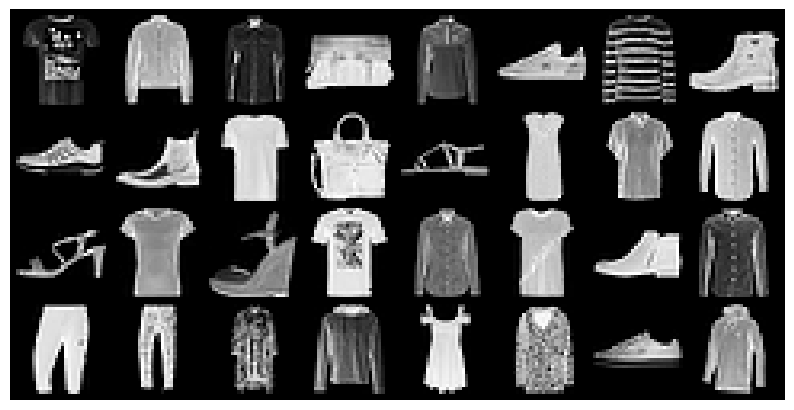

Model 0:


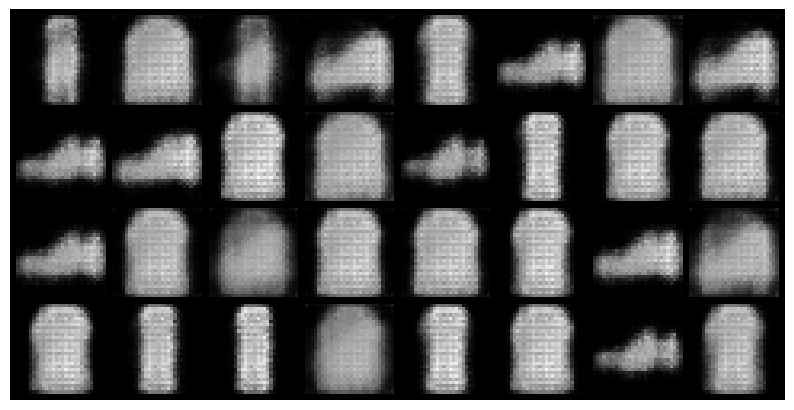

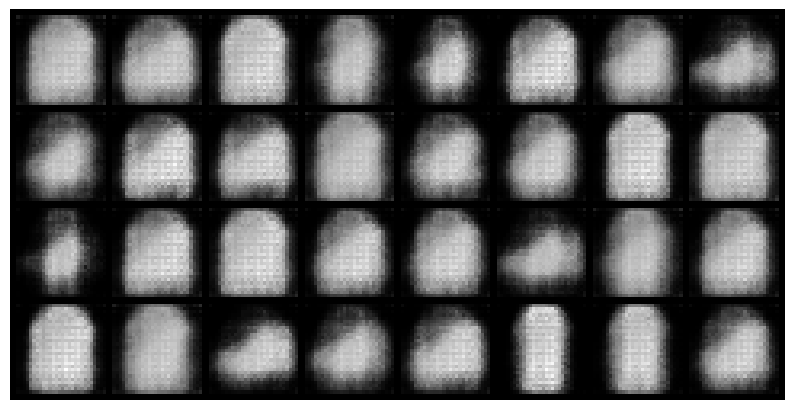

Epoch 1/5 - Batch 100/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


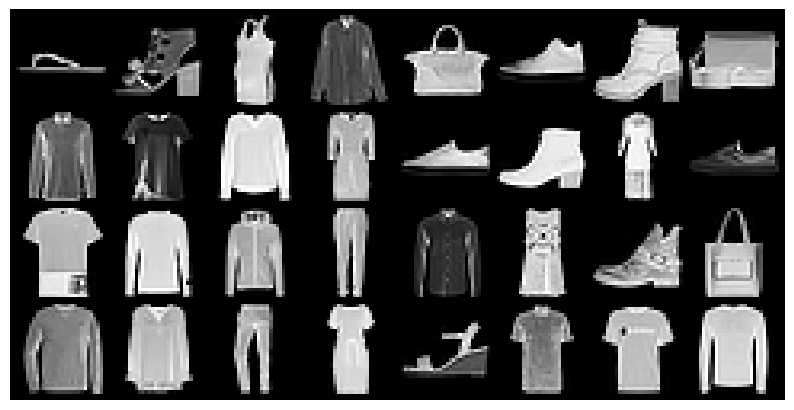

Model 0:


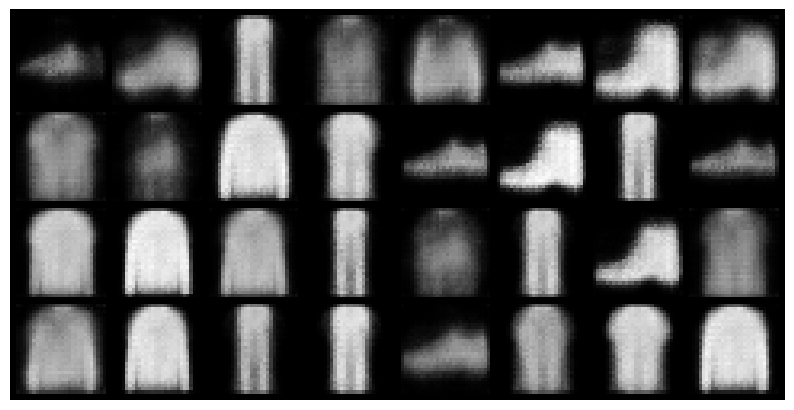

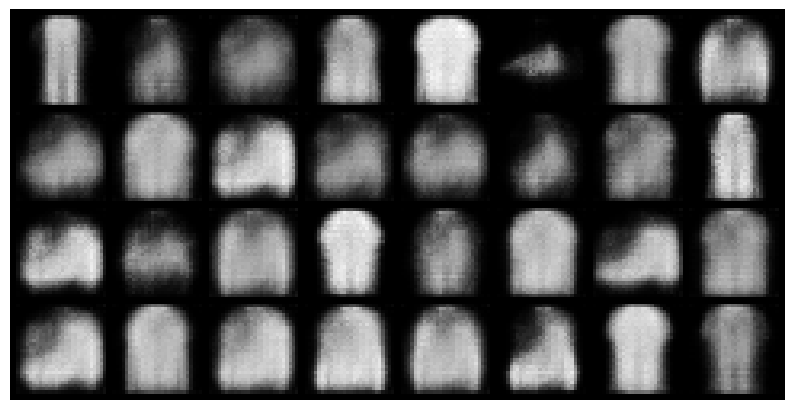

Epoch 1/5 - Batch 101/469
Input: real data (trained on)
Real batch:


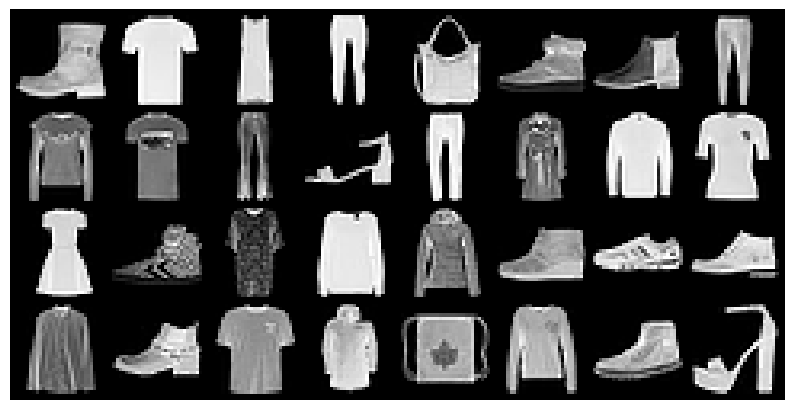

Model 0:


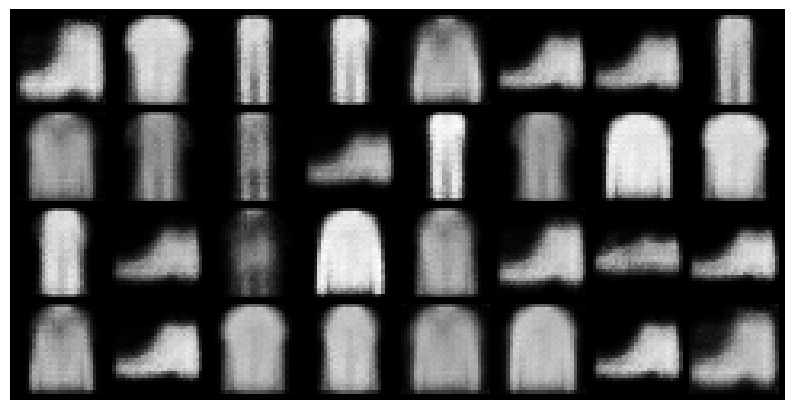

Epoch 1/5 - Batch 150/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


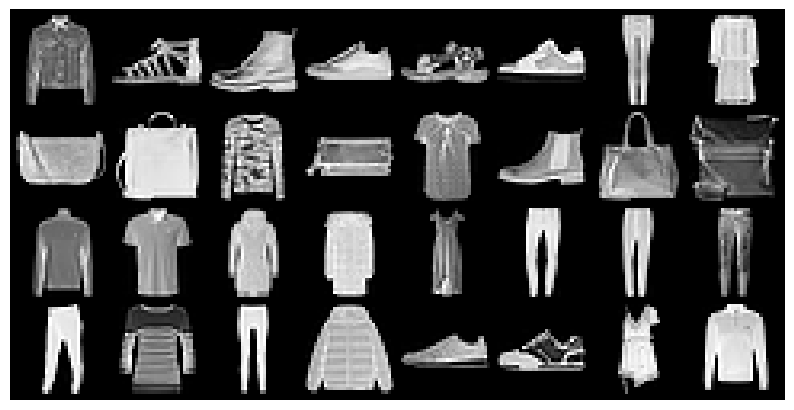

Model 0:


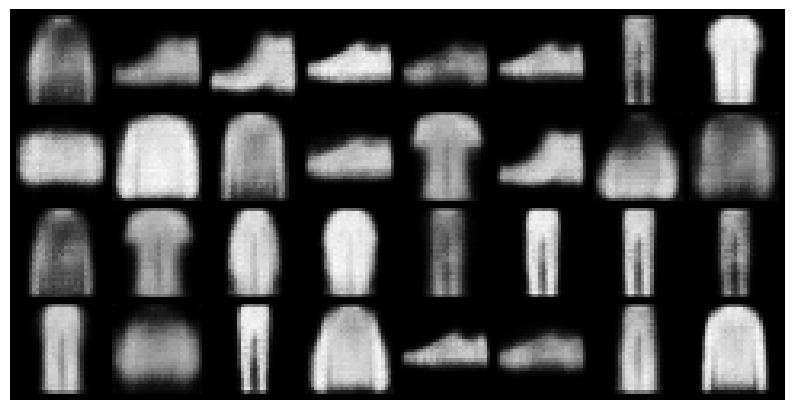

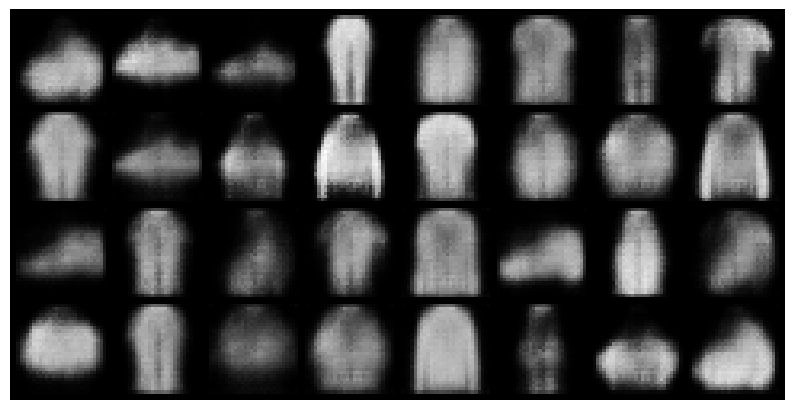

Epoch 1/5 - Batch 151/469
Input: real data (trained on)
Real batch:


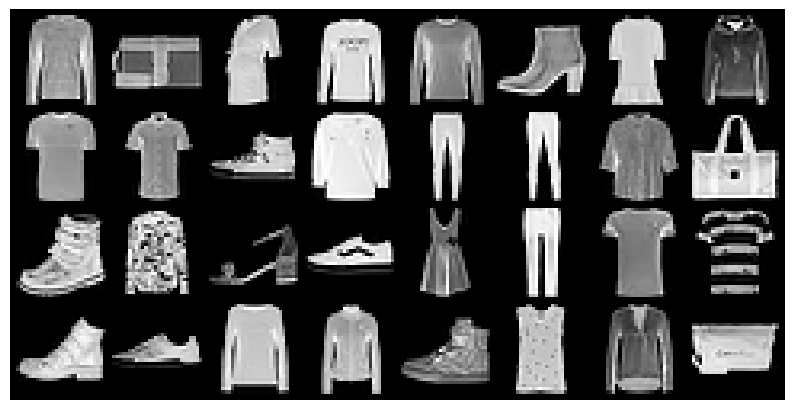

Model 0:


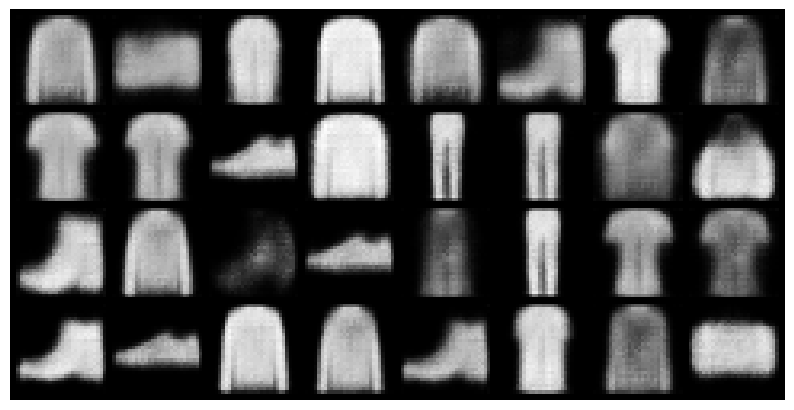

Epoch 1/5 - Batch 200/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


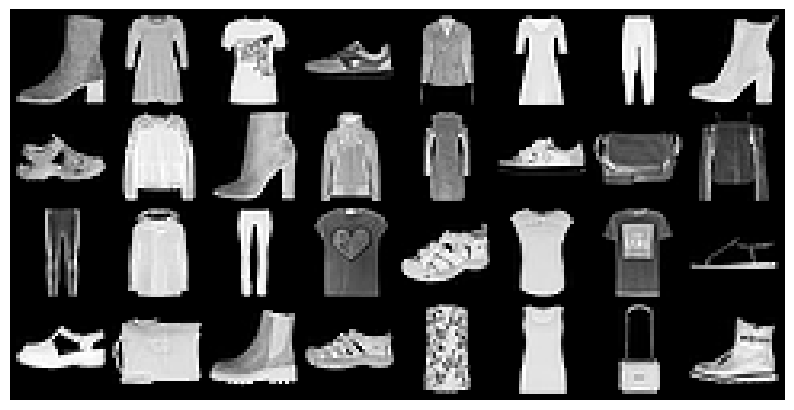

Model 0:


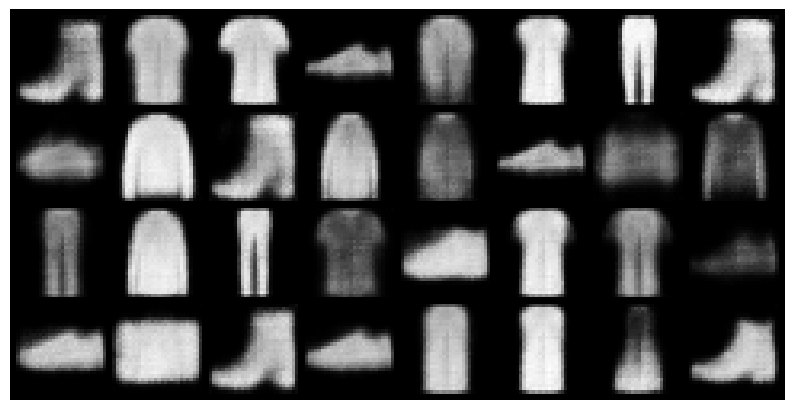

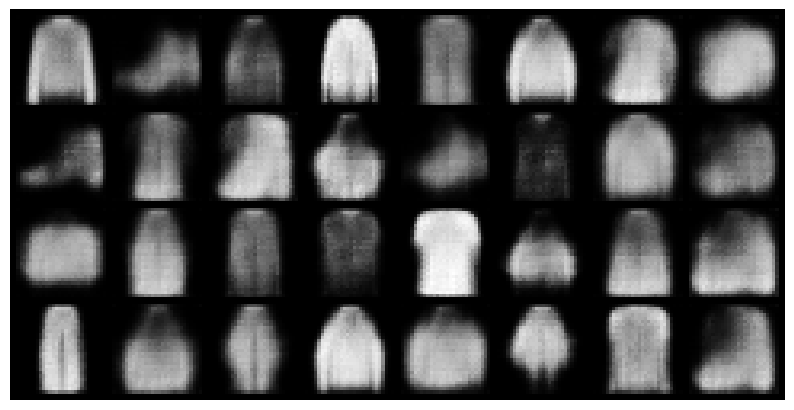

Epoch 1/5 - Batch 201/469
Input: real data (trained on)
Real batch:


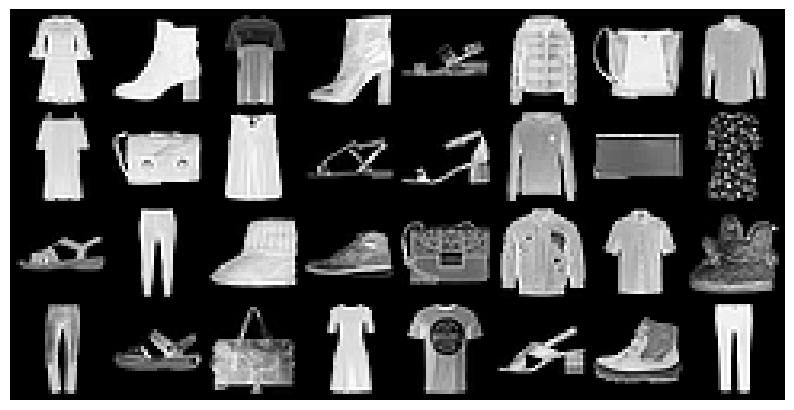

Model 0:


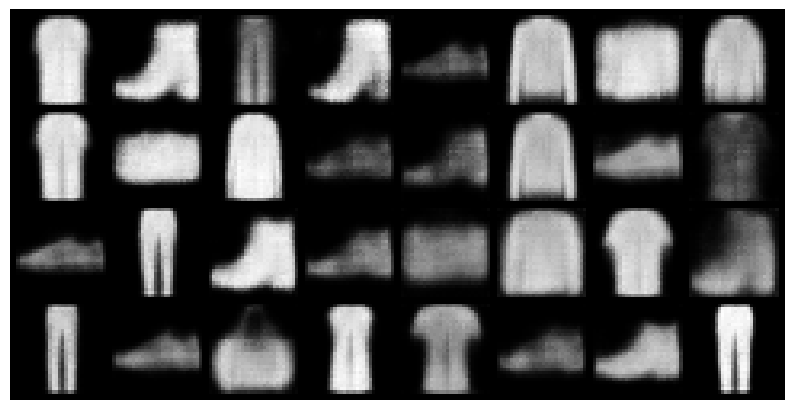

Epoch 1/5 - Batch 250/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


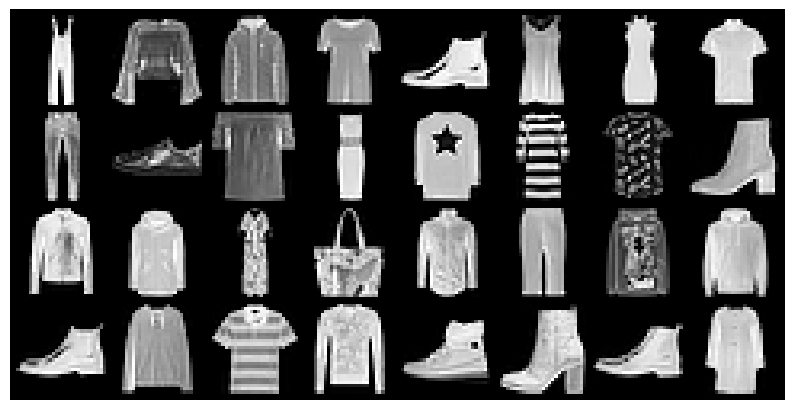

Model 0:


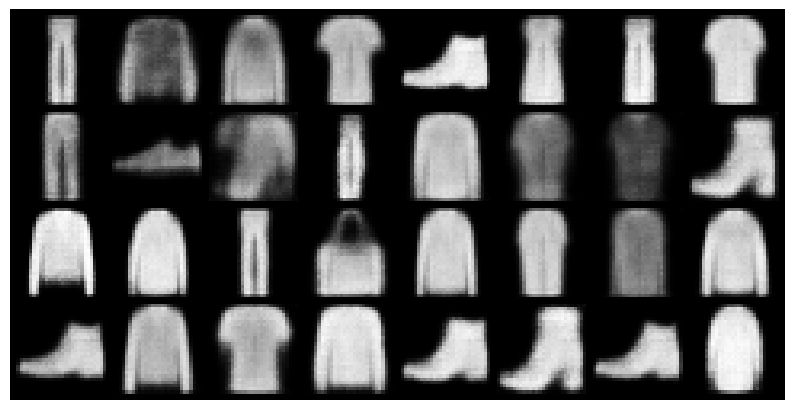

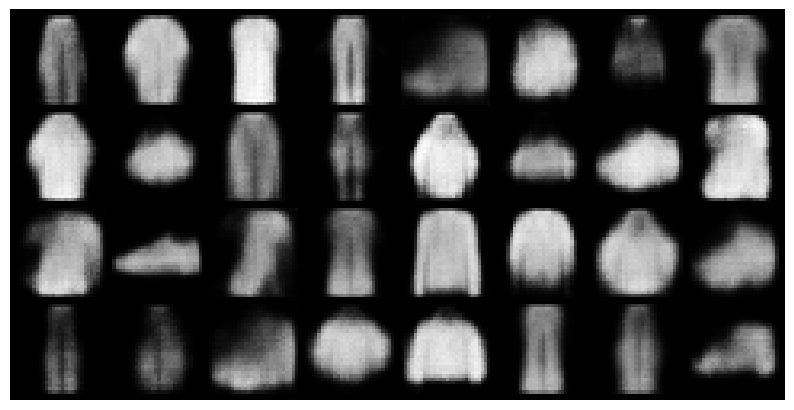

Epoch 1/5 - Batch 251/469
Input: real data (trained on)
Real batch:


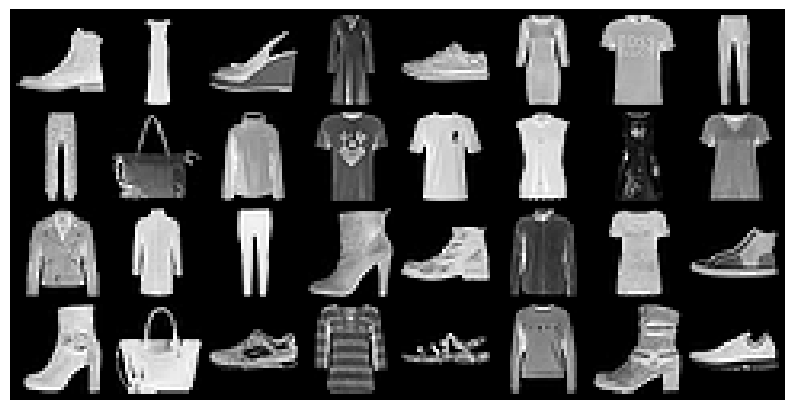

Model 0:


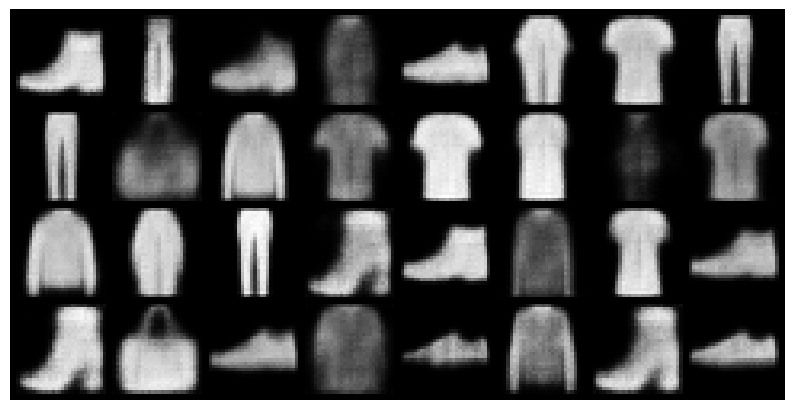

Epoch 1/5 - Batch 300/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


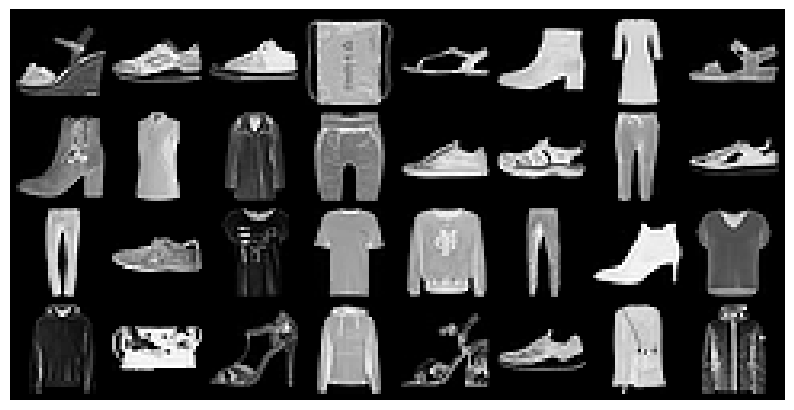

Model 0:


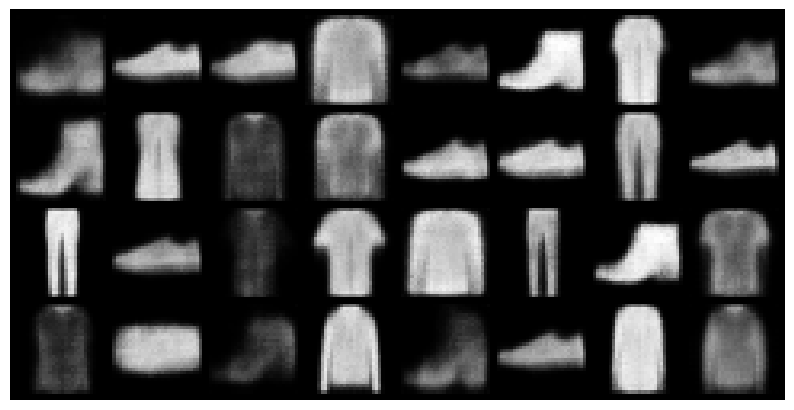

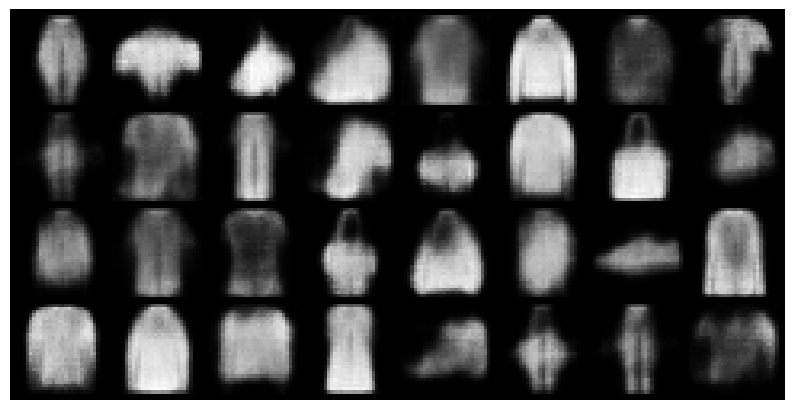

Epoch 1/5 - Batch 301/469
Input: real data (trained on)
Real batch:


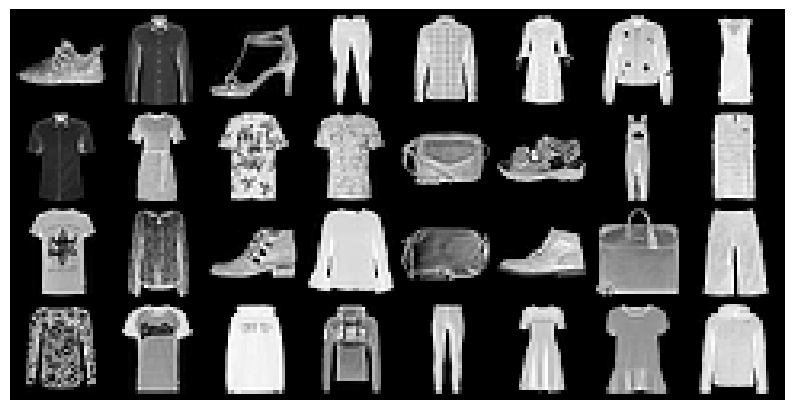

Model 0:


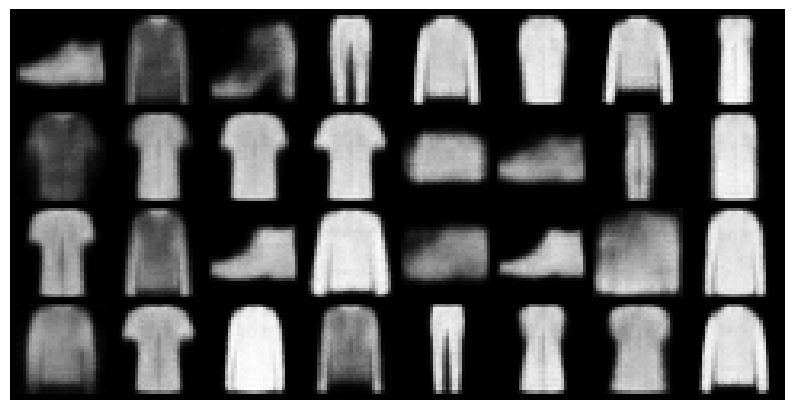

Epoch 1/5 - Batch 350/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


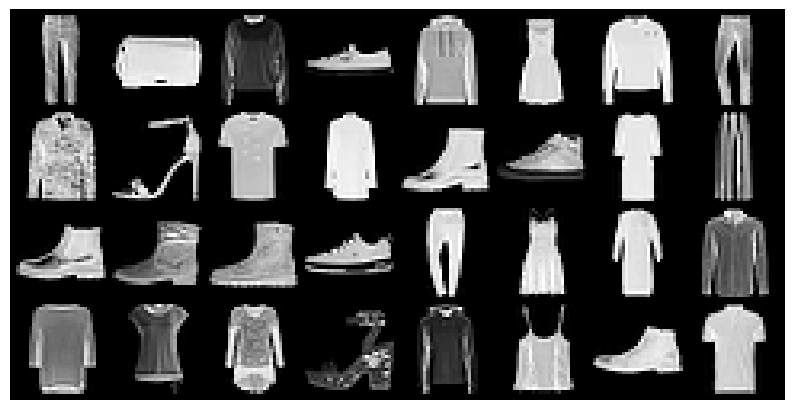

Model 0:


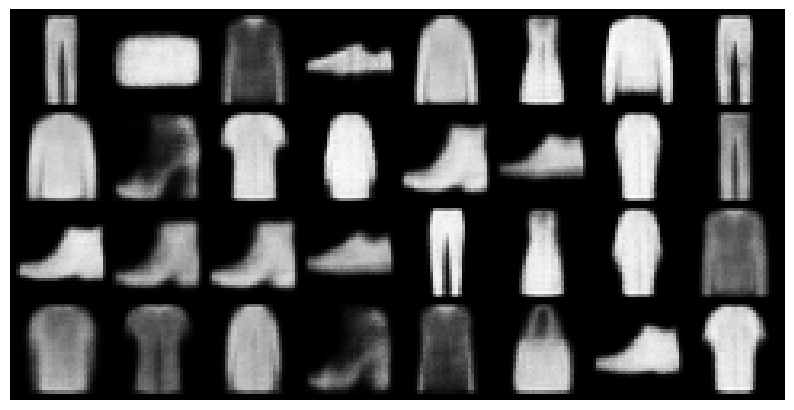

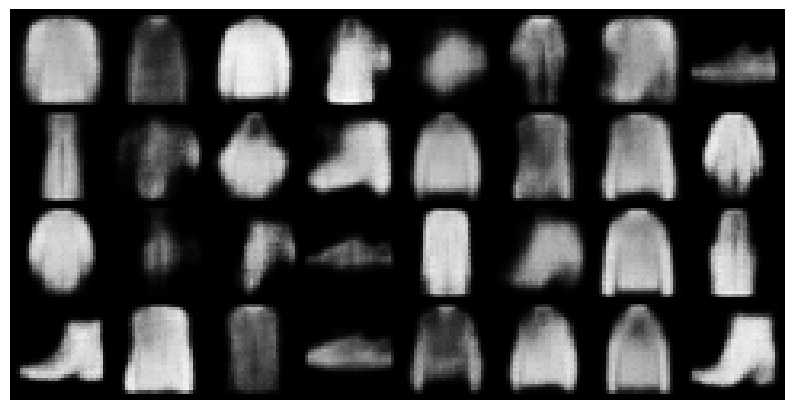

Epoch 1/5 - Batch 351/469
Input: real data (trained on)
Real batch:


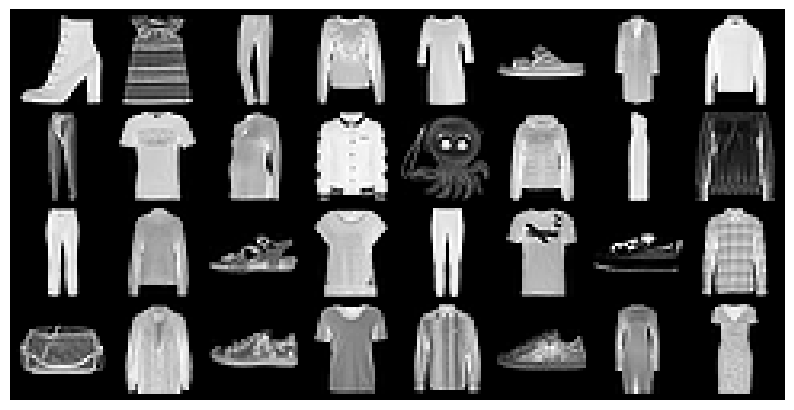

Model 0:


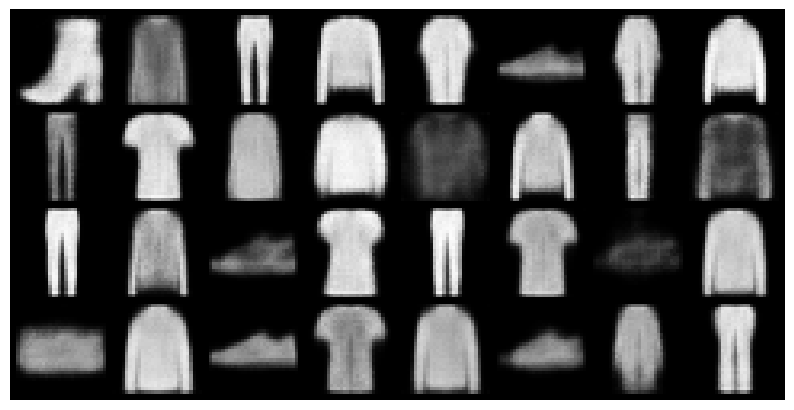

Epoch 1/5 - Batch 400/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


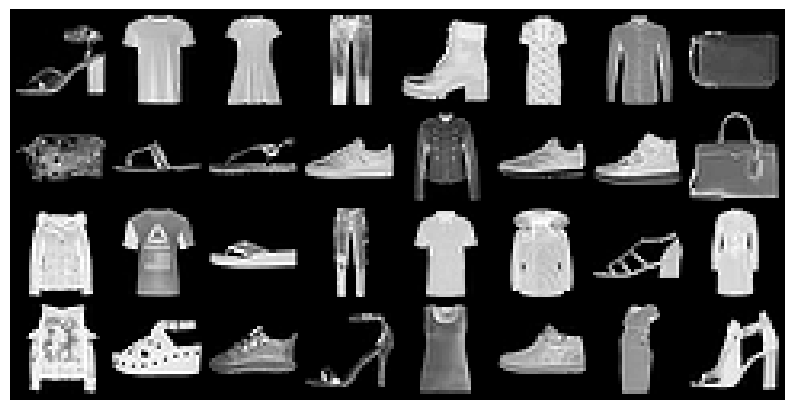

Model 0:


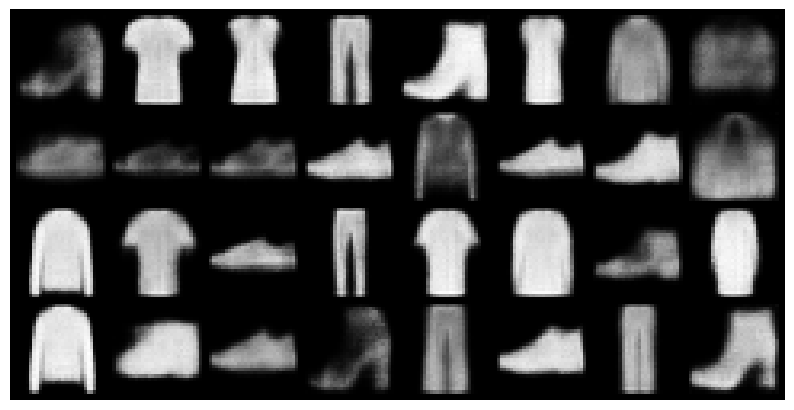

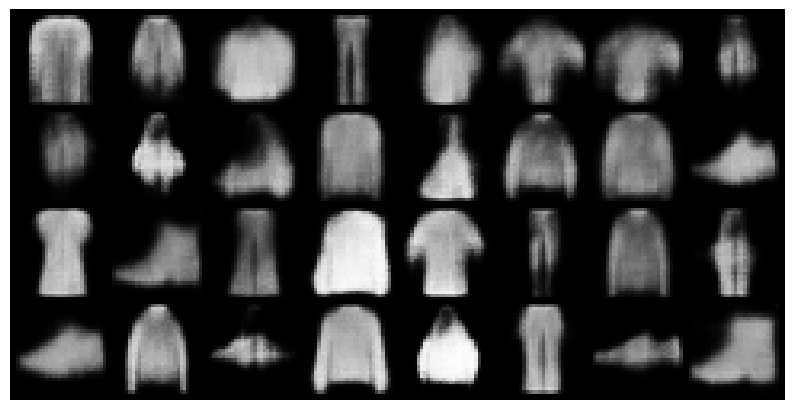

Epoch 1/5 - Batch 401/469
Input: real data (trained on)
Real batch:


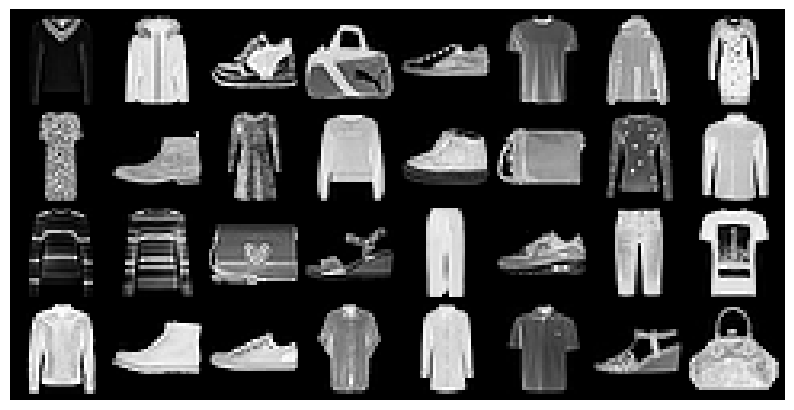

Model 0:


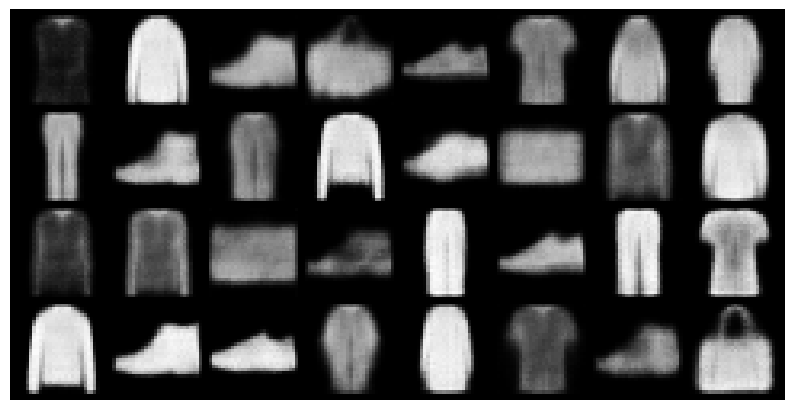

Epoch 1/5 - Batch 450/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


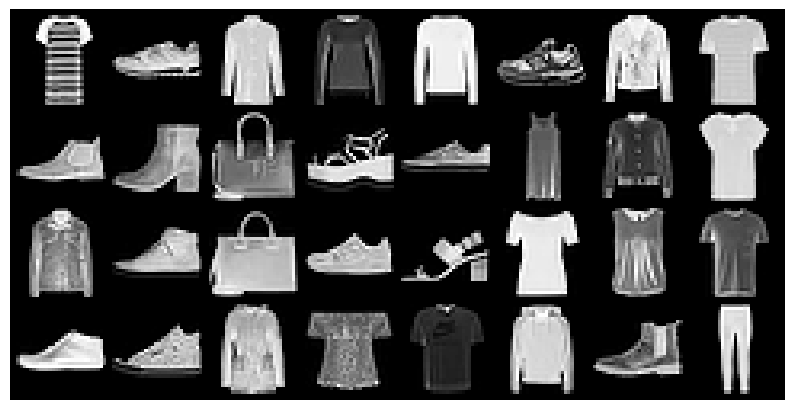

Model 0:


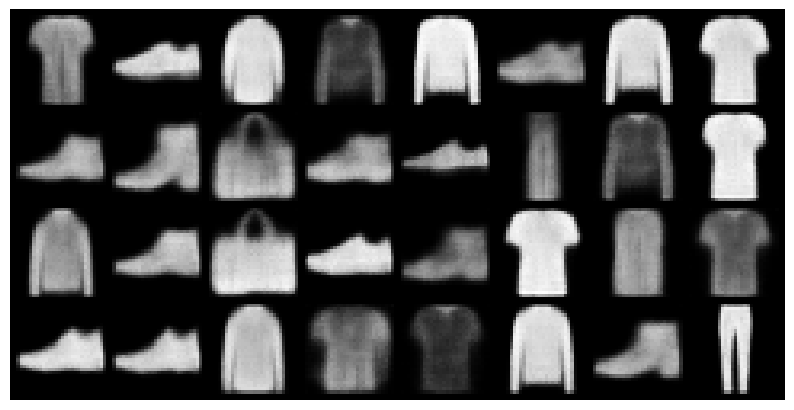

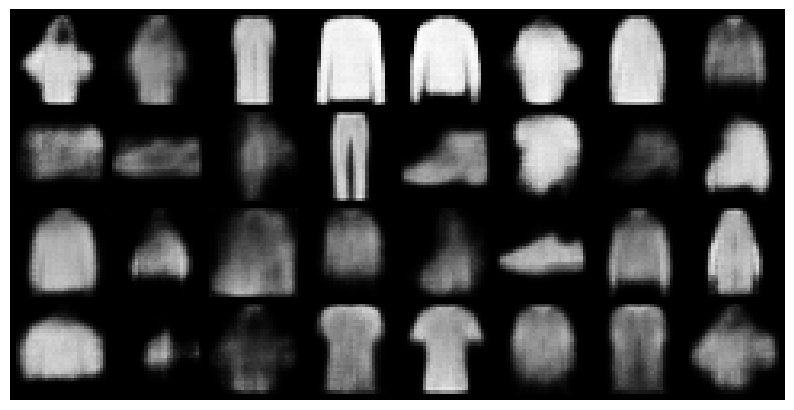

Epoch 1/5 - Batch 451/469
Input: real data (trained on)
Real batch:


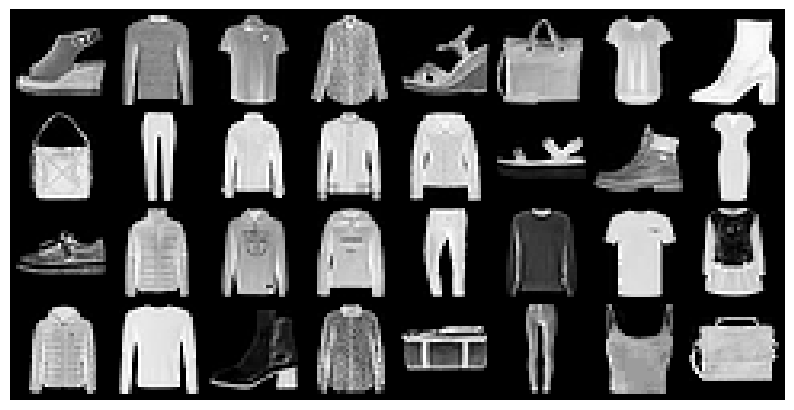

Model 0:


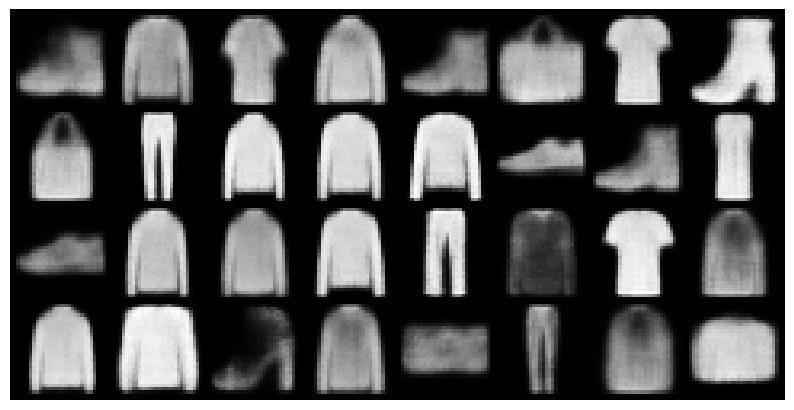

done
done2
Epoch 2/5 - Batch 50/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


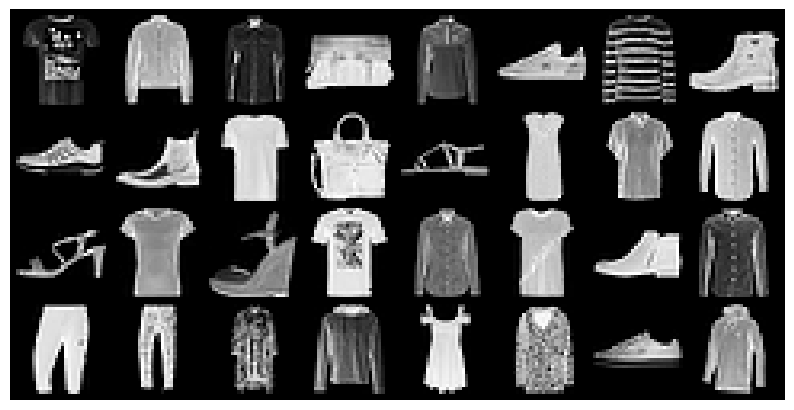

Model 0:


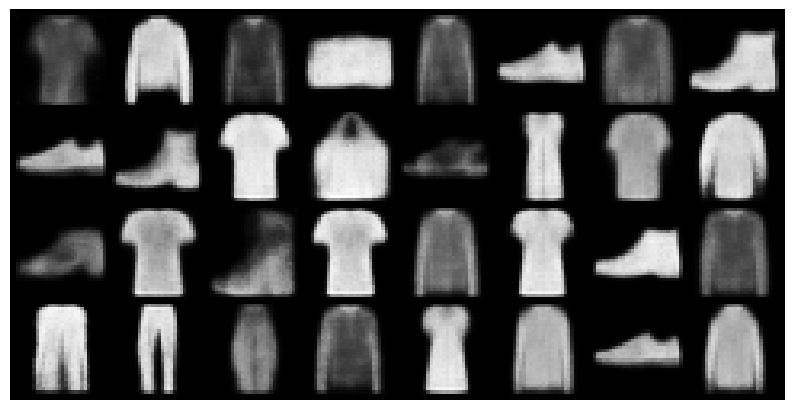

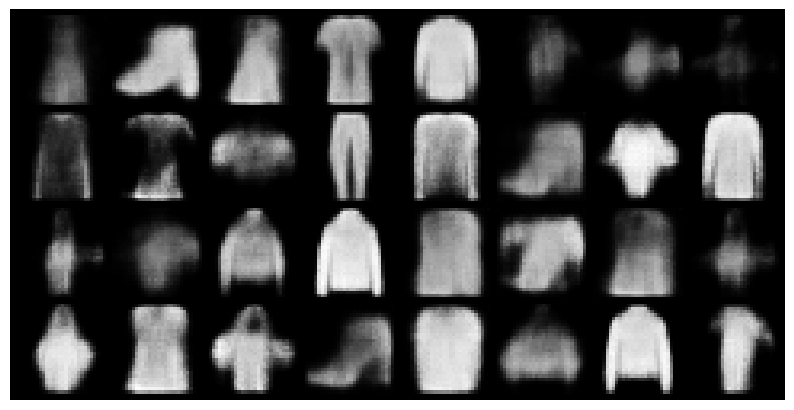

Epoch 2/5 - Batch 100/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


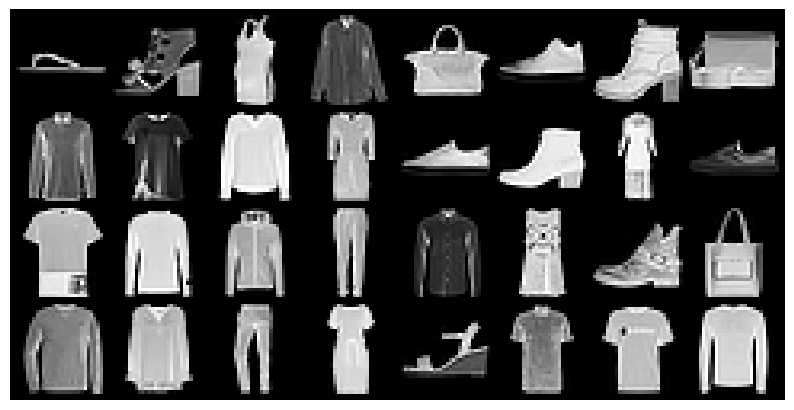

Model 0:


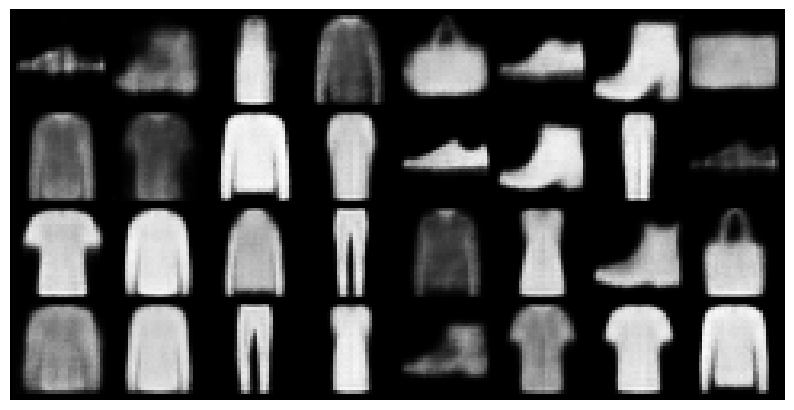

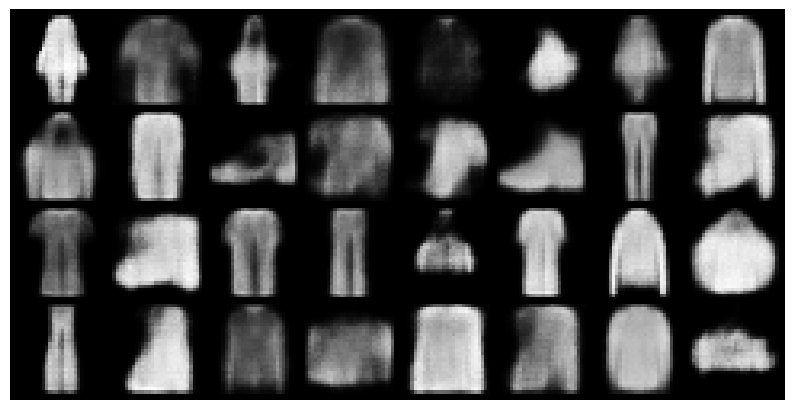

Epoch 2/5 - Batch 101/469
Input: real data (trained on)
Real batch:


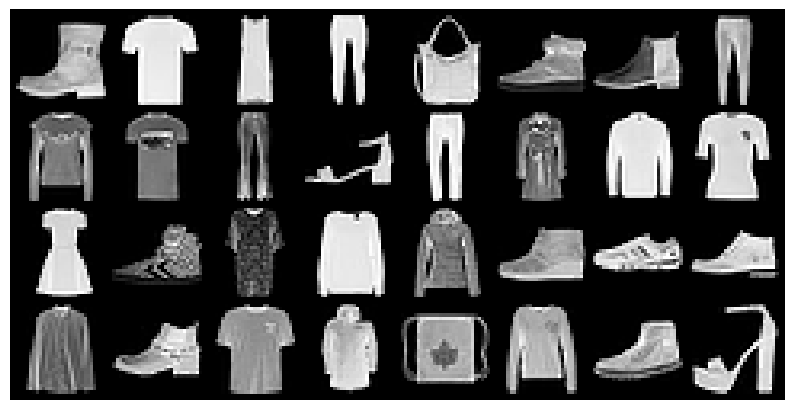

Model 0:


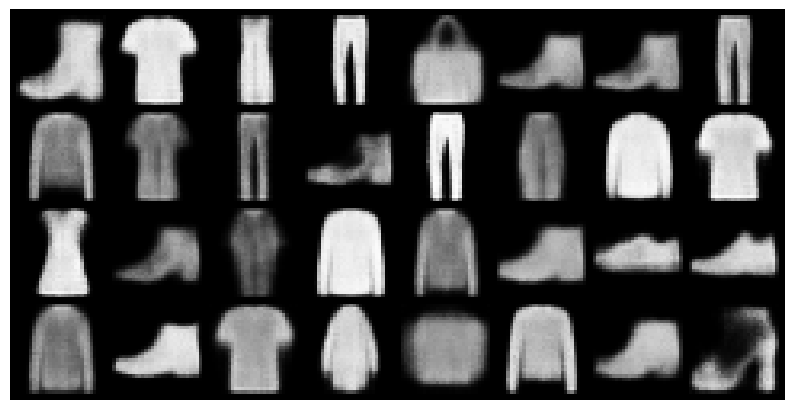

Epoch 2/5 - Batch 150/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


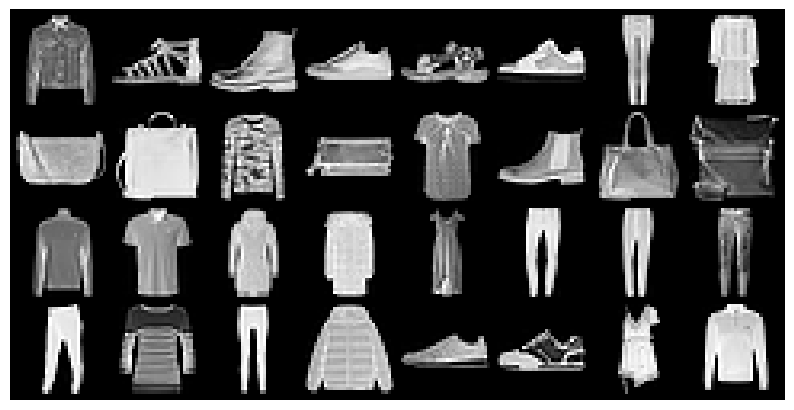

Model 0:


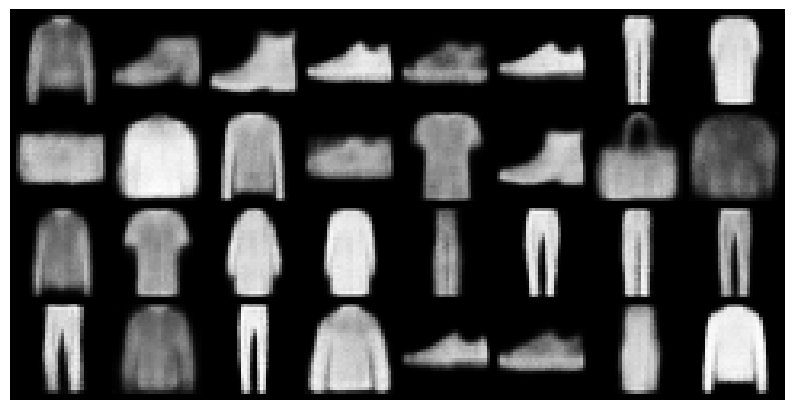

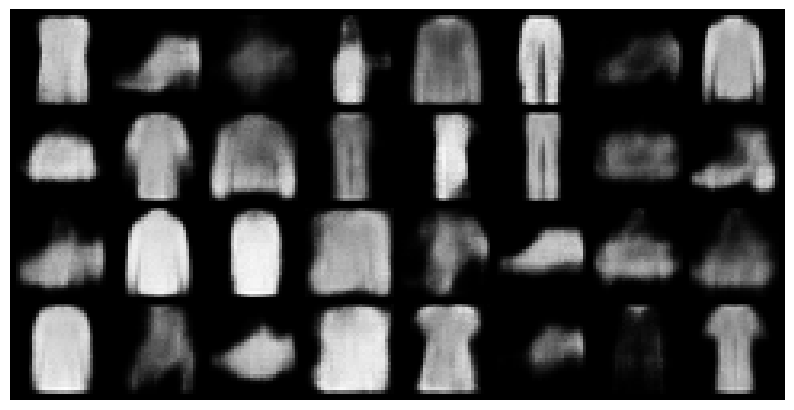

Epoch 2/5 - Batch 151/469
Input: real data (trained on)
Real batch:


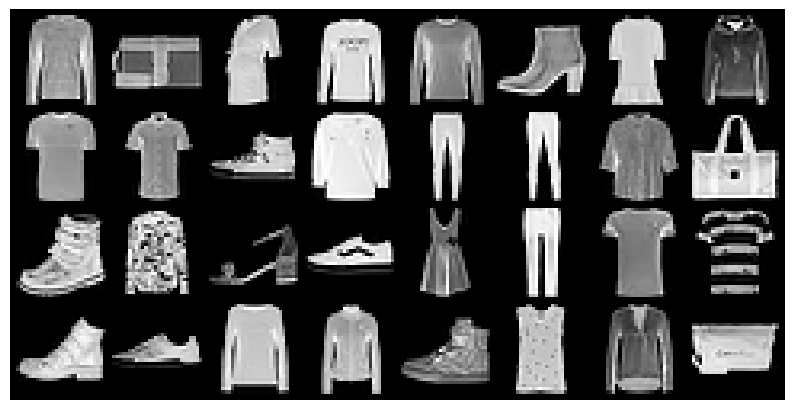

Model 0:


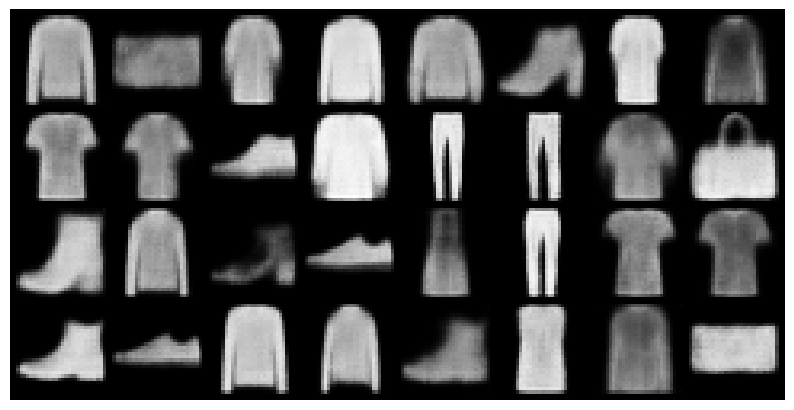

Epoch 2/5 - Batch 200/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


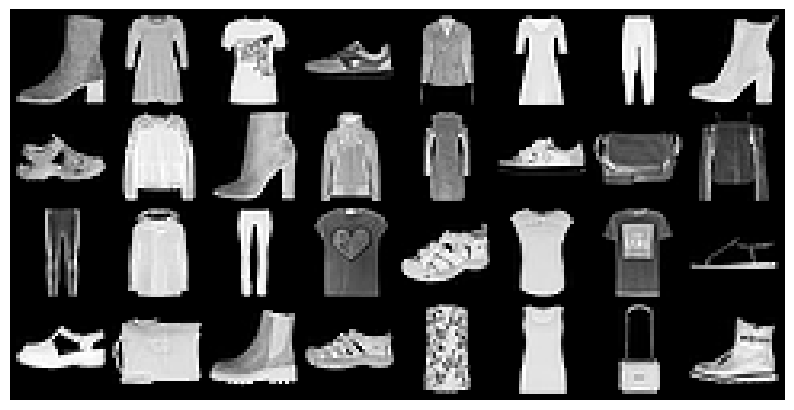

Model 0:


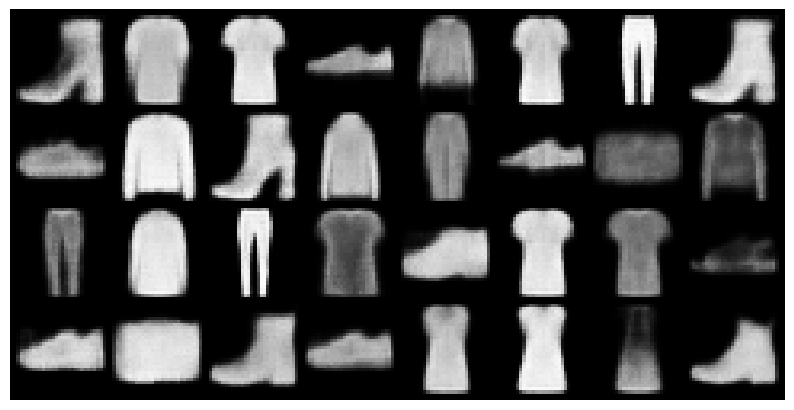

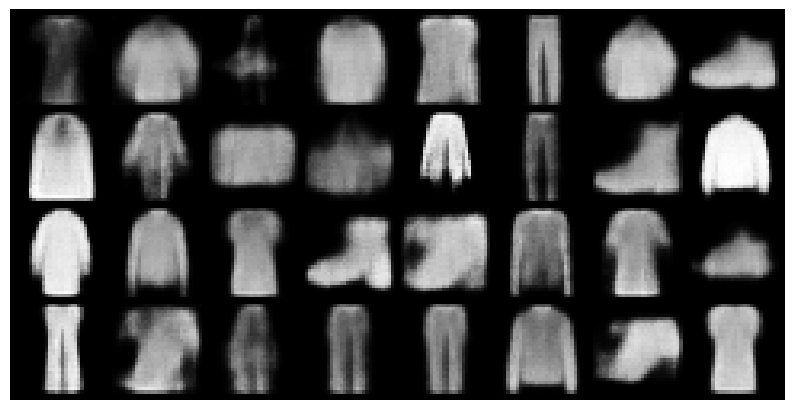

Epoch 2/5 - Batch 201/469
Input: real data (trained on)
Real batch:


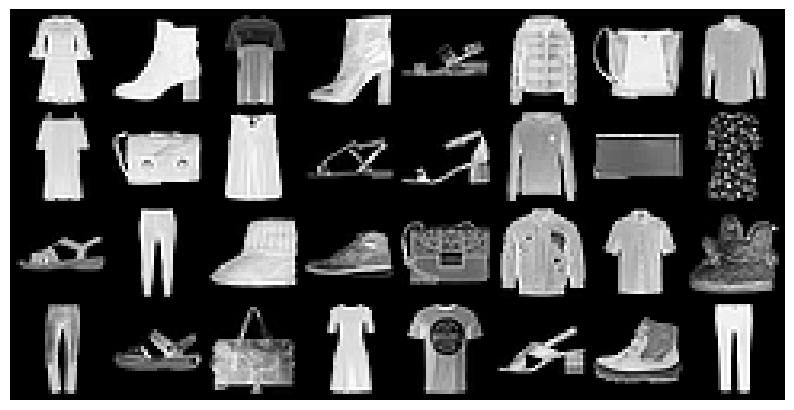

Model 0:


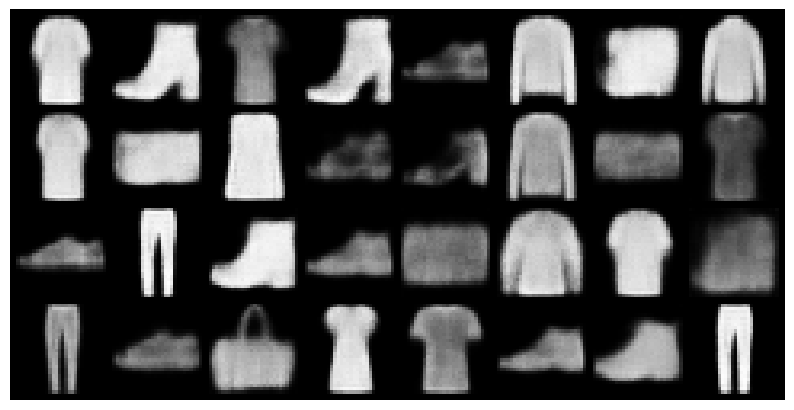

Epoch 2/5 - Batch 250/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


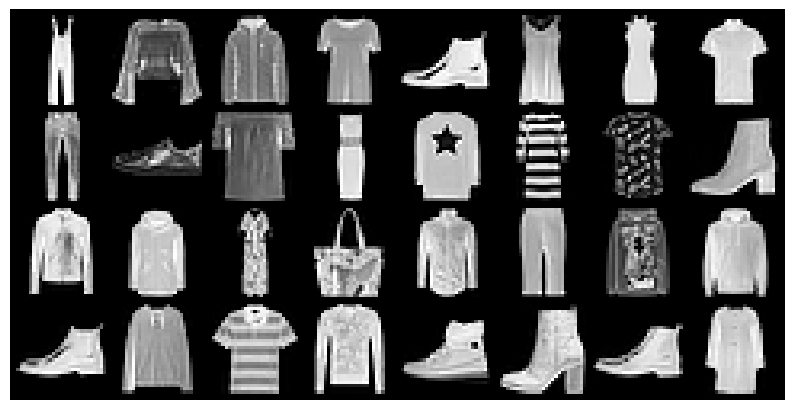

Model 0:


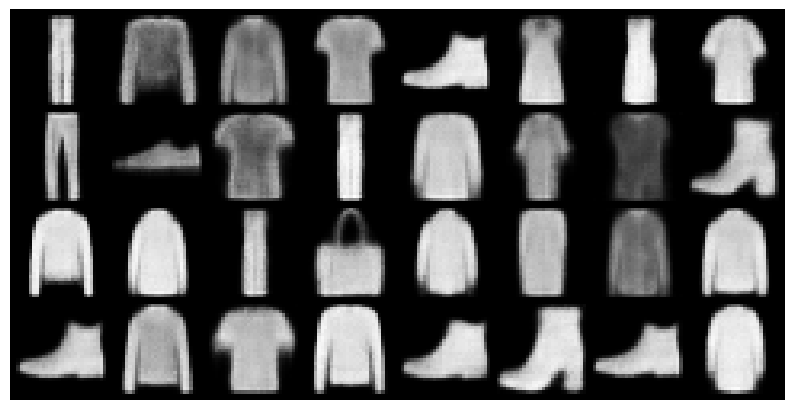

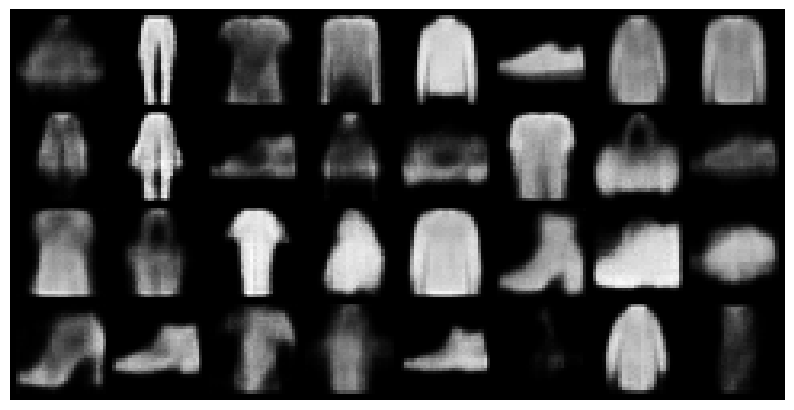

Epoch 2/5 - Batch 251/469
Input: real data (trained on)
Real batch:


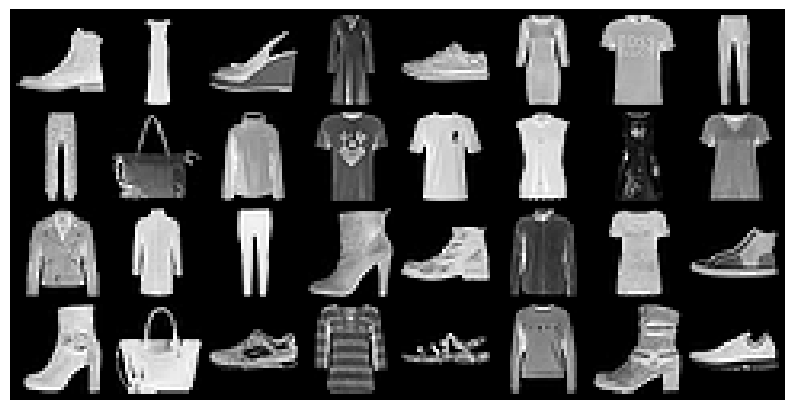

Model 0:


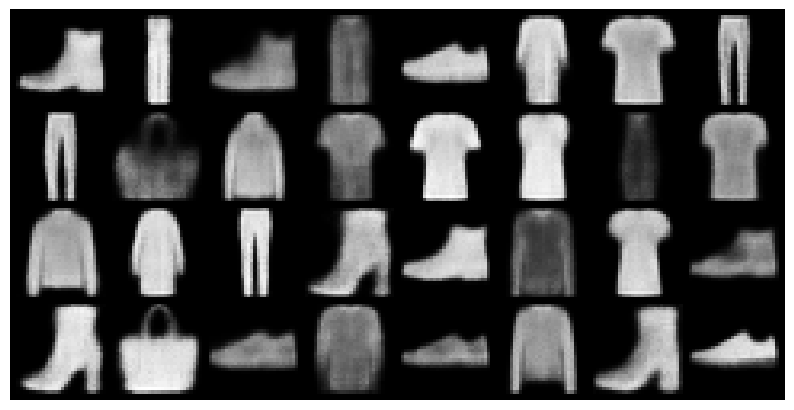

Epoch 2/5 - Batch 300/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


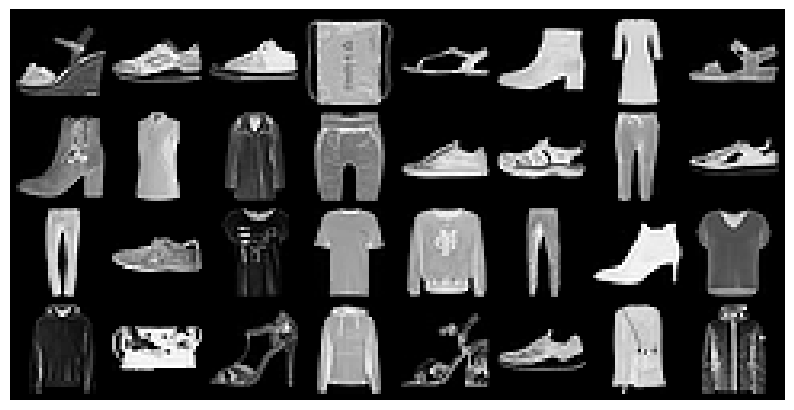

Model 0:


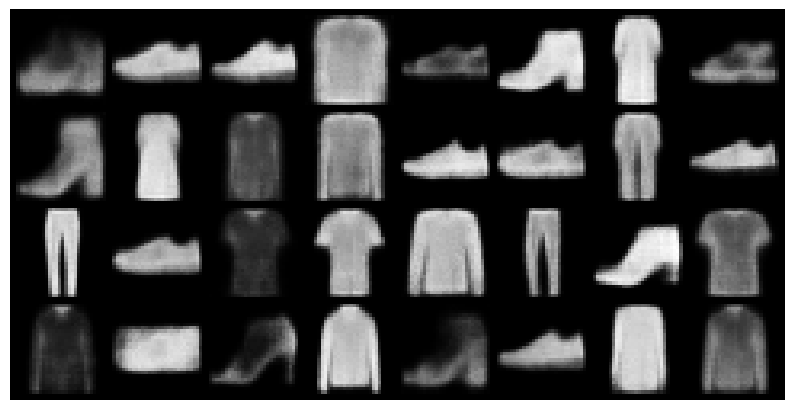

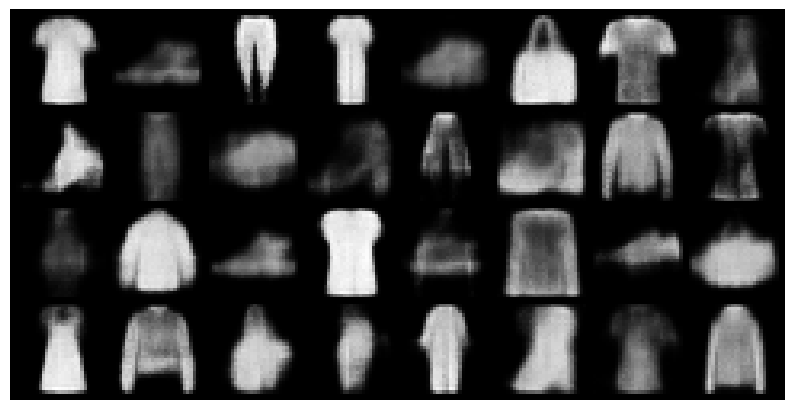

Epoch 2/5 - Batch 301/469
Input: real data (trained on)
Real batch:


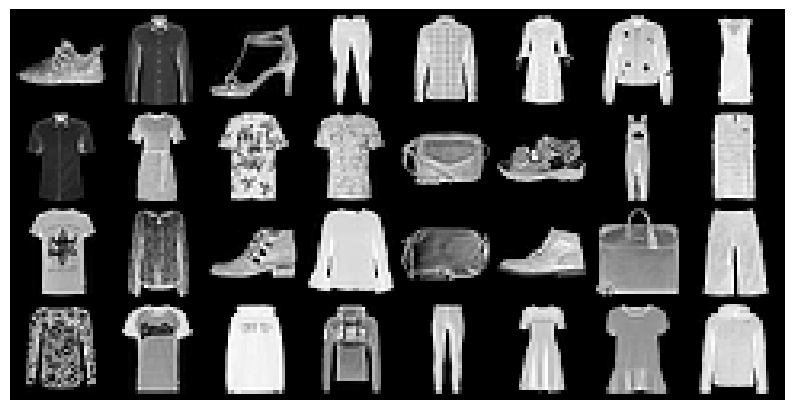

Model 0:


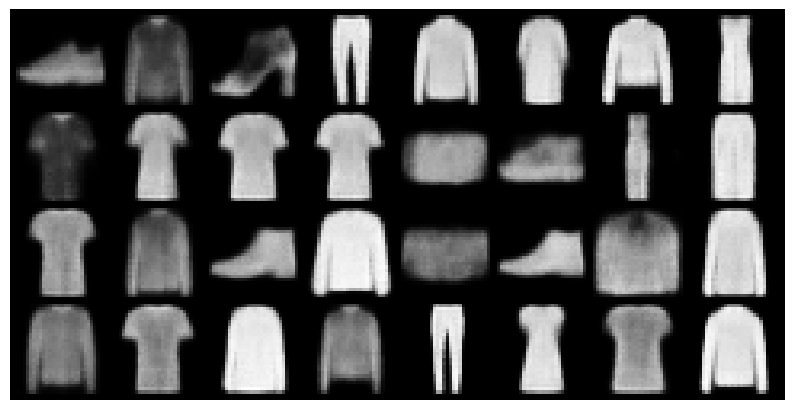

Epoch 2/5 - Batch 350/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


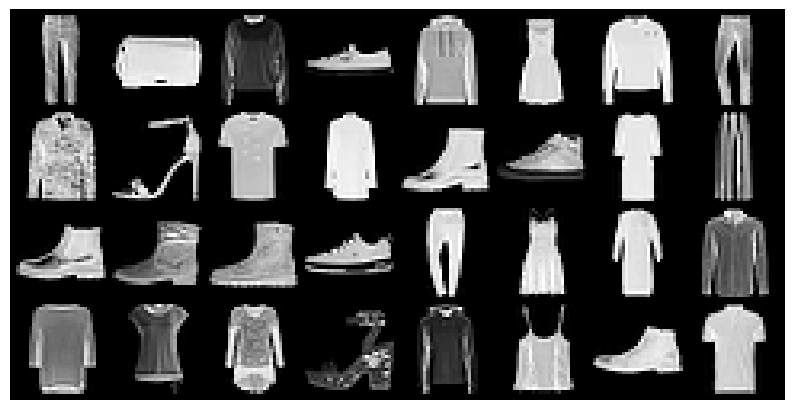

Model 0:


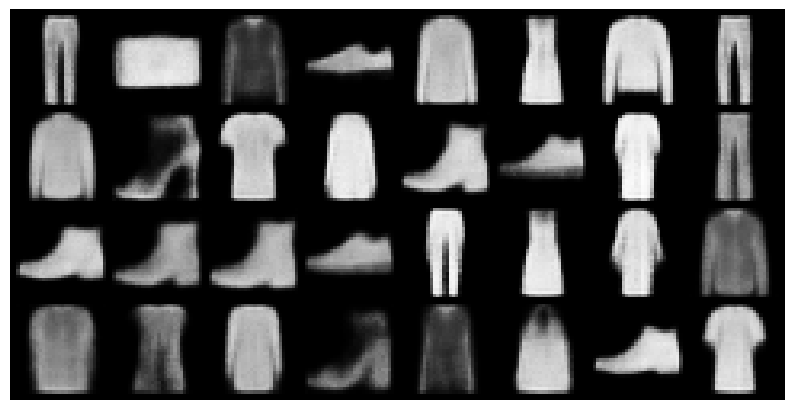

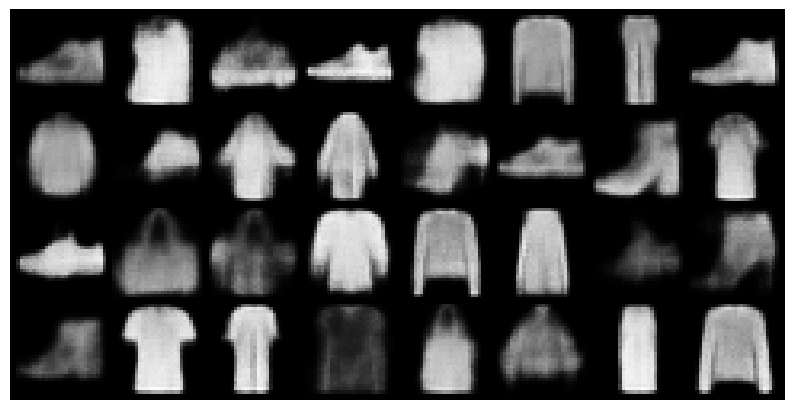

Epoch 2/5 - Batch 351/469
Input: real data (trained on)
Real batch:


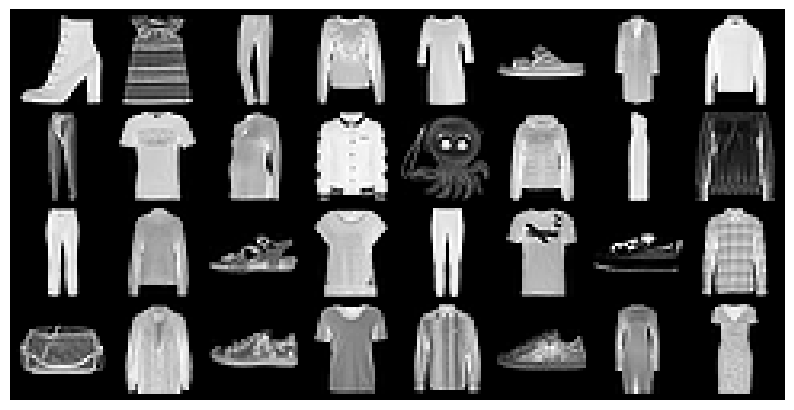

Model 0:


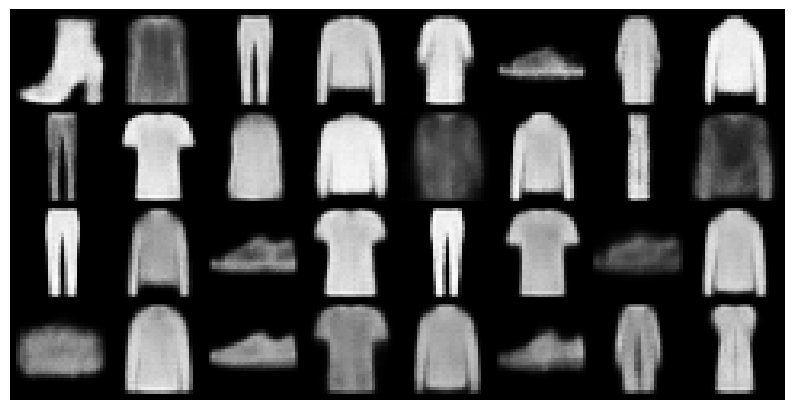

Epoch 2/5 - Batch 400/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


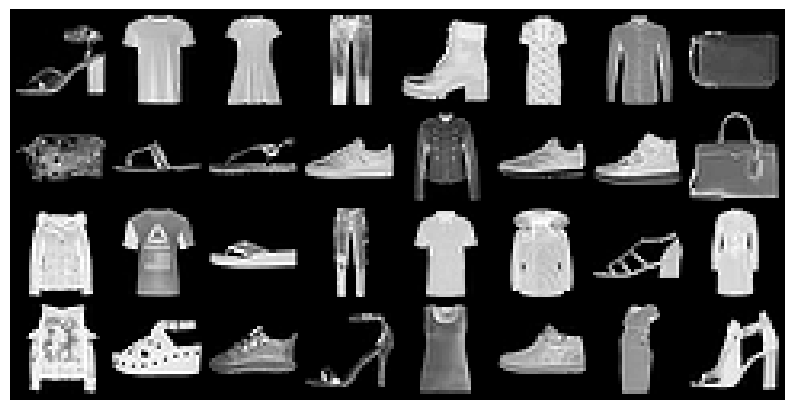

Model 0:


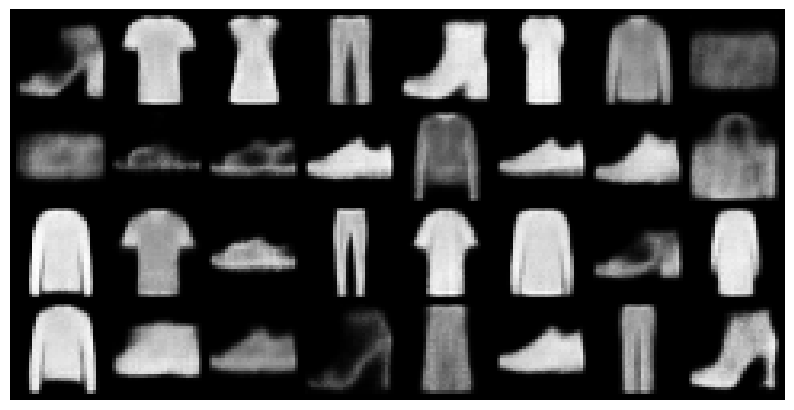

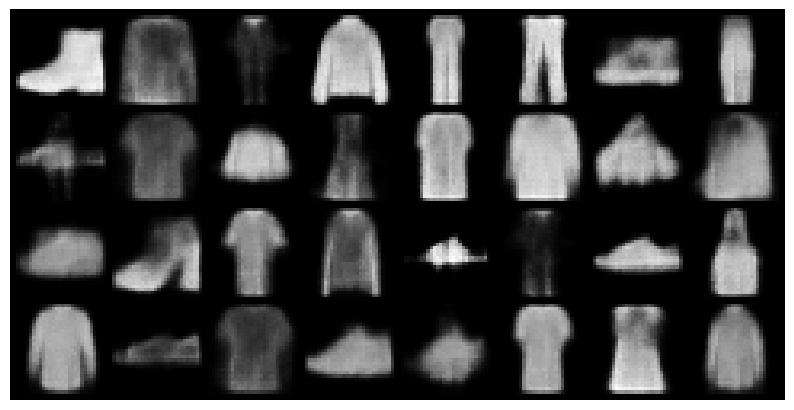

Epoch 2/5 - Batch 401/469
Input: real data (trained on)
Real batch:


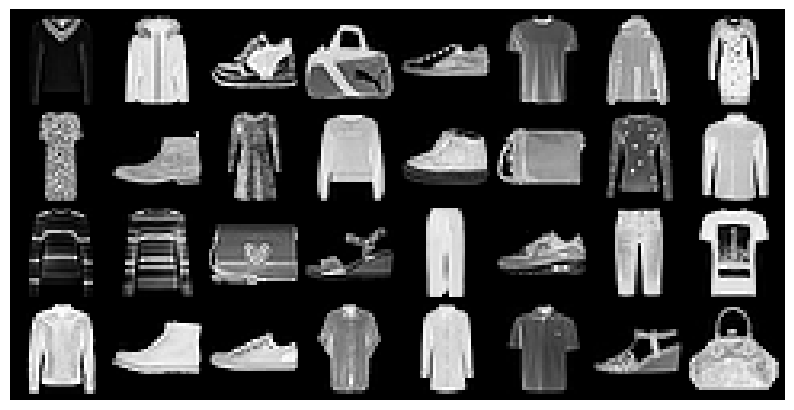

Model 0:


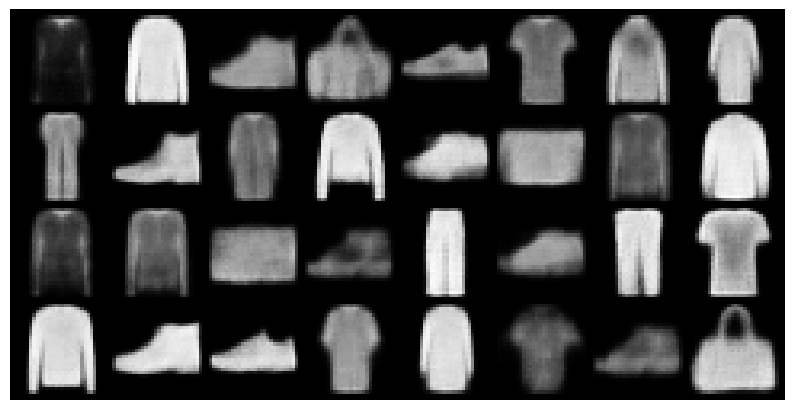

Epoch 2/5 - Batch 450/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


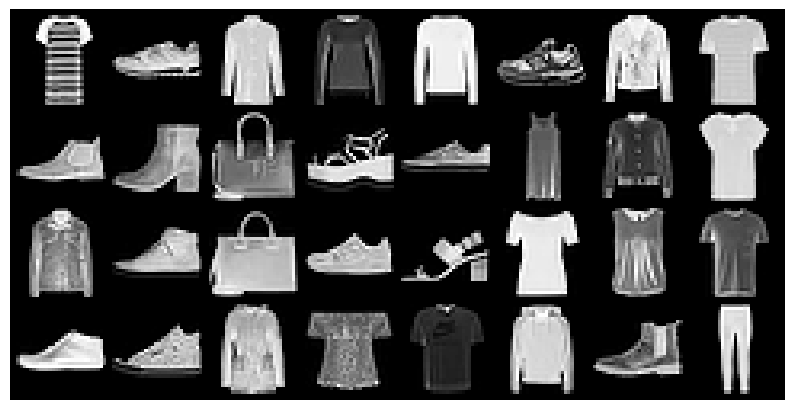

Model 0:


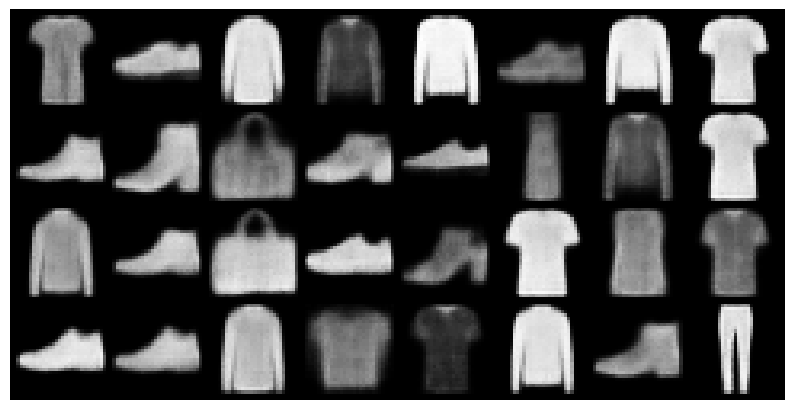

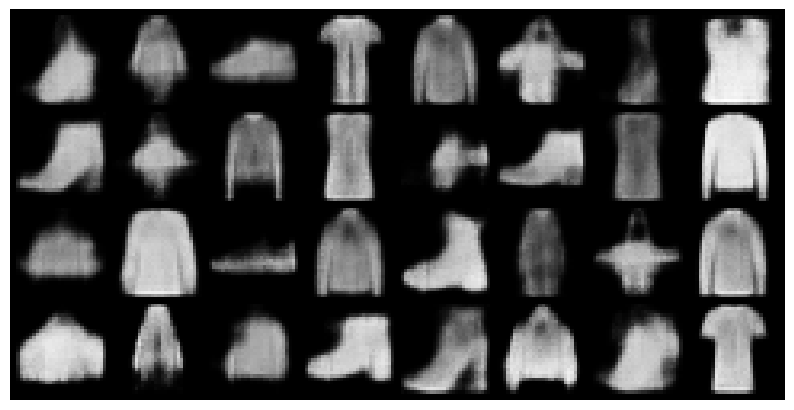

Epoch 2/5 - Batch 451/469
Input: real data (trained on)
Real batch:


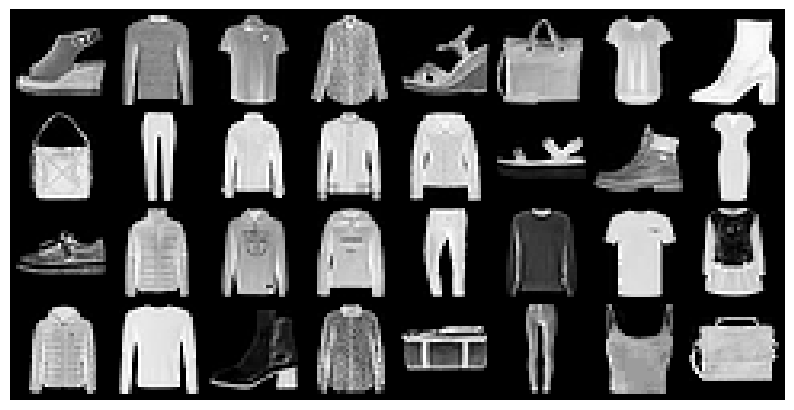

Model 0:


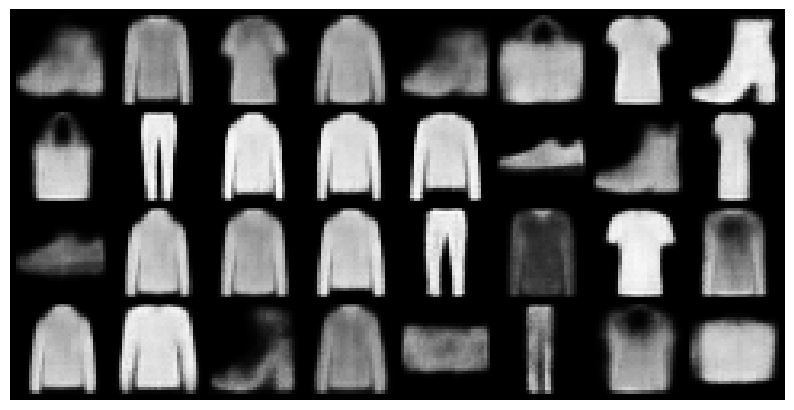

done
done2


KeyboardInterrupt: ignored

In [10]:
#model0 is normal VAE, models1-6 have topo losses:
n_latent = 10
model0 = VAE(n_latent)
optimizer0 = optim.Adam(model0.parameters(), lr=1e-3)
model0.train()
n_showplots = 50
losses = []
losses2 = []

for epoch in range(epochs):
    for batch_idx, (data, _) in enumerate(train_loader):
        if batch_idx==1: print("done")
        if batch_idx==10: print("done2")
        #data = data.view(data.size(0), -1)
        if batch_idx % n_showplots != 0 or batch_idx==0:
          optimizer0.zero_grad()

          recon_batch, mean, log_var = model0(data)
          loss = loss_vae0(recon_batch, data, mean, log_var, 0)
          loss.backward()
          optimizer0.step()

          if batch_idx % n_showplots == 1 and batch_idx > 100:
            print(f"Epoch {epoch+1}/{epochs} - Batch {batch_idx}/{len(train_loader)}")
            print("Input: real data (trained on)")
            with torch.no_grad():
                print("Real batch:")
                plot_batch(data)

                print("Model 0:")
                recon_batch, _, _ = model0(data)
                plot_batch(recon_batch)

        else: #ie batch_idx % n_showplots == 0 and >0:
            print(f"Epoch {epoch+1}/{epochs} - Batch {batch_idx}/{len(train_loader)}")
            print("Input: new data (not trained on) and input random latent vectors:")

            with torch.no_grad():
                print("Real batch:")
                plot_batch(data)

                sampled_latent = torch.randn(32, n_latent)
                #show imgs generated by the 7 models:

                print("Model 0:")
                recon_batch, _, _ = model0(data)
                plot_batch(recon_batch)
                generated_samples = model0.decoder(sampled_latent)
                plot_batch(generated_samples)

Train only models 0 and 2:

done
done2


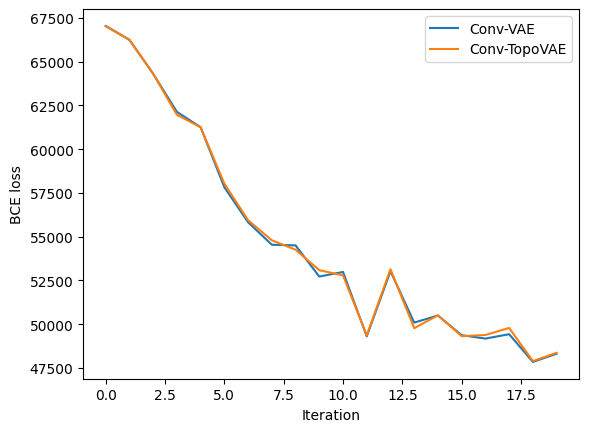

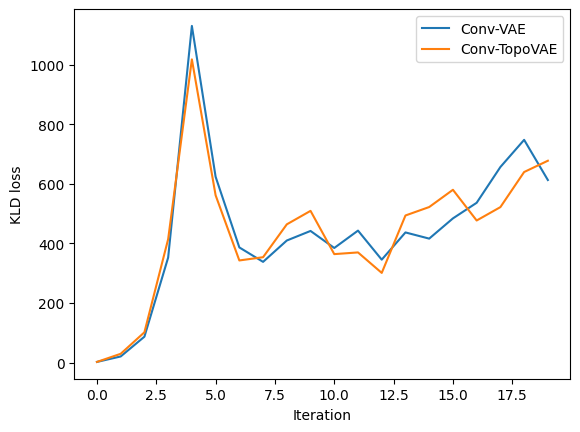

Epoch 1/10 - Batch 20/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


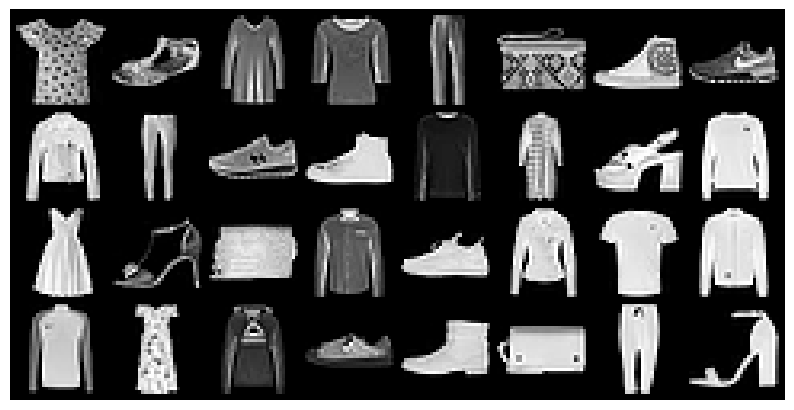

Model 0:


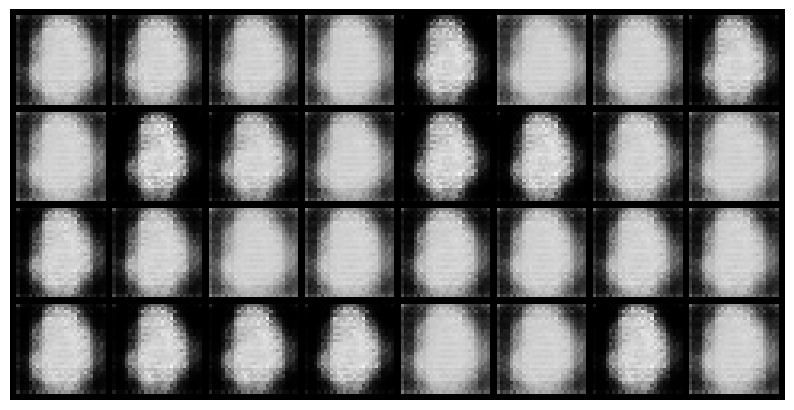

Model 2:


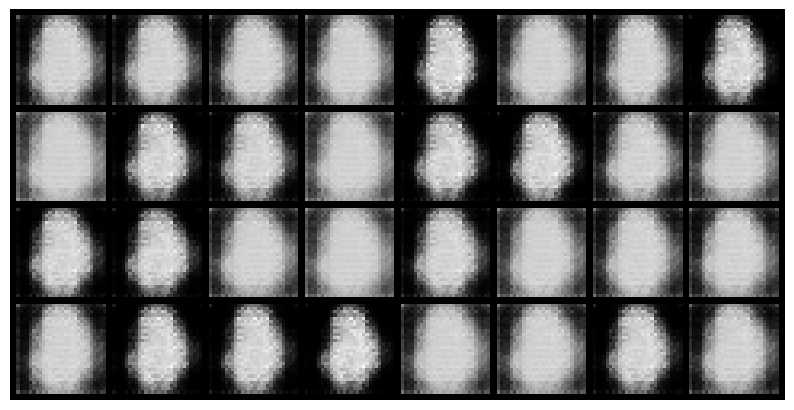

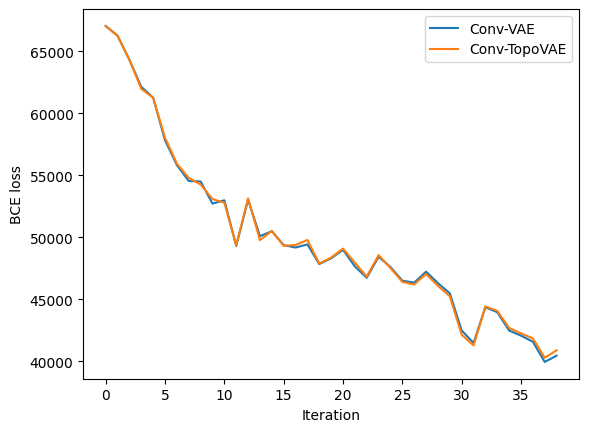

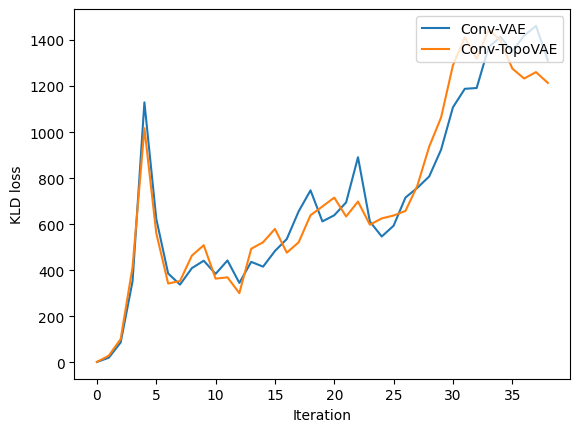

Epoch 1/10 - Batch 40/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


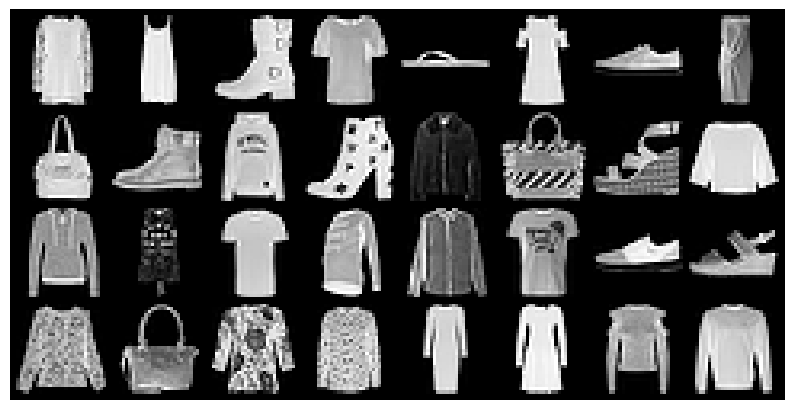

Model 0:


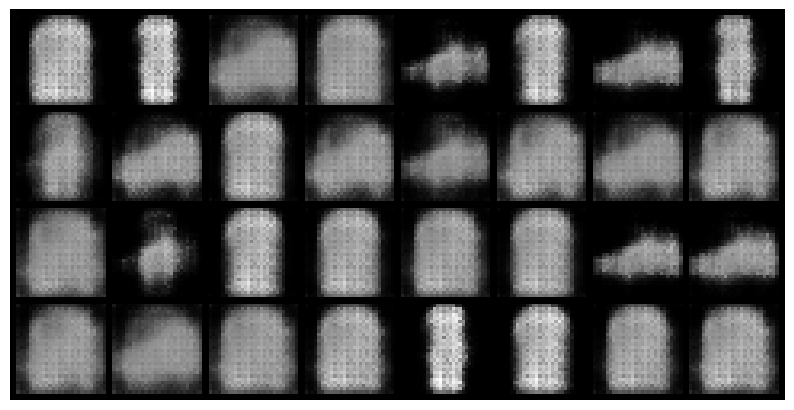

Model 2:


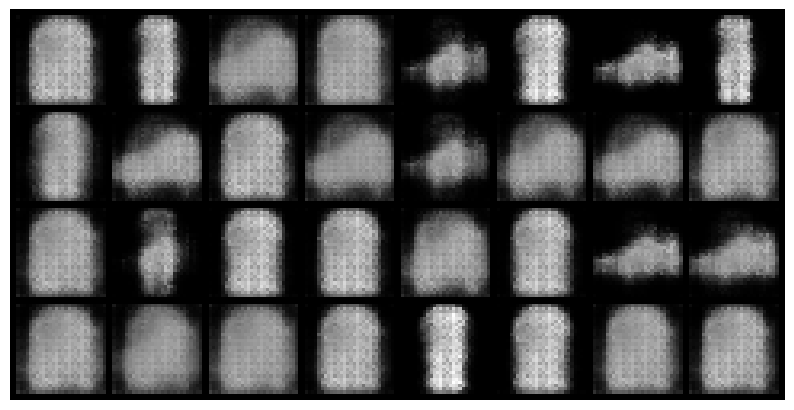

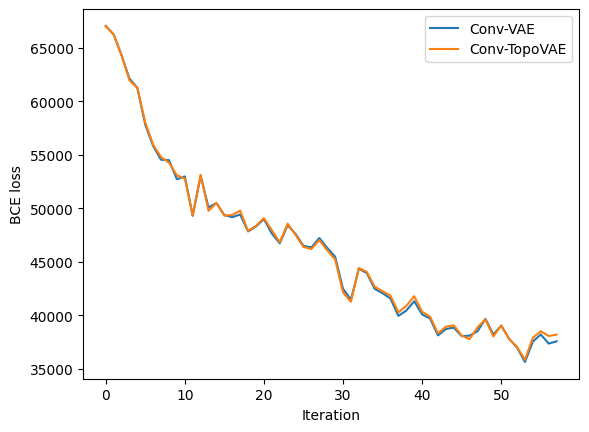

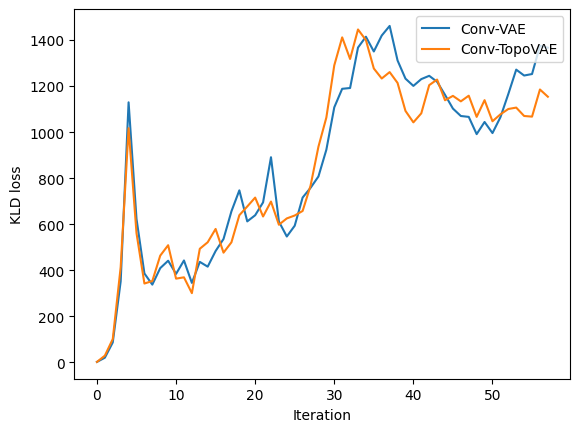

Epoch 1/10 - Batch 60/469
Input: new data (not trained on) and input random latent vectors:
Real batch:


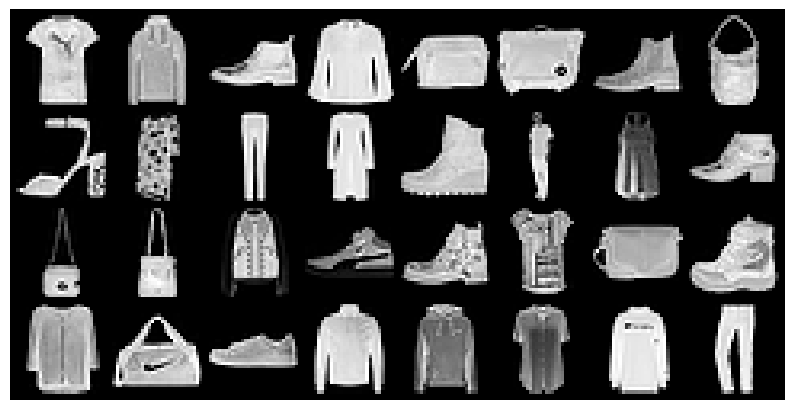

Model 0:


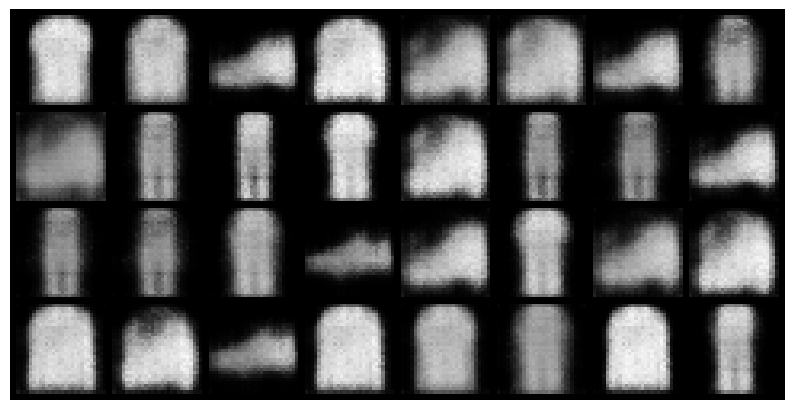

Model 2:


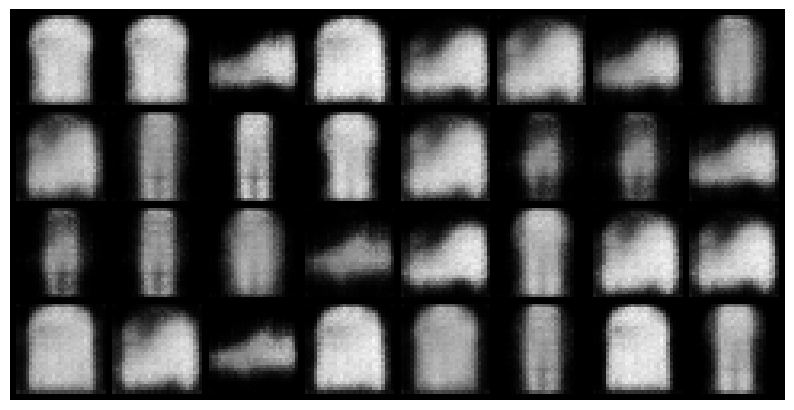

KeyboardInterrupt: ignored

In [21]:
import copy

epochs = 10
n_showplots = 20
n_latent = 10

import pickle
model0 = VAE(n_latent)
model2 = pickle.loads(pickle.dumps(model0))

'''
## added to have same parameters:
seed = 42
torch.manual_seed(seed)
model0 = VAE(n_latent)
torch.manual_seed(seed)
model2 = VAE(n_latent)
'''
optimizer0 = optim.Adam(model0.parameters(), lr=1e-3)
optimizer2 = optim.Adam(model2.parameters(), lr=1e-3)
model0.train()
model2.train()
losses = []
losses2 = []
lossestopo = []
lossestopo2 = []

for epoch in range(epochs):
    for batch_idx, (data, _) in enumerate(train_loader):

        if batch_idx%n_showplots==0 and batch_idx>0:
          plt.plot(np.arange(len(losses)), losses, label='Conv-VAE')
          plt.plot(np.arange(len(lossestopo)), lossestopo, label='Conv-TopoVAE')
          plt.xlabel("Iteration")
          plt.ylabel("BCE loss")
          plt.legend(loc='upper right')
          plt.show()
          plt.plot(np.arange(len(losses2)), losses2, label='Conv-VAE')
          plt.plot(np.arange(len(lossestopo2)), lossestopo2, label='Conv-TopoVAE')
          plt.xlabel("Iteration")
          plt.ylabel("KLD loss")
          plt.legend(loc='upper right')
          plt.show()

        if batch_idx==1: print("done")
        if batch_idx==10: print("done2")
        #data = data.view(data.size(0), -1)
        if batch_idx % n_showplots != 0 or batch_idx==0:
          #get dgm2:
          '''
          points_np = data.view(-1, img_size).numpy()
          dgm2 = ripser_parallel(points_np, maxdim=1, return_generators=True)
          '''
          dgm2 = dgms_batches[batch_idx]

          #update the 2 models:
          optimizer0.zero_grad()
          optimizer2.zero_grad()

          #model0
          recon_batch, mean, log_var = model0(data)
          loss = loss_vae0(recon_batch, data, mean, log_var, 0)
          loss.backward()
          optimizer0.step()

          #model2
          recon_batch, mean, log_var = model2(data)
          dgm = get_dgm(recon_batch.view(data.size(0), -1), 1)
          loss = loss_fctn2(recon_batch, data, mean, log_var, dgm, dgm2, 10., 10.)
          loss.backward()
          optimizer2.step()

          if batch_idx % n_showplots == 1 and batch_idx > 100:
            print(f"Epoch {epoch+1}/{epochs} - Batch {batch_idx}/{len(train_loader)}")
            print("Input: real data (trained on)")
            with torch.no_grad():
                print("Real batch:")
                plot_batch(data)

                print("Model 0:")
                recon_batch, _, _ = model0(data)
                plot_batch(recon_batch)
                print("Model 2:")
                recon_batch, _, _ = model2(data)
                plot_batch(recon_batch)

        else: #ie batch_idx % n_showplots == 0 and >0:
            print(f"Epoch {epoch+1}/{epochs} - Batch {batch_idx}/{len(train_loader)}")
            print("Input: new data (not trained on) and input random latent vectors:")

            with torch.no_grad():
                print("Real batch:")
                plot_batch(data)

                print("Model 0:")
                recon_batch, _, _ = model0(data)
                plot_batch(recon_batch)

                print("Model 2:")
                recon_batch, _, _ = model2(data)
                plot_batch(recon_batch)

                '''
                sampled_latent = torch.randn(32, n_latent)
                #show imgs generated by the 2 models:
                generated_samples = model0.decode(sampled_latent)
                plot_batch(generated_samples)
                '''
    print("end of epoch", epoch)
    plt.plot(np.arange(len(losses)), losses, label='Conv-VAE')
    plt.plot(np.arange(len(lossestopo)), lossestopo, label='Conv-TopoVAE')
    plt.xlabel("Iteration")
    plt.ylabel("BCE loss")
    plt.legend(loc='upper right')
    plt.show()
    plt.plot(np.arange(len(losses2)), losses2, label='Conv-VAE')
    plt.plot(np.arange(len(lossestopo2)), lossestopo2, label='Conv-TopoVAE')
    plt.xlabel("Iteration")
    plt.ylabel("KLD loss")
    plt.legend(loc='upper right')
    plt.show()

Test consistency of difference between vae0 and topovae2:

seed 10
done
done2


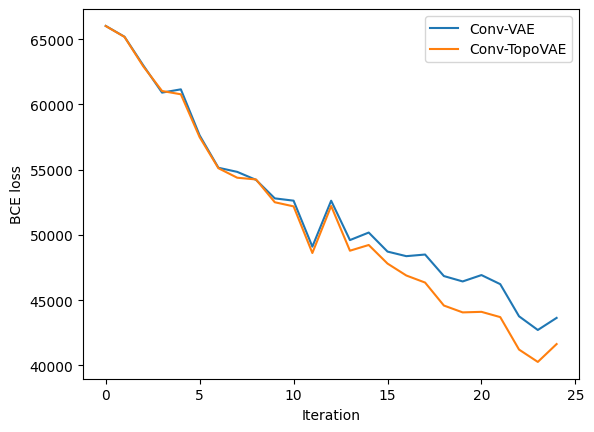

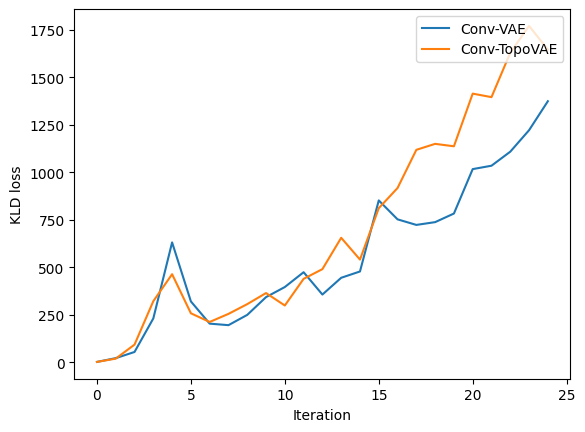

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


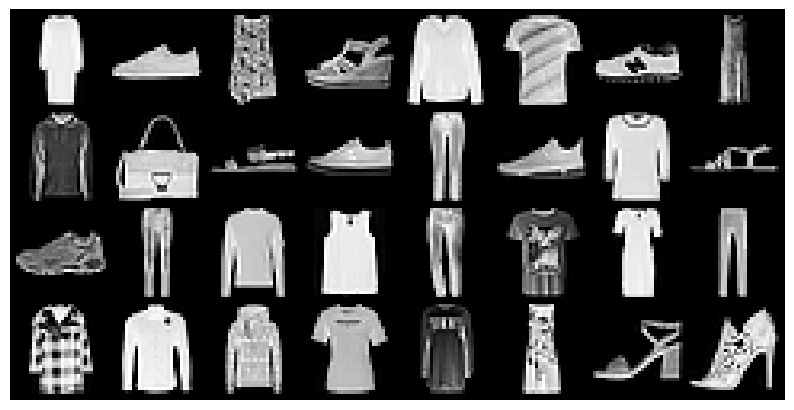

Model 0:


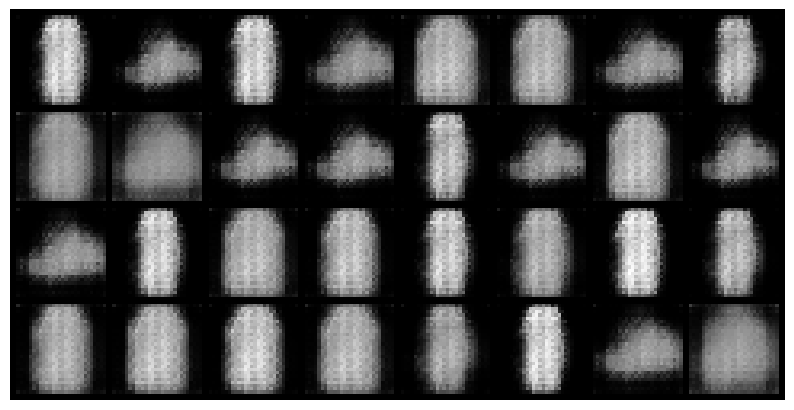

Model 2:


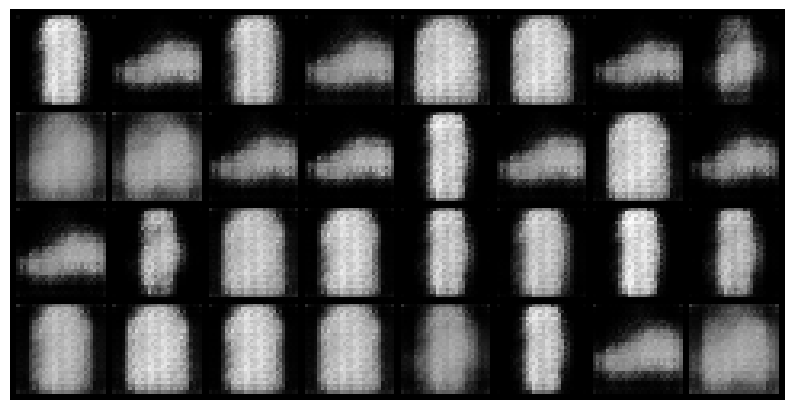

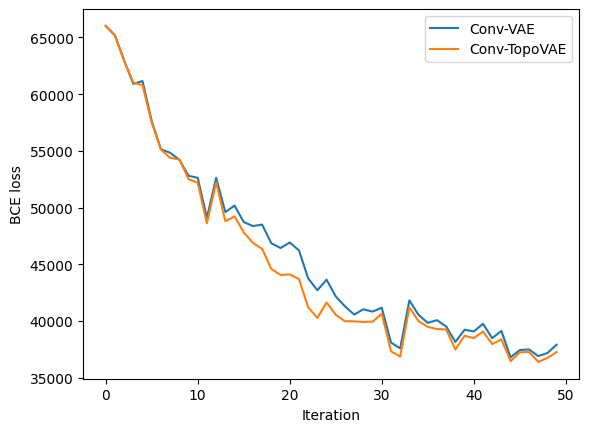

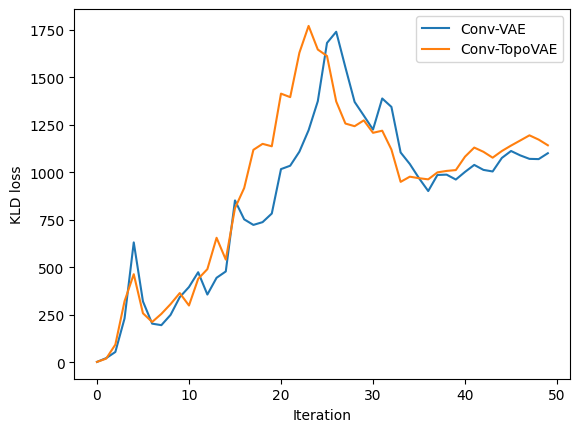

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


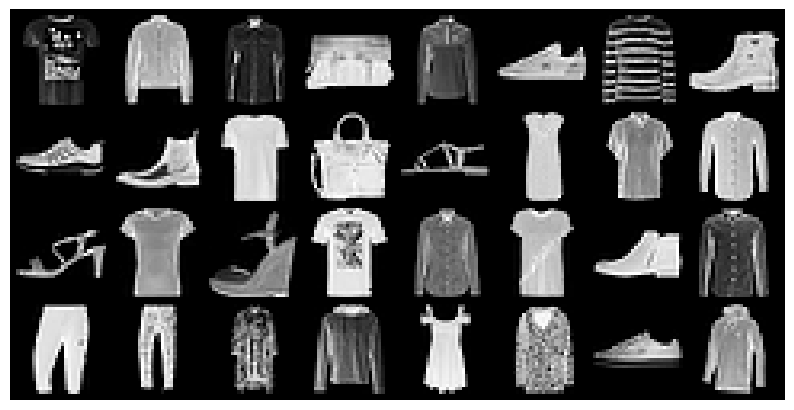

Model 0:


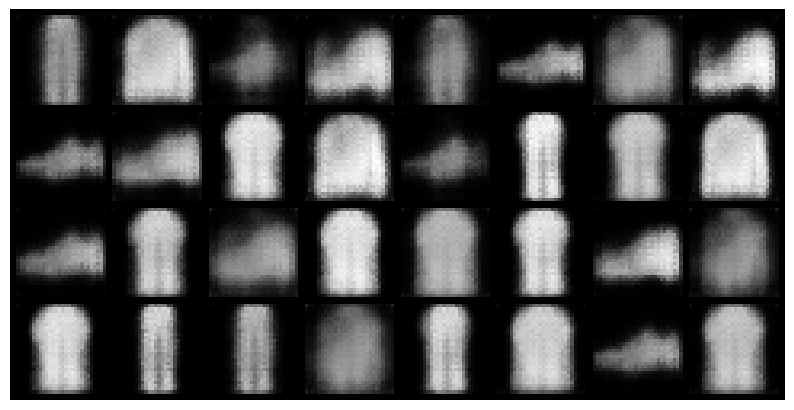

Model 2:


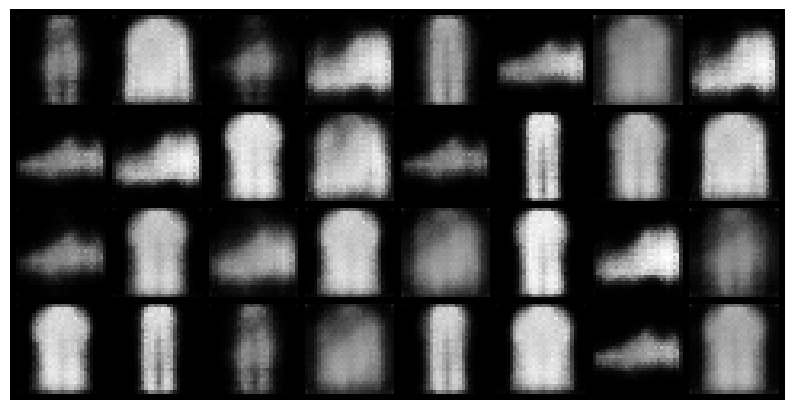

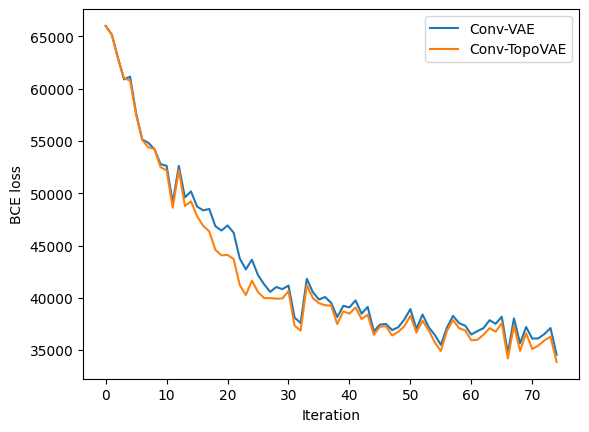

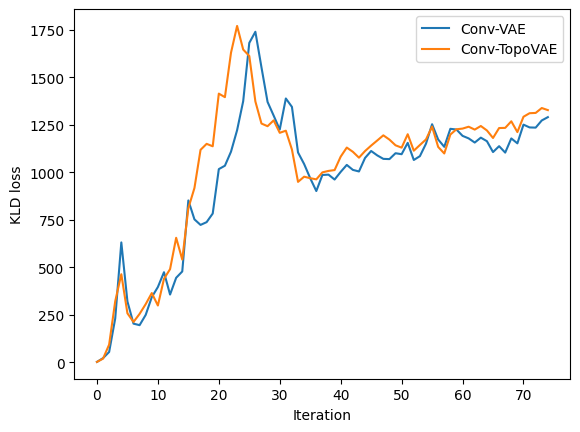

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


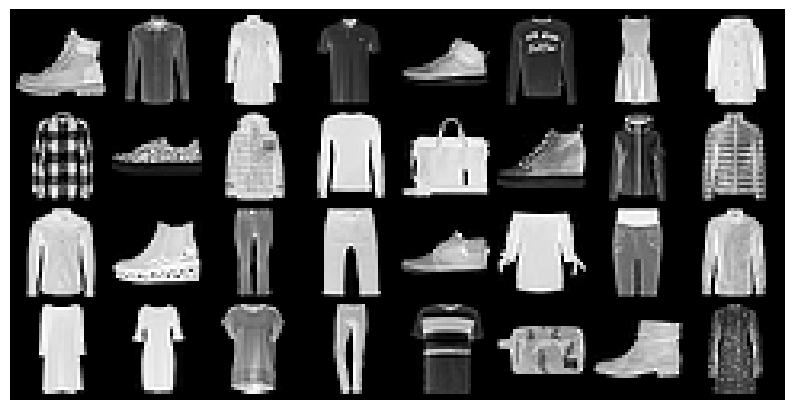

Model 0:


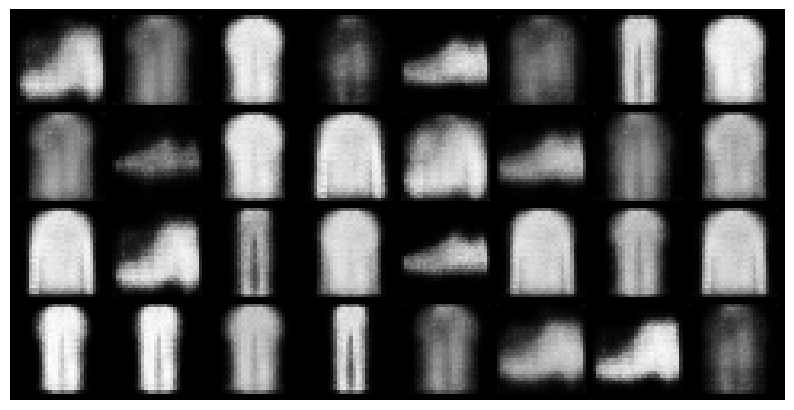

Model 2:


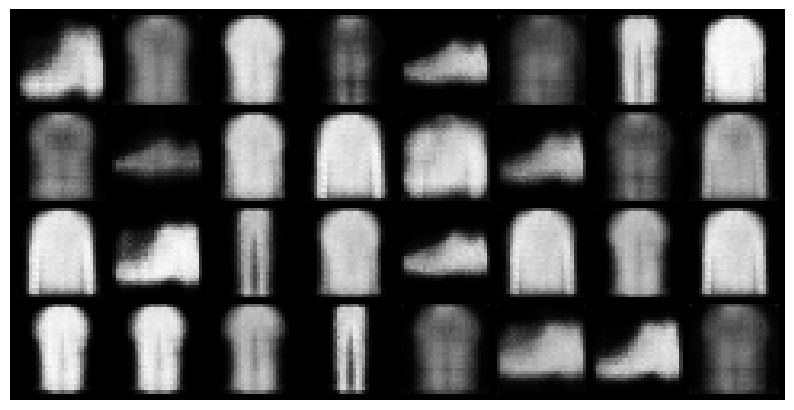

seed 31
done
done2


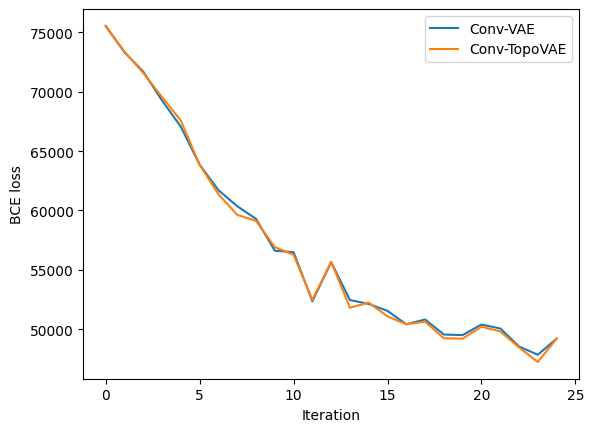

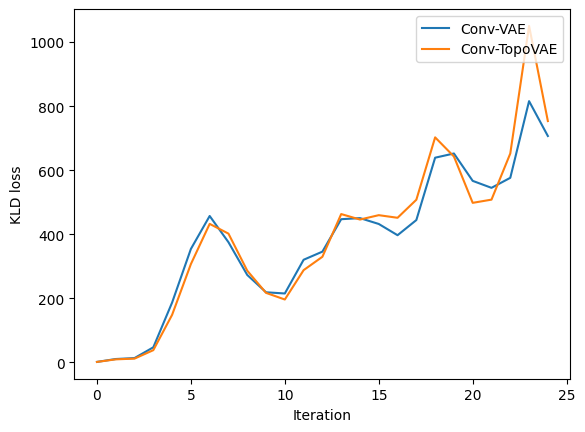

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


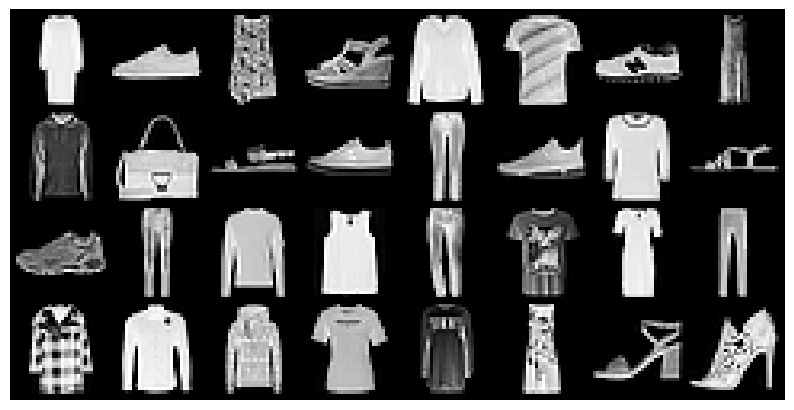

Model 0:


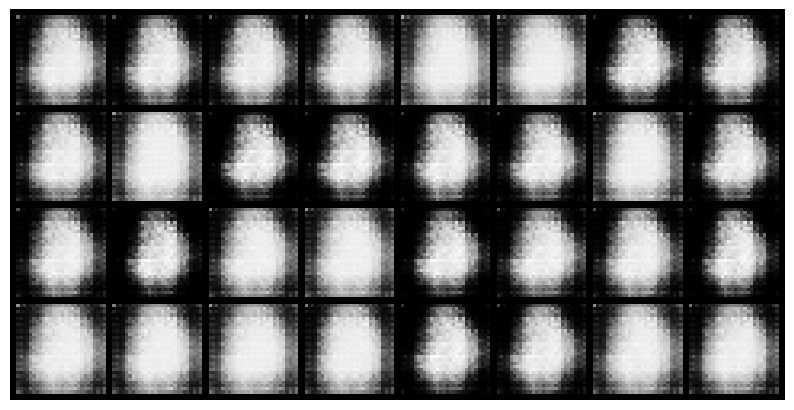

Model 2:


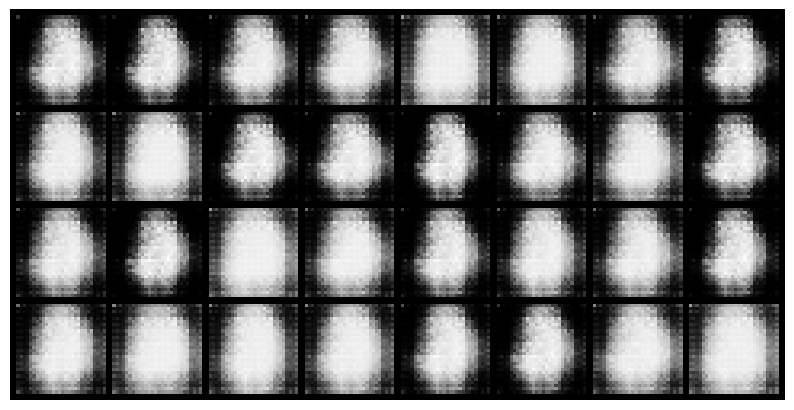

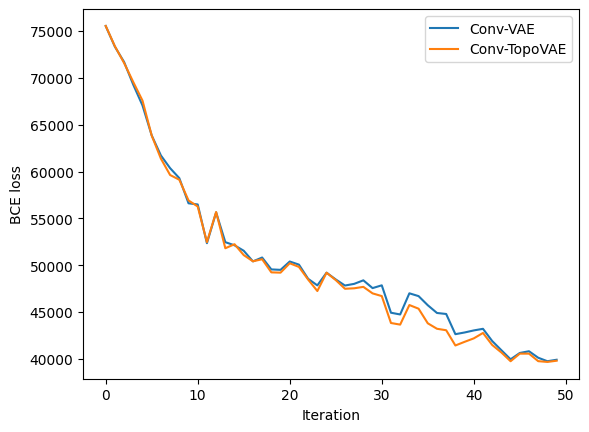

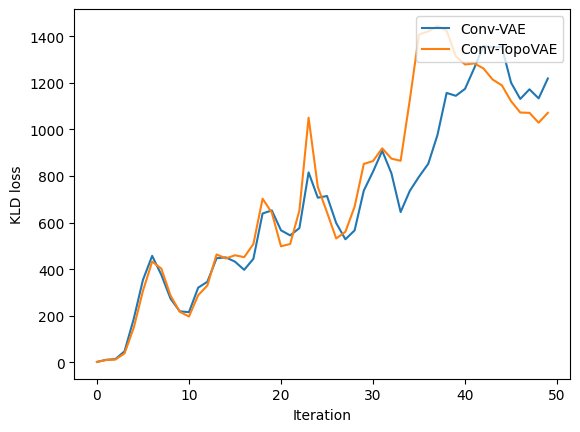

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


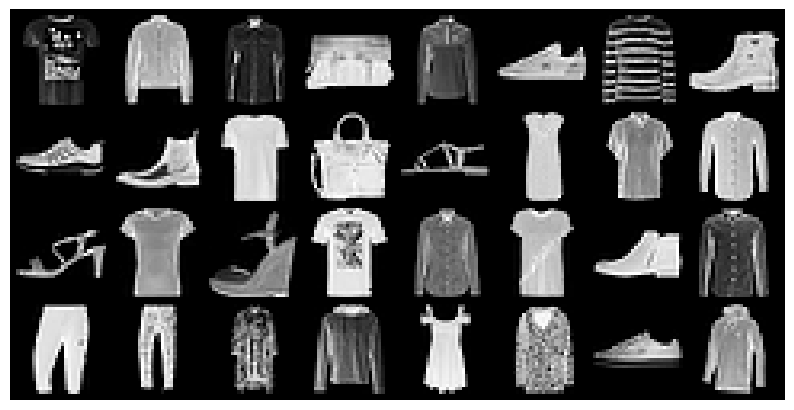

Model 0:


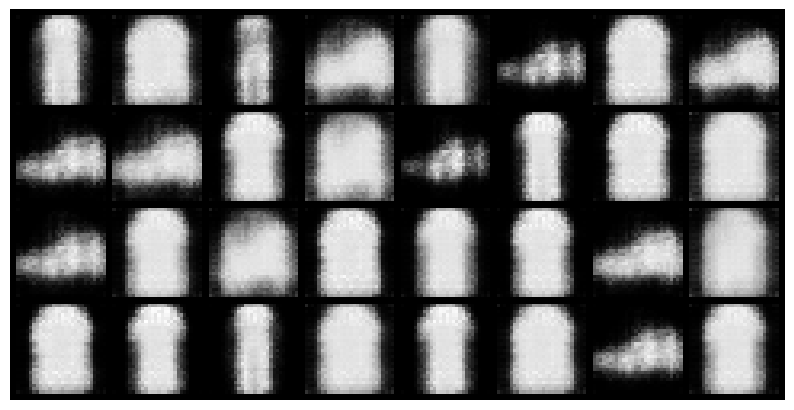

Model 2:


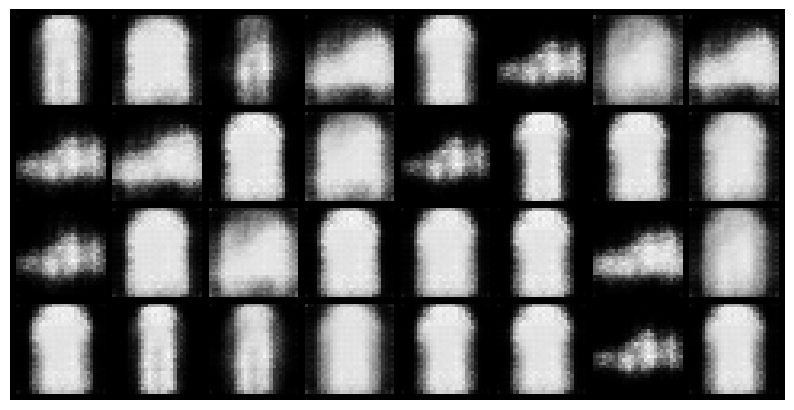

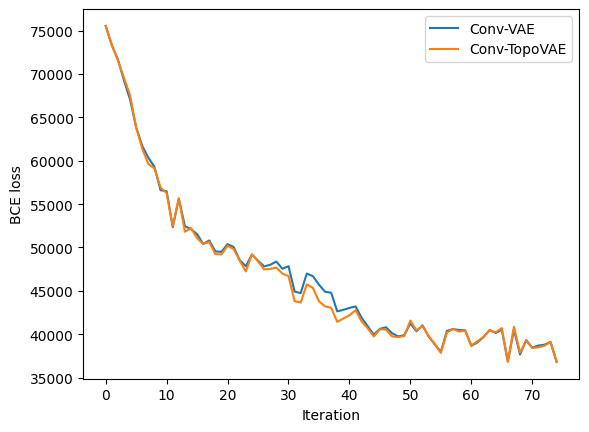

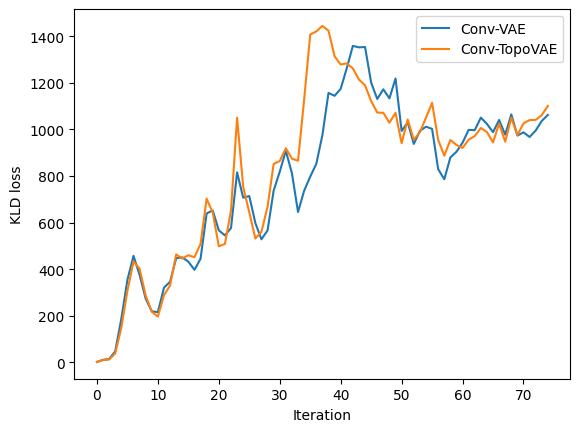

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


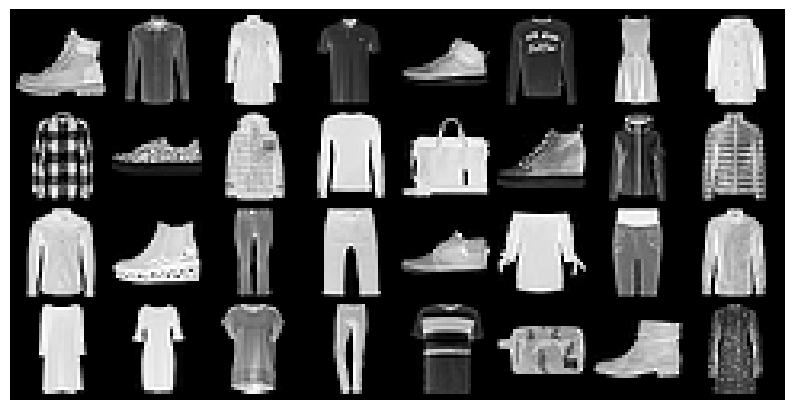

Model 0:


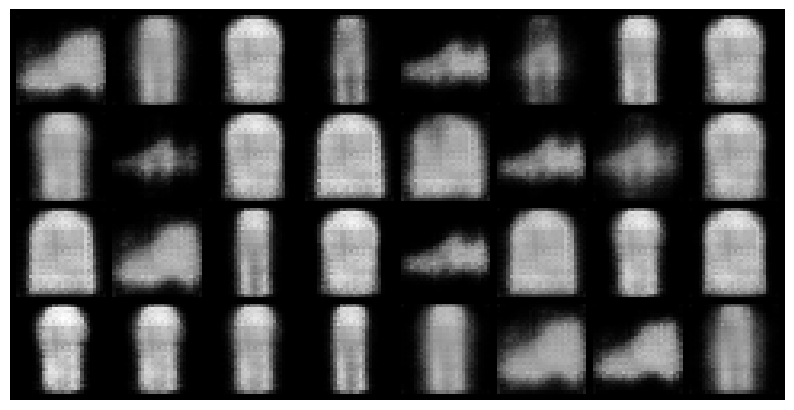

Model 2:


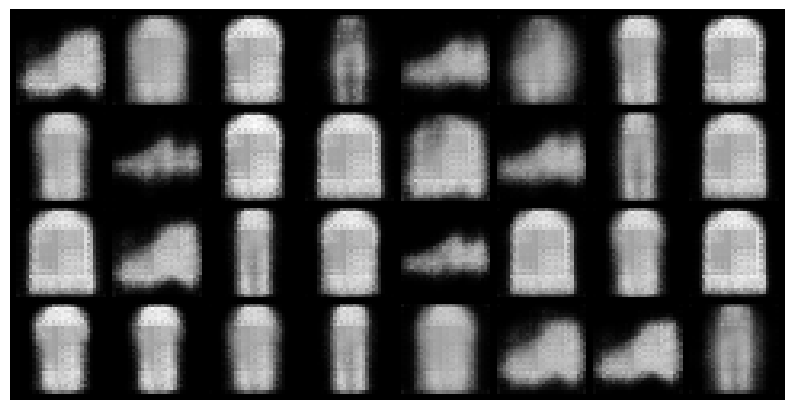

seed 22
done
done2


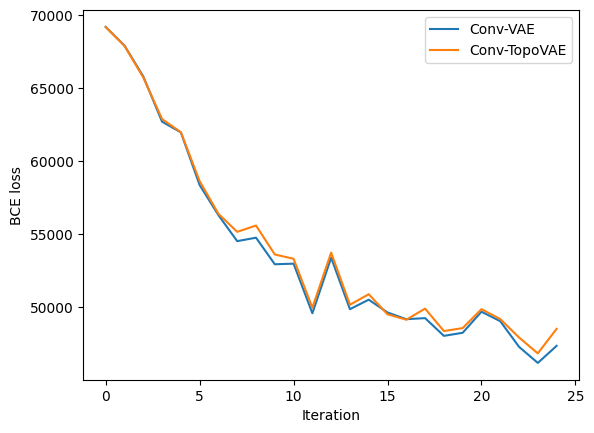

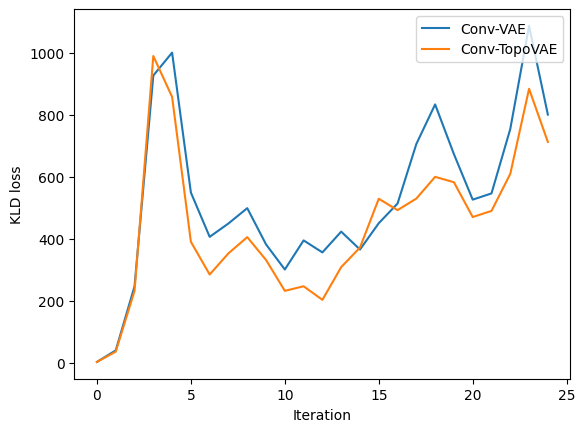

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


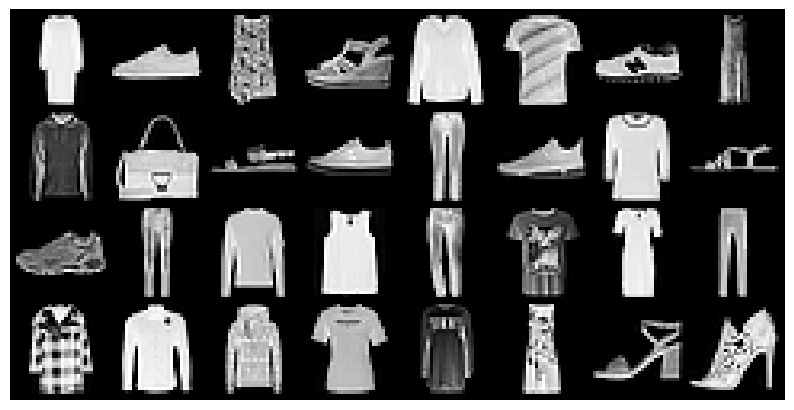

Model 0:


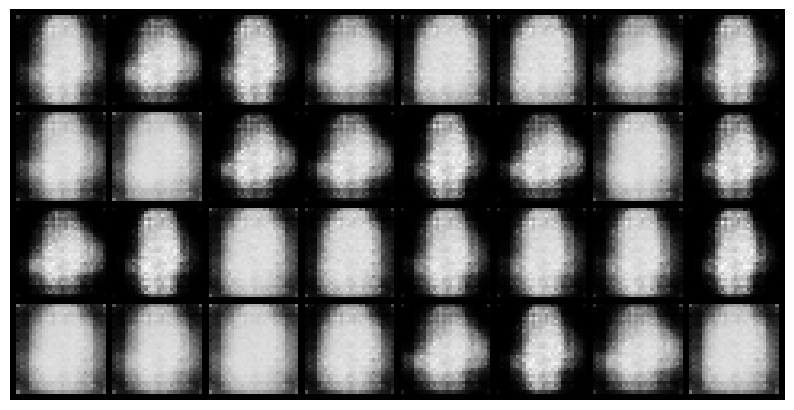

Model 2:


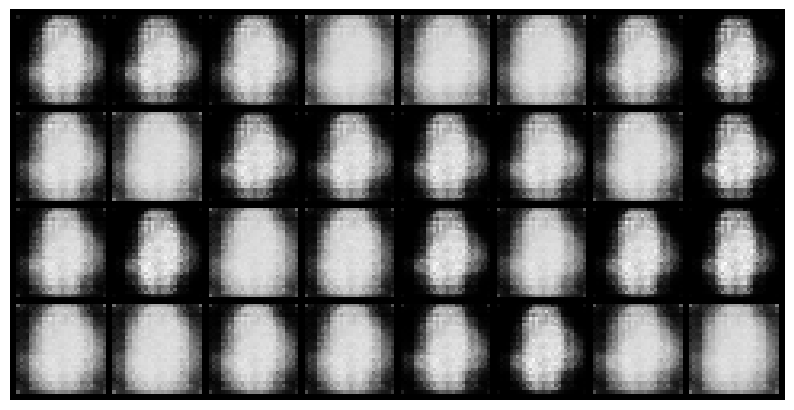

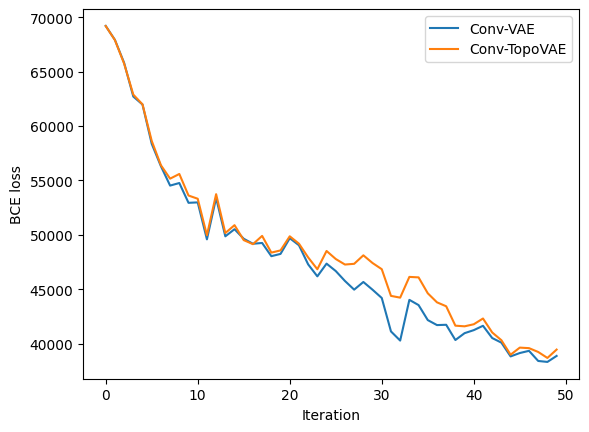

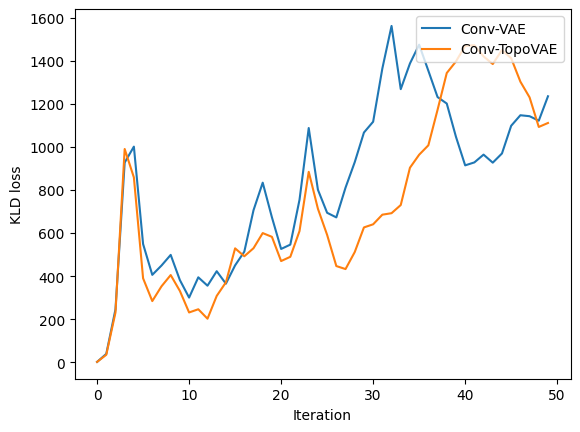

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


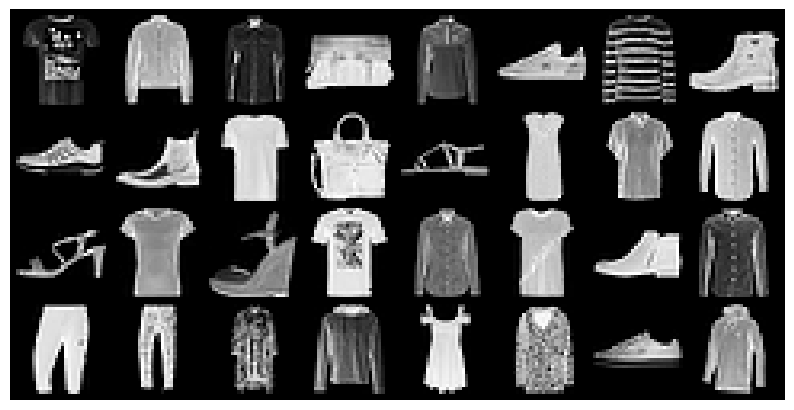

Model 0:


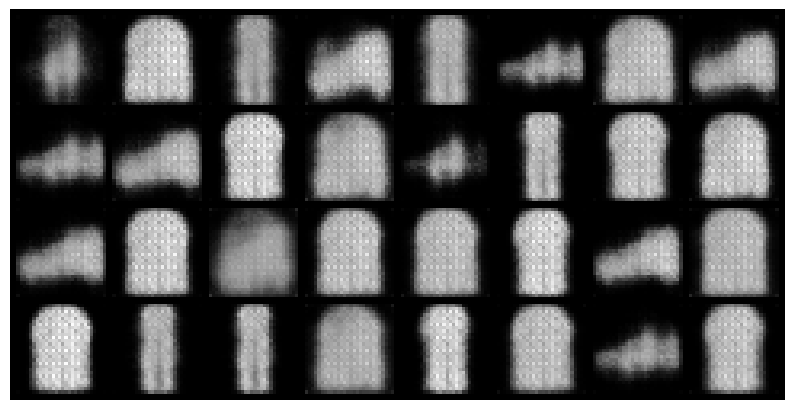

Model 2:


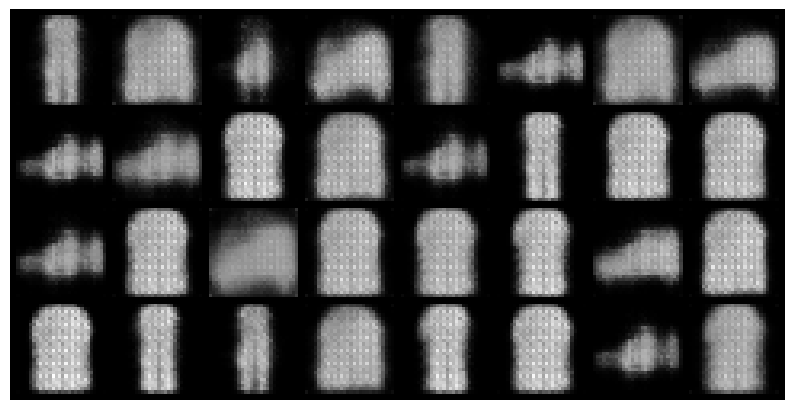

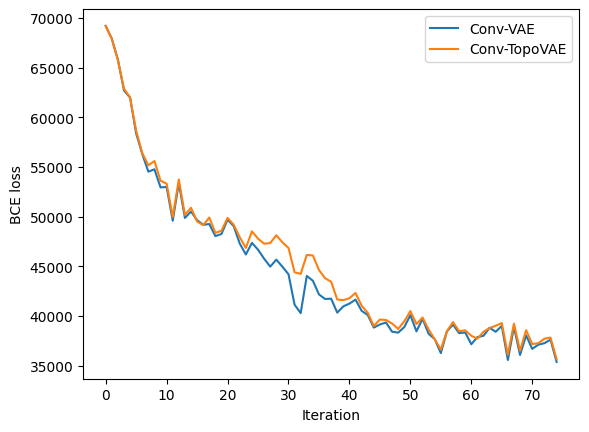

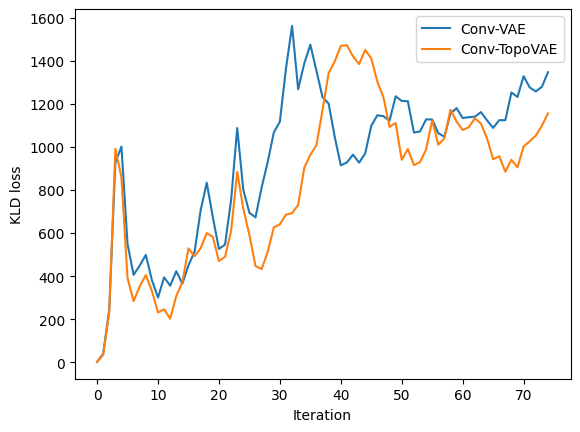

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


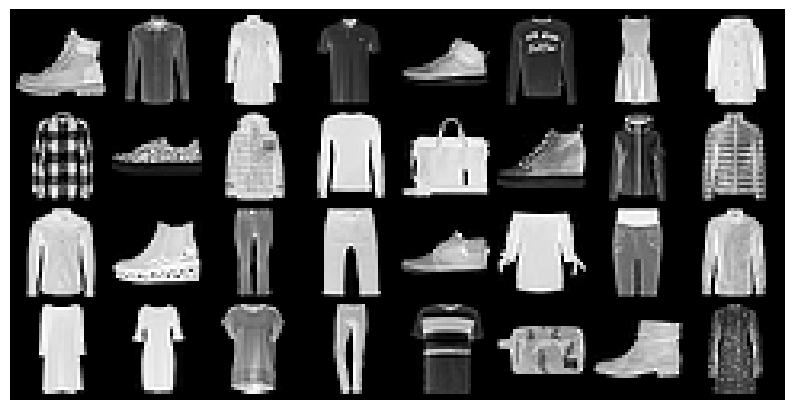

Model 0:


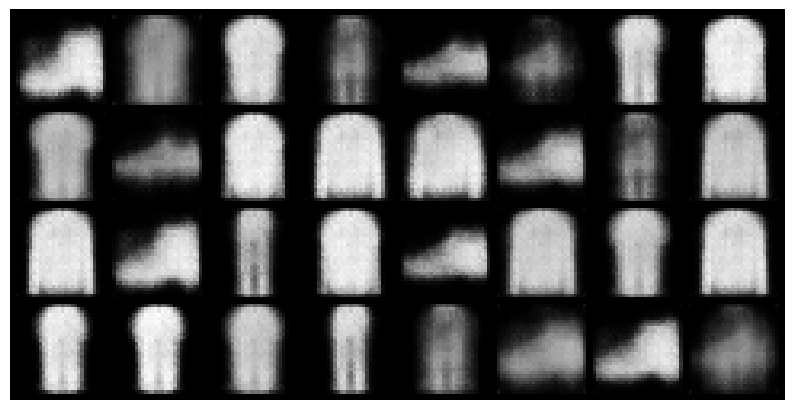

Model 2:


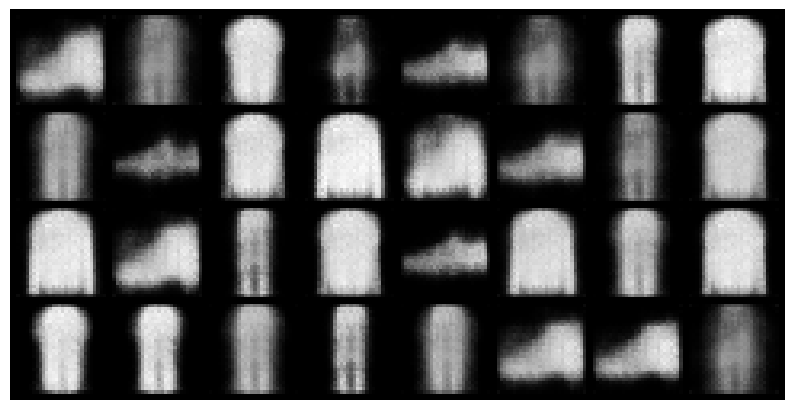

seed 83
done
done2


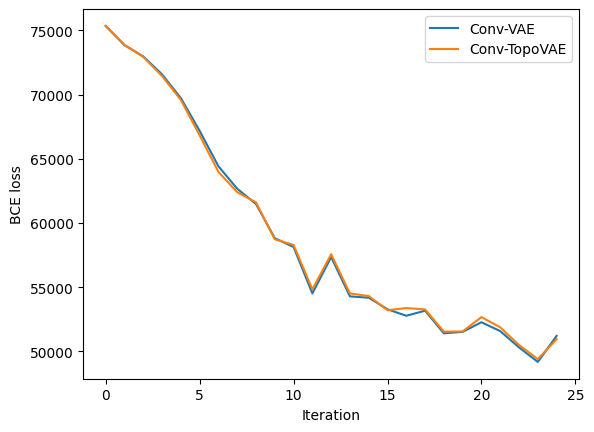

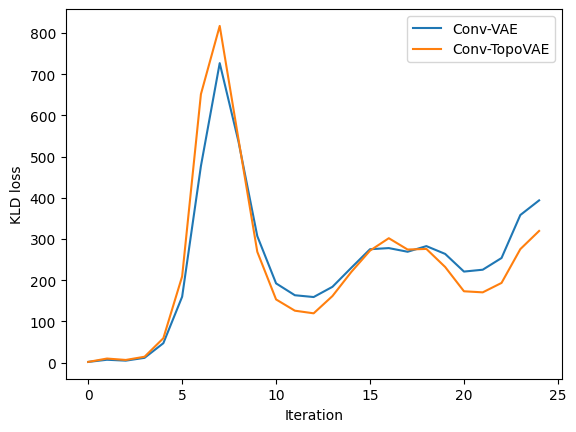

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


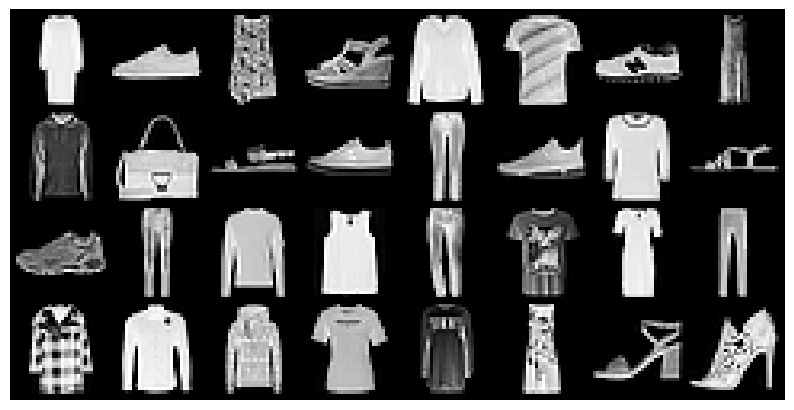

Model 0:


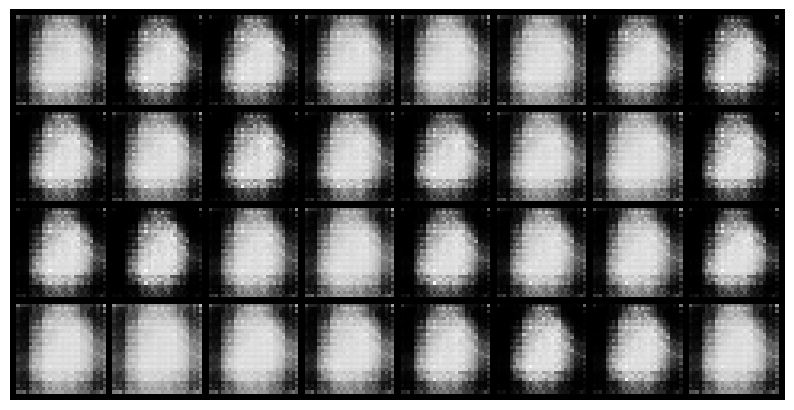

Model 2:


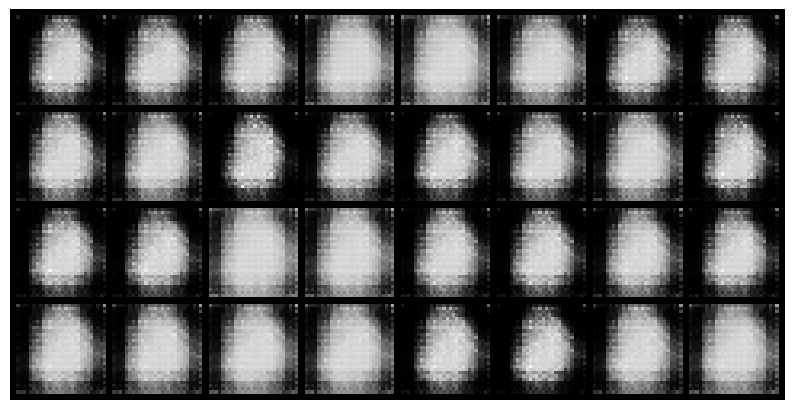

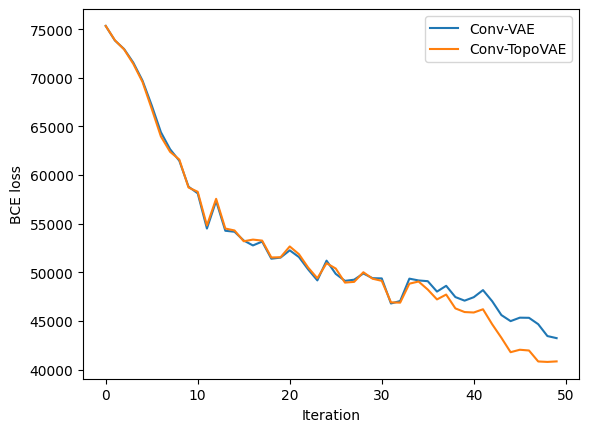

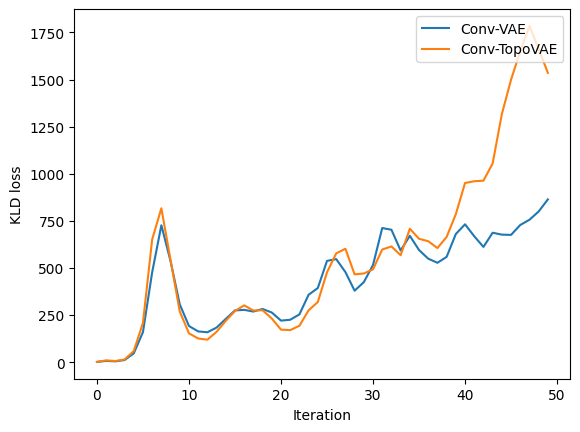

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


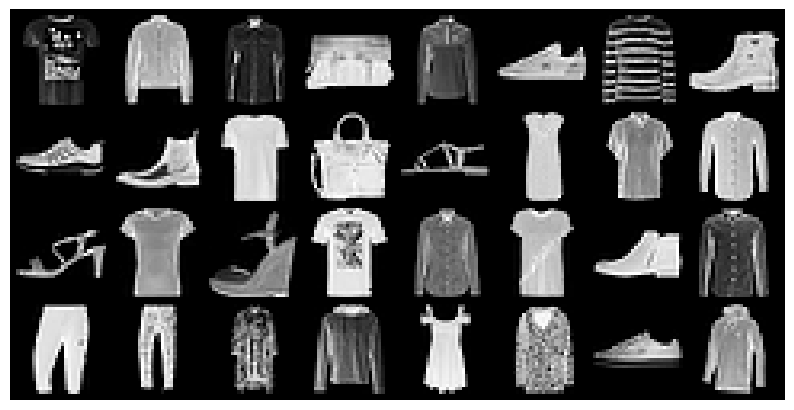

Model 0:


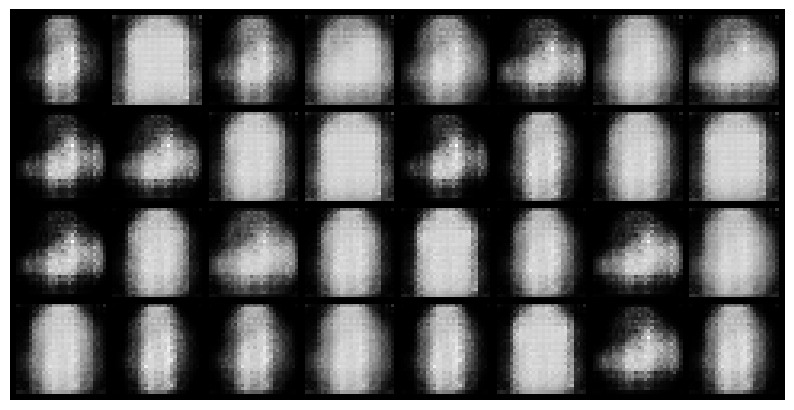

Model 2:


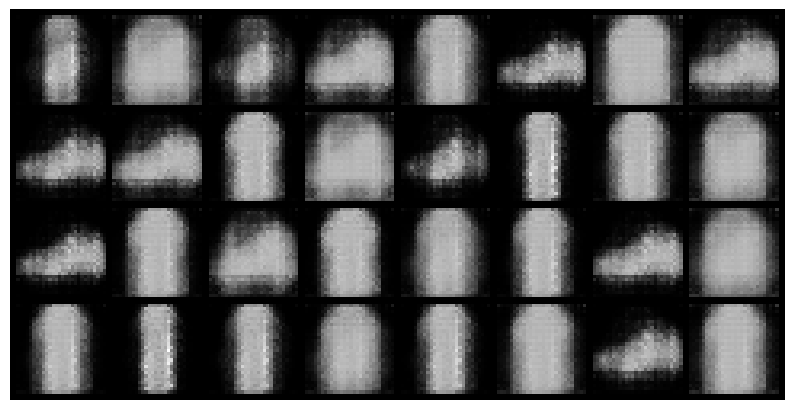

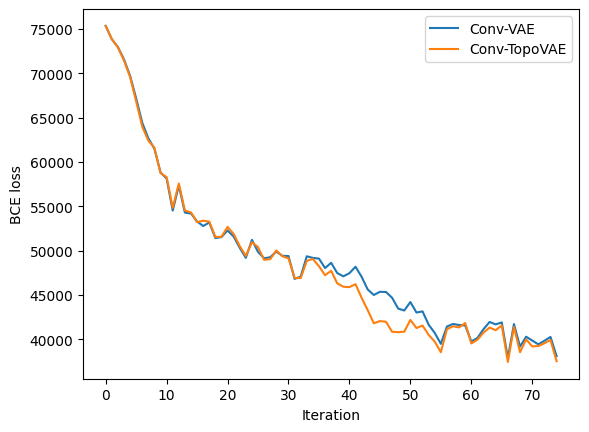

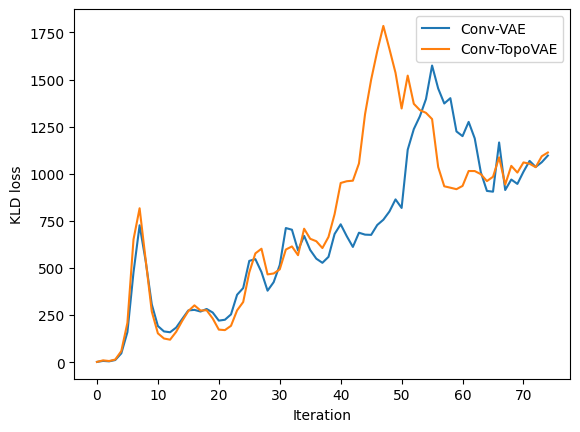

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


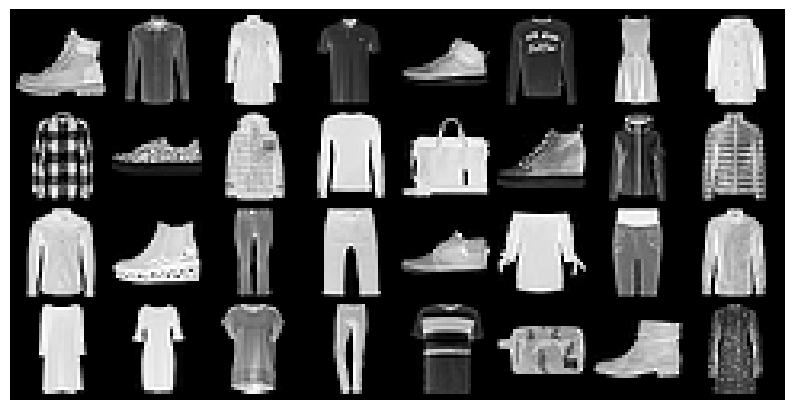

Model 0:


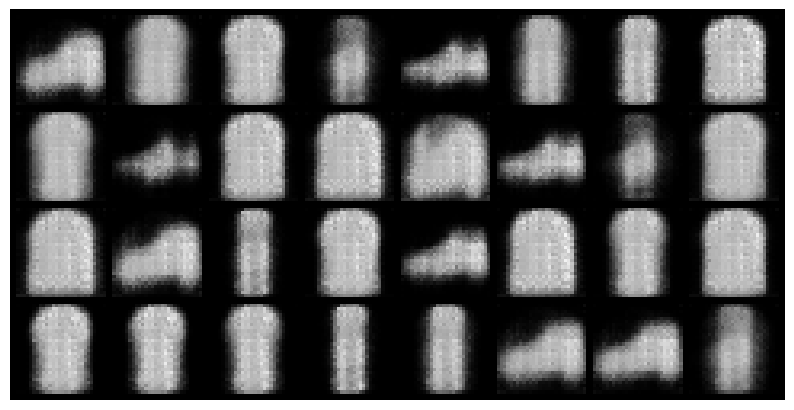

Model 2:


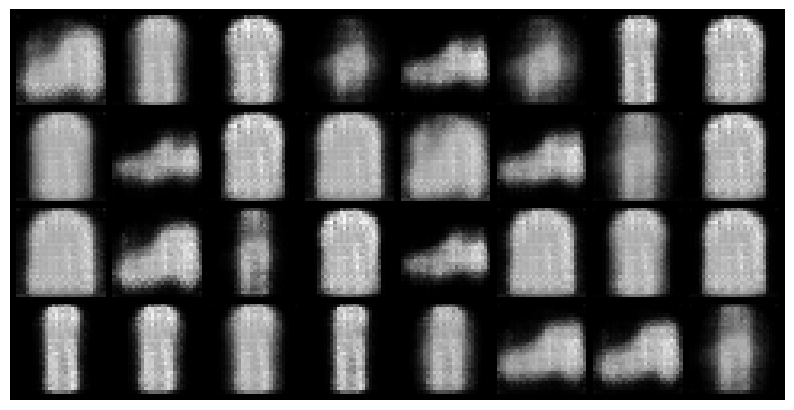

seed 44
done
done2


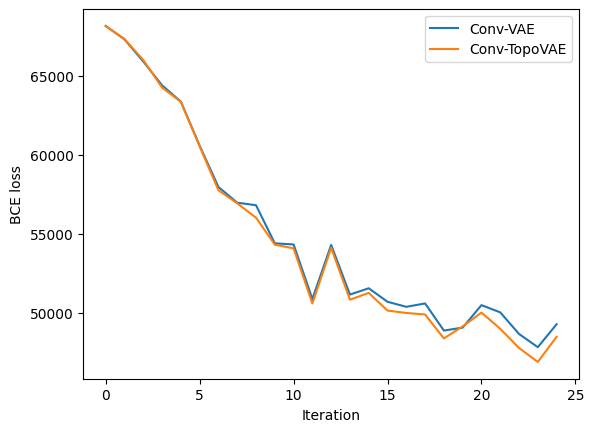

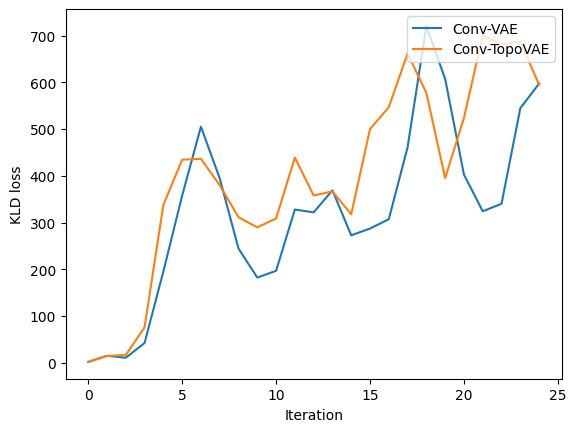

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


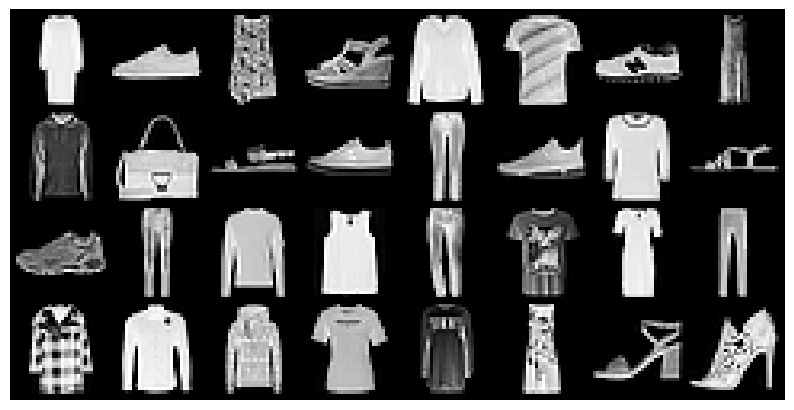

Model 0:


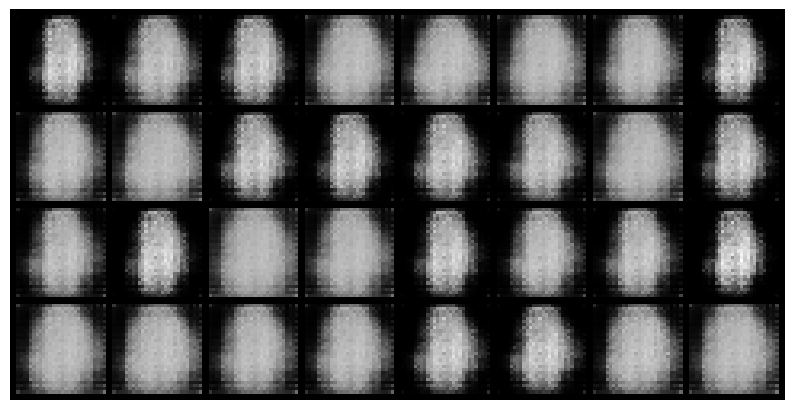

Model 2:


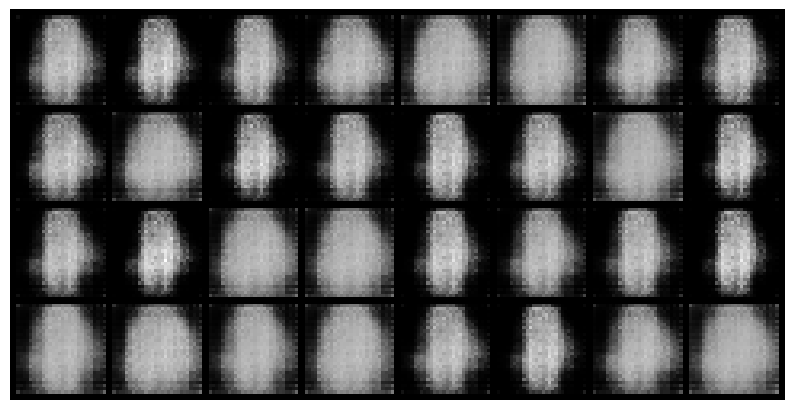

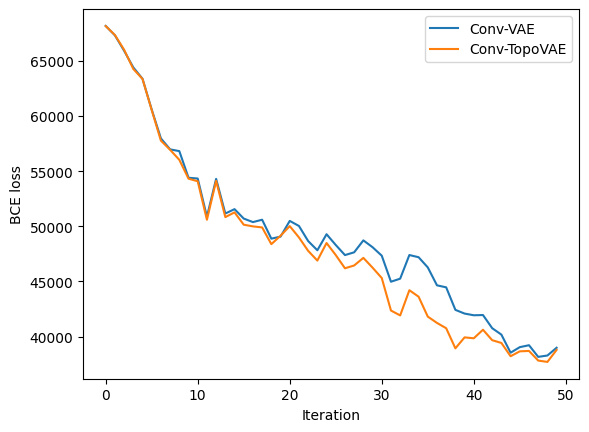

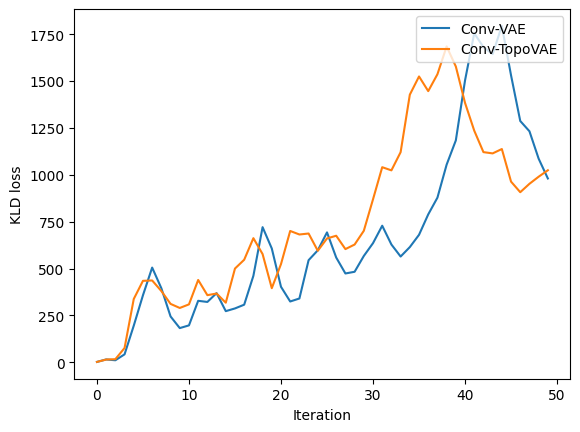

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


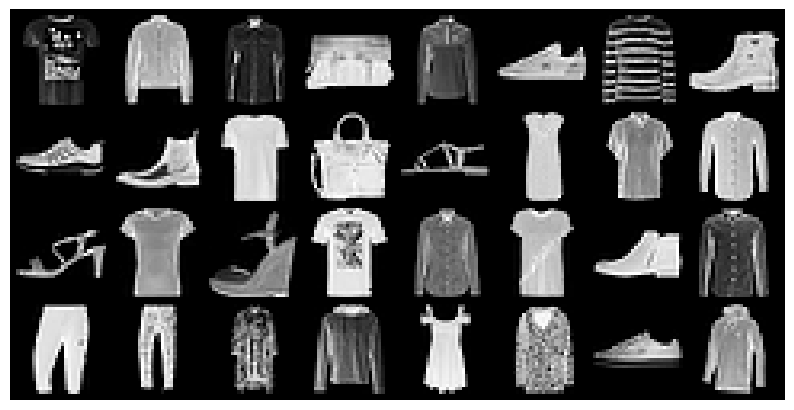

Model 0:


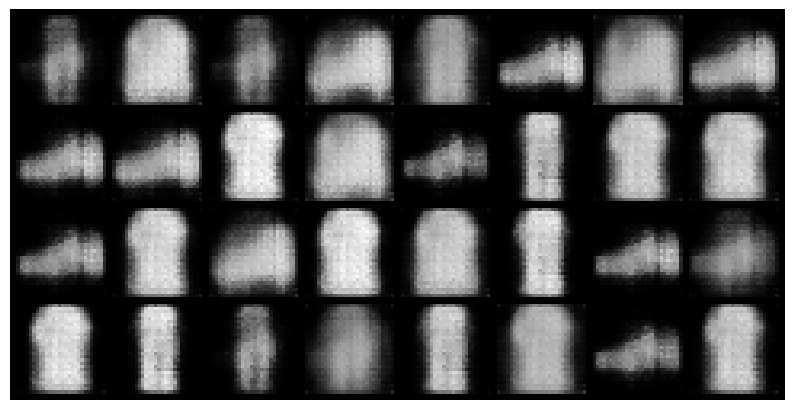

Model 2:


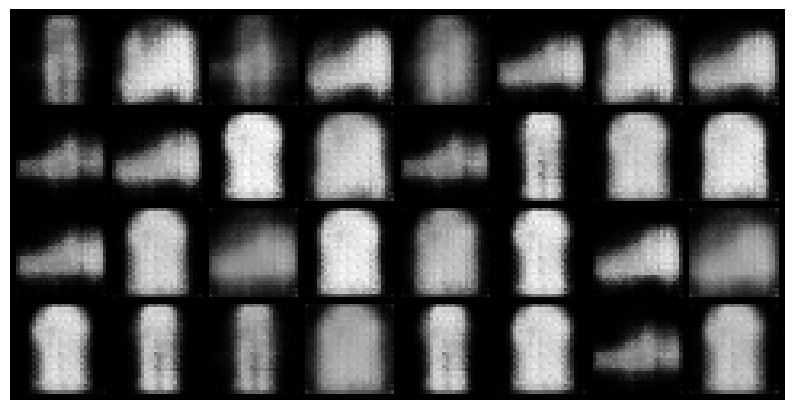

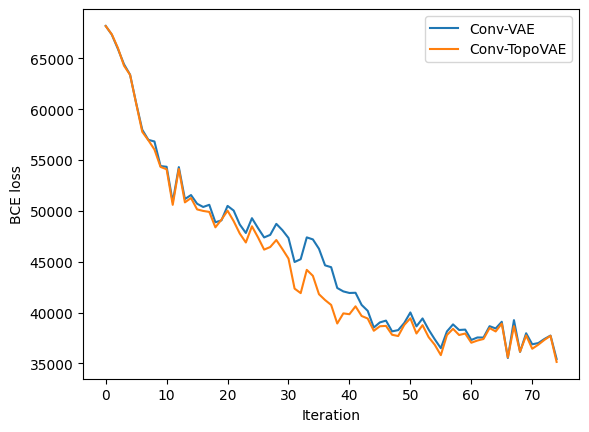

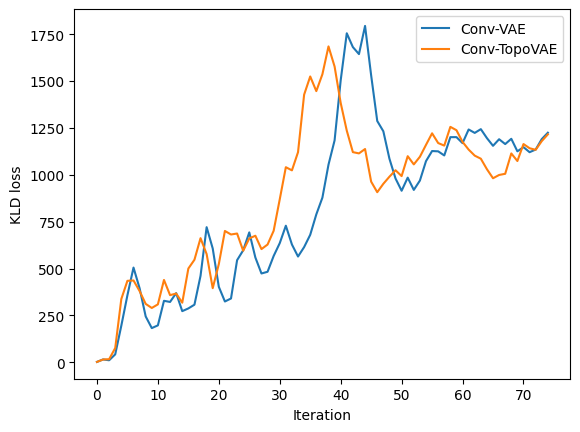

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


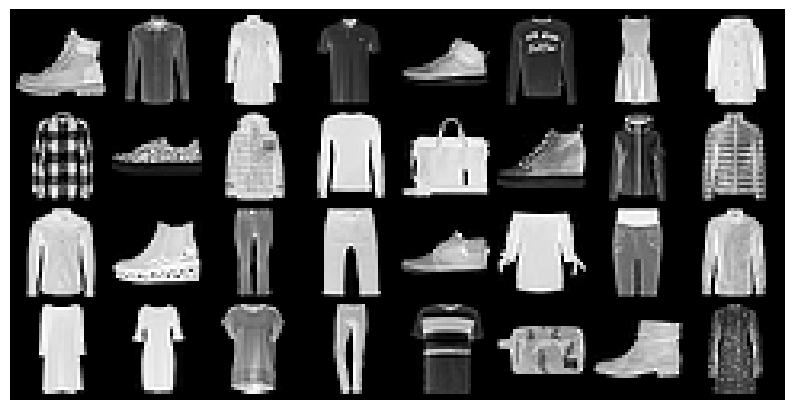

Model 0:


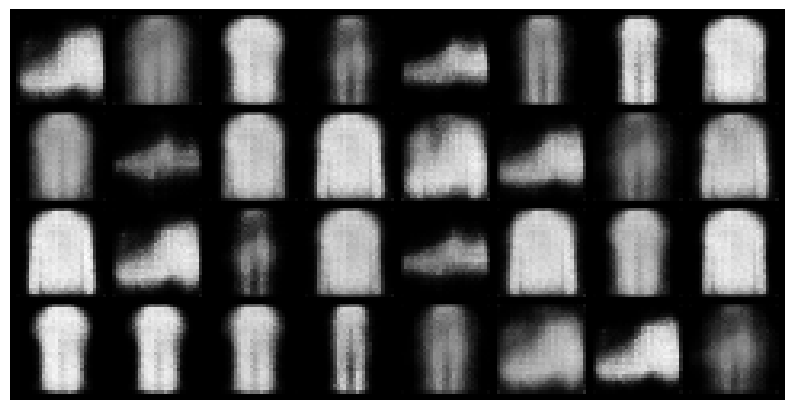

Model 2:


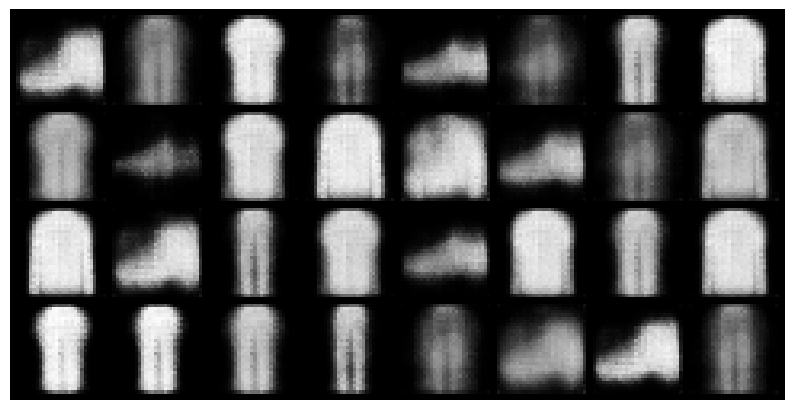

seed 15
done
done2


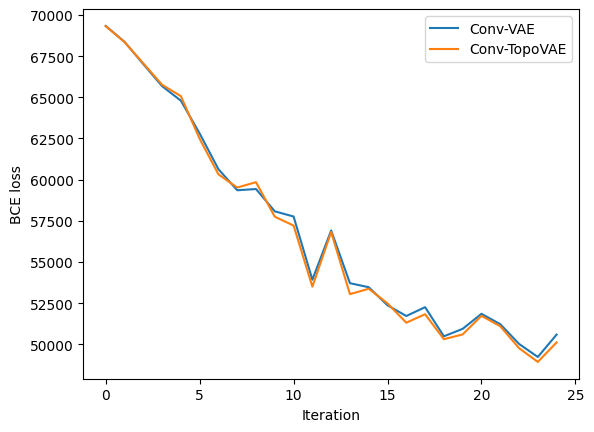

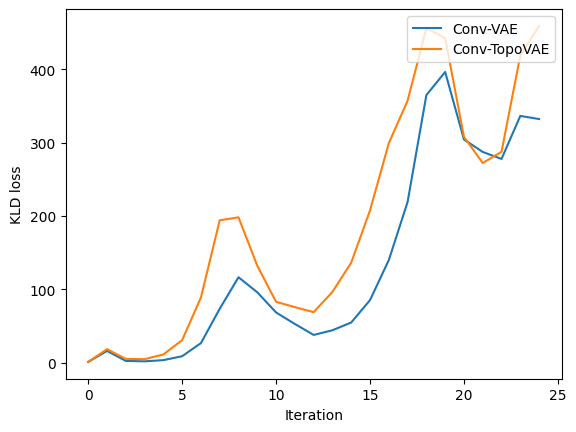

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


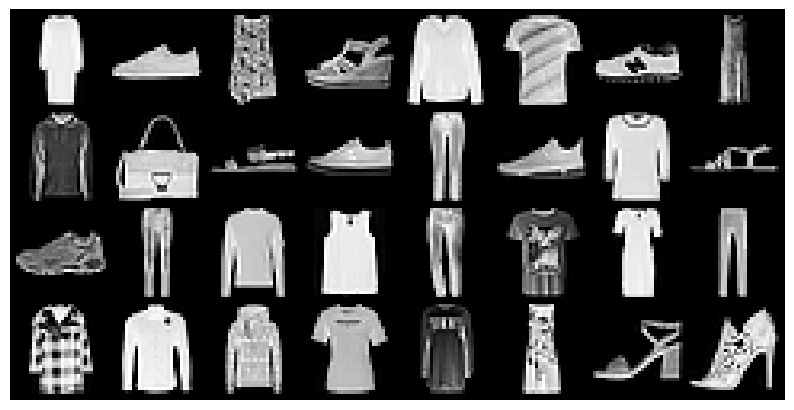

Model 0:


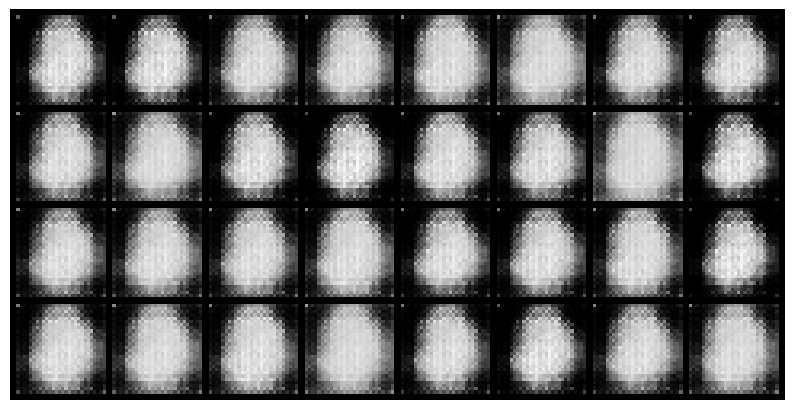

Model 2:


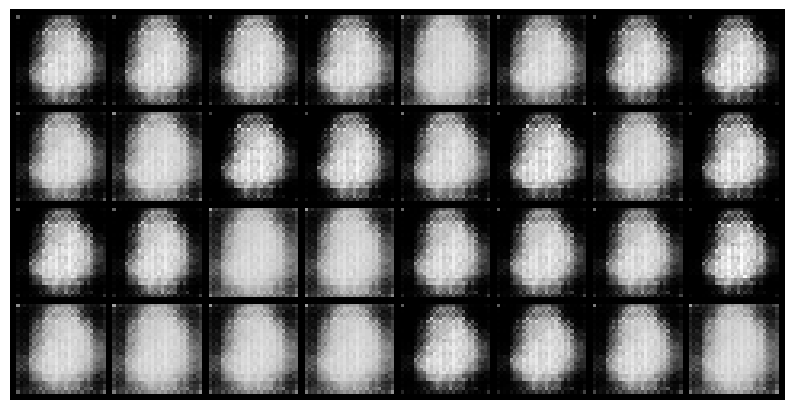

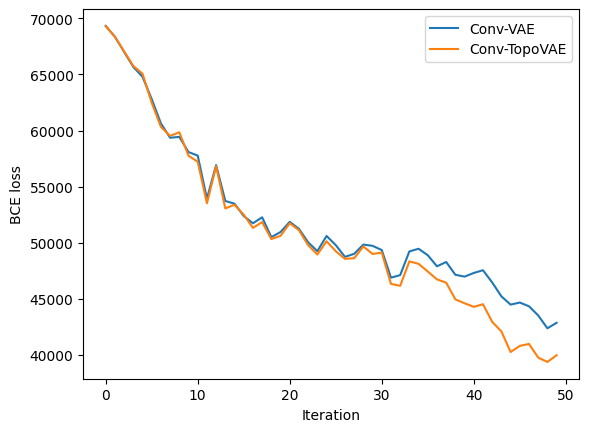

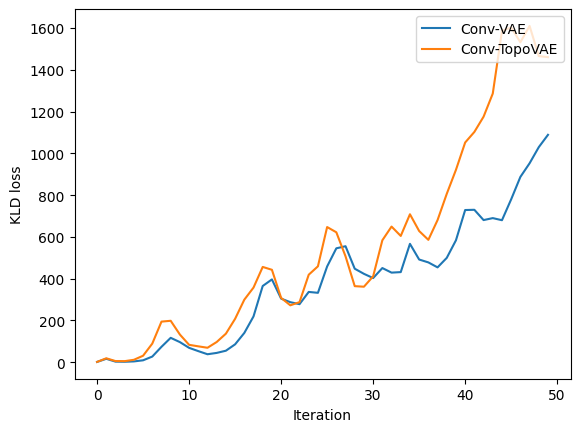

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


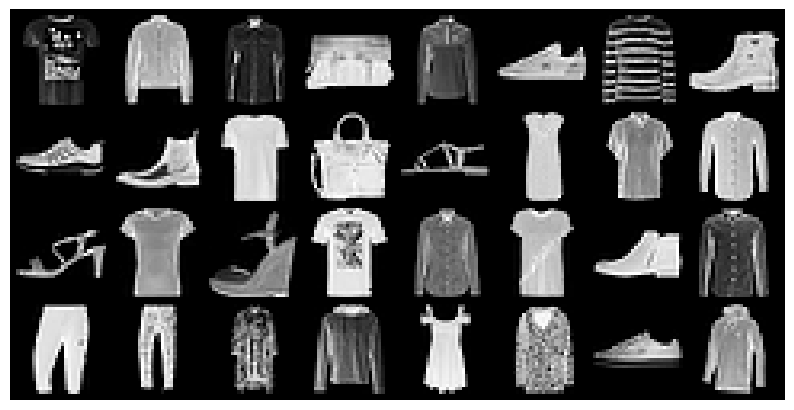

Model 0:


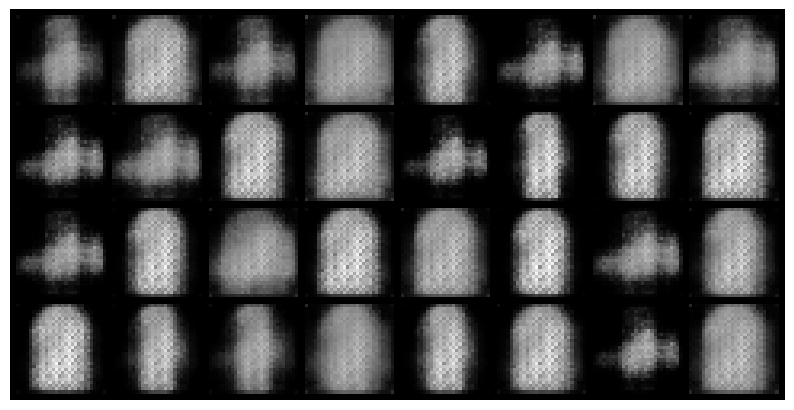

Model 2:


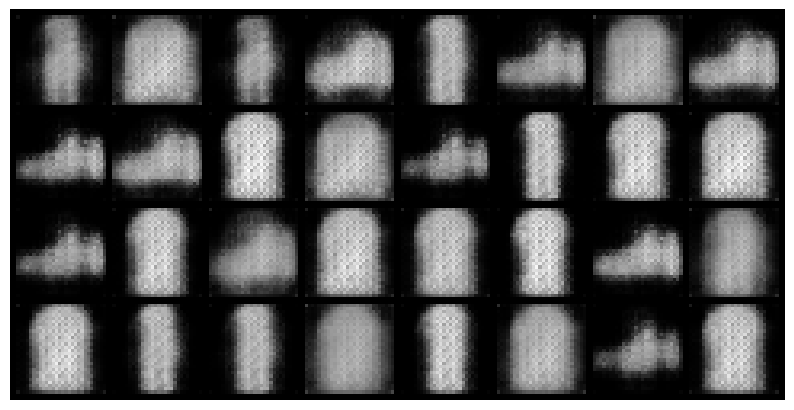

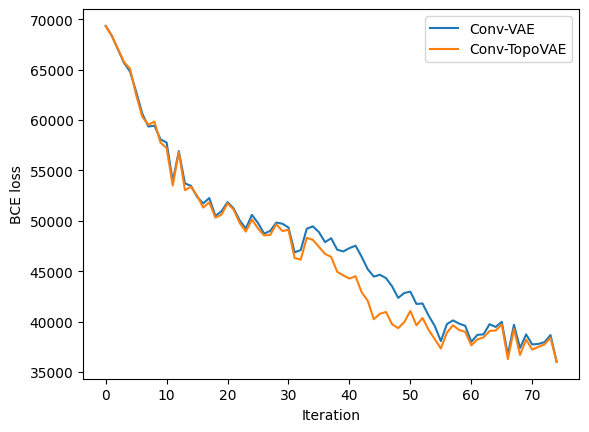

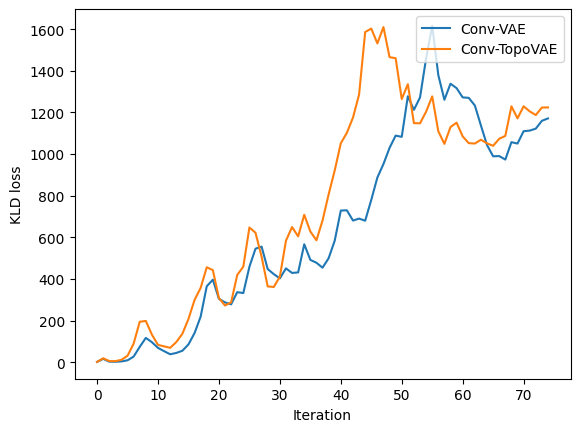

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


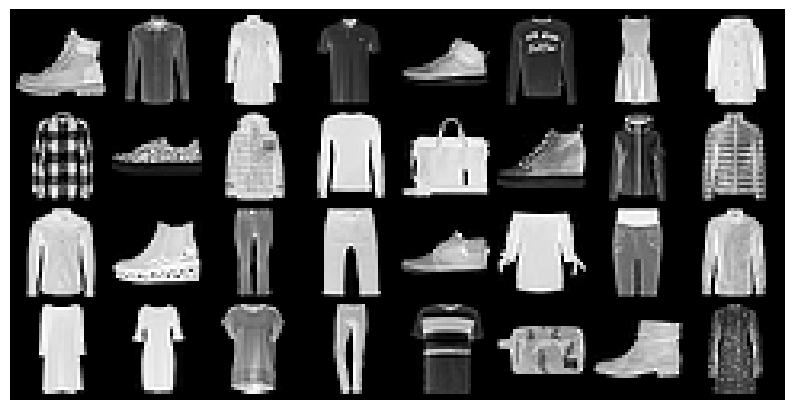

Model 0:


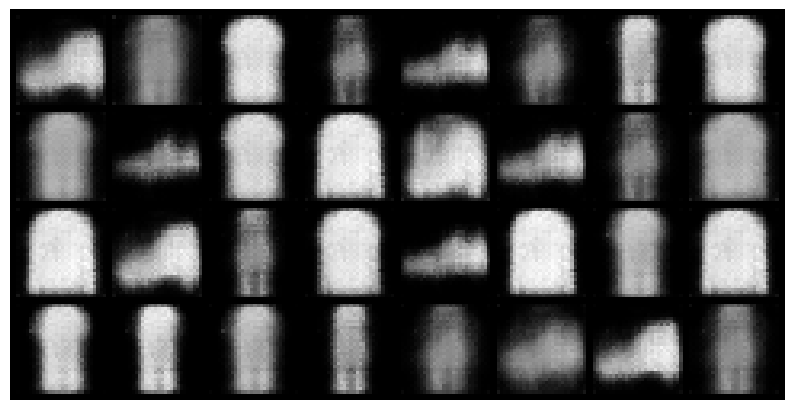

Model 2:


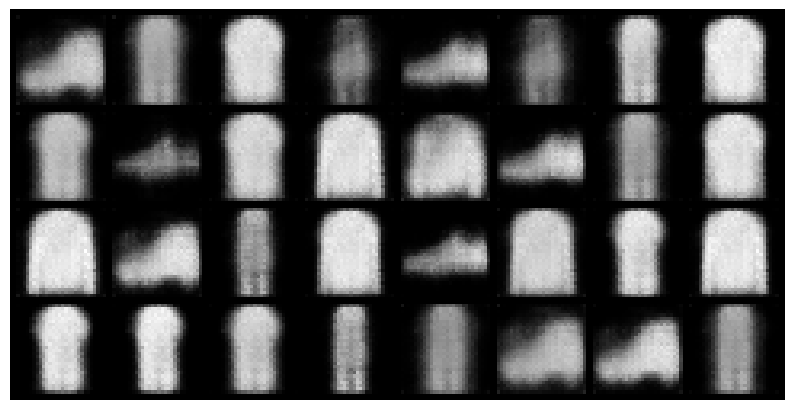

seed 65
done
done2


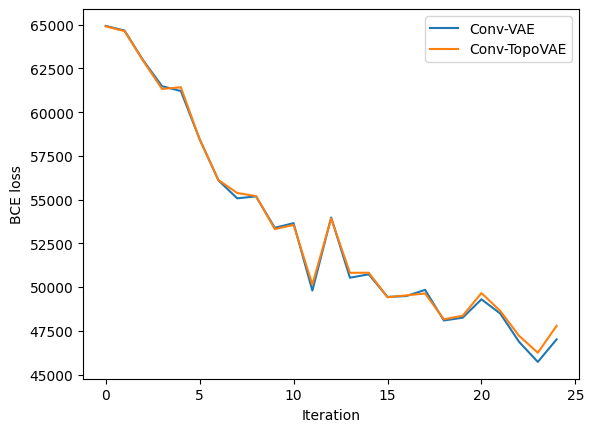

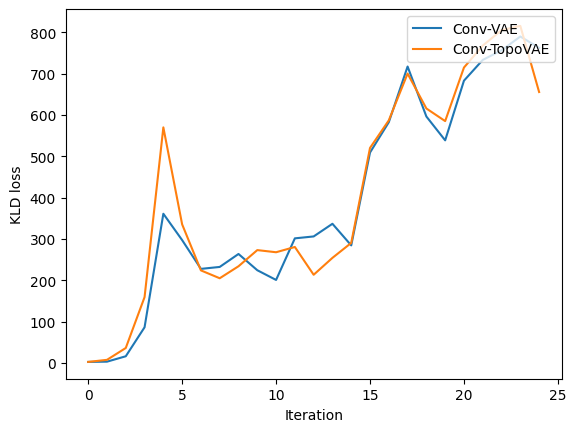

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


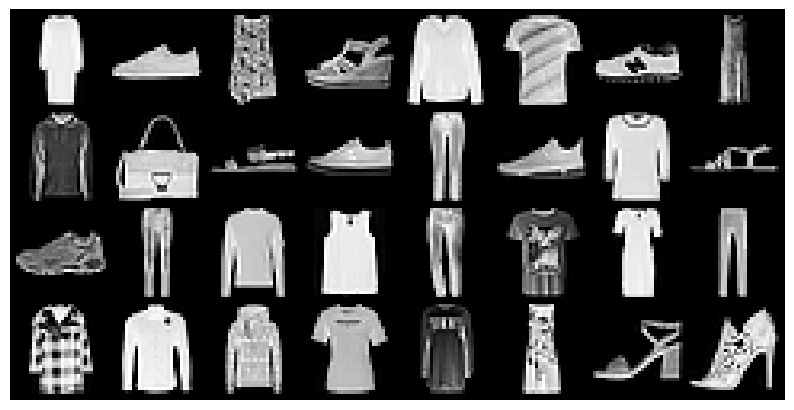

Model 0:


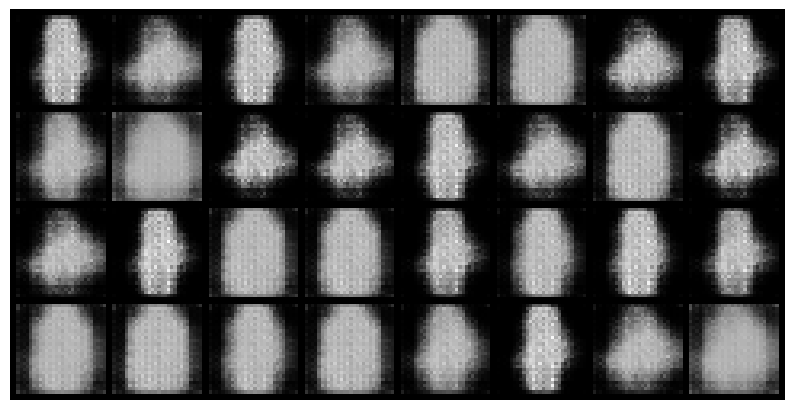

Model 2:


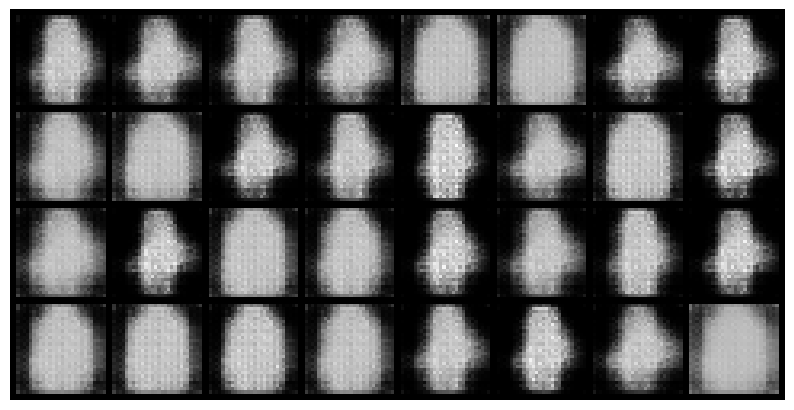

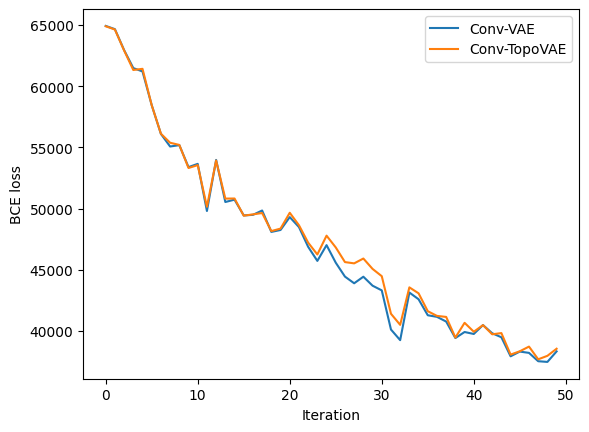

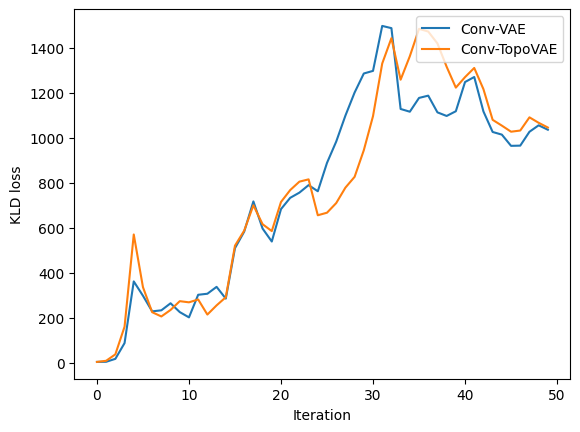

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


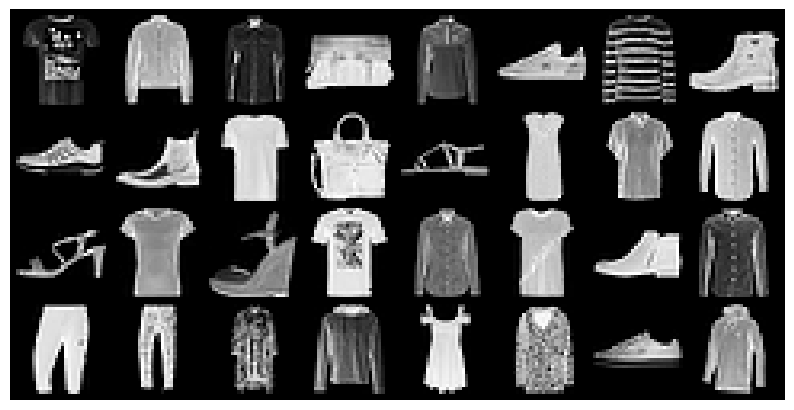

Model 0:


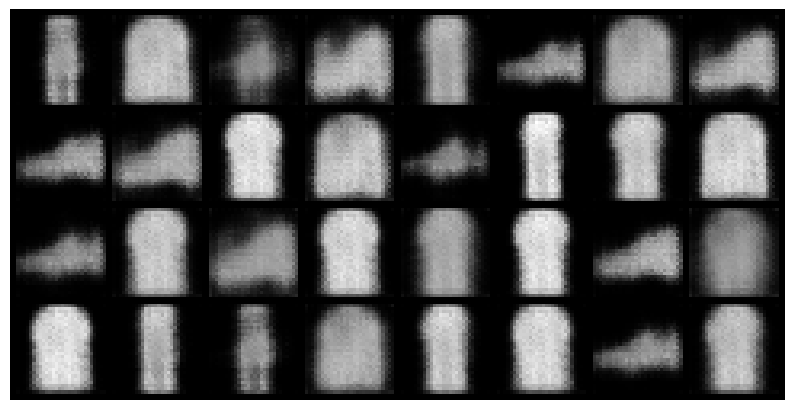

Model 2:


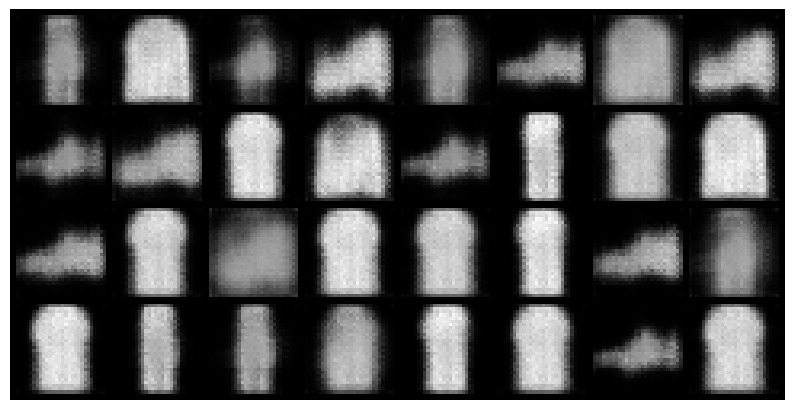

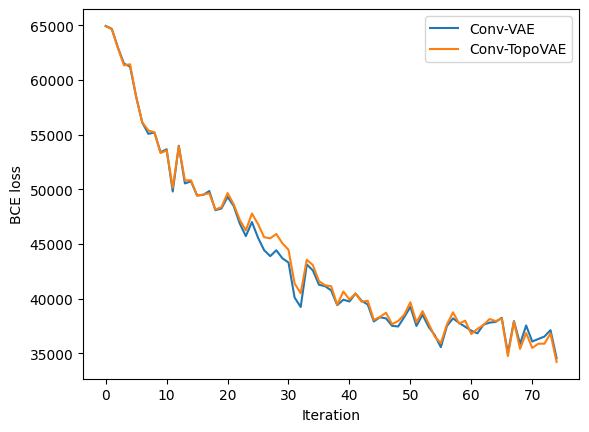

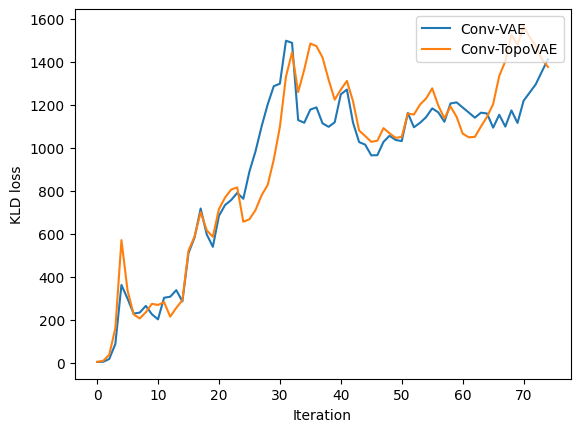

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


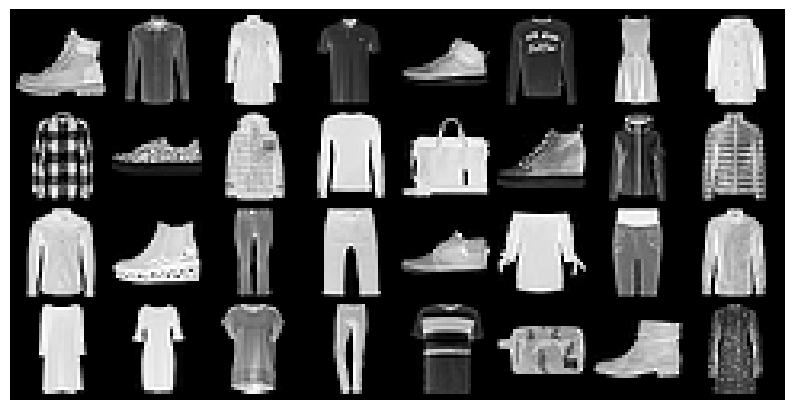

Model 0:


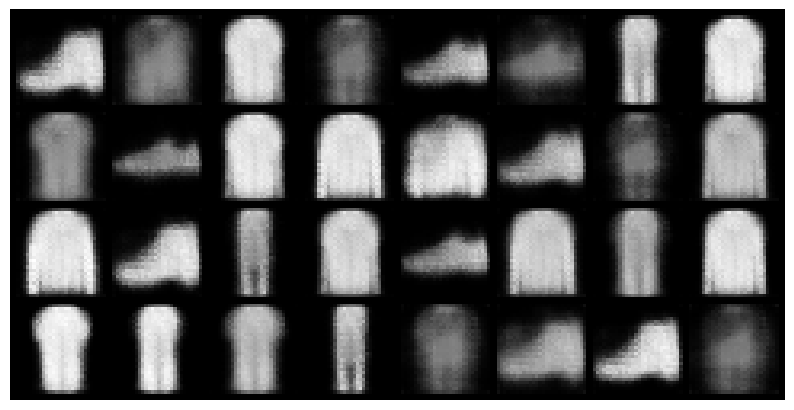

Model 2:


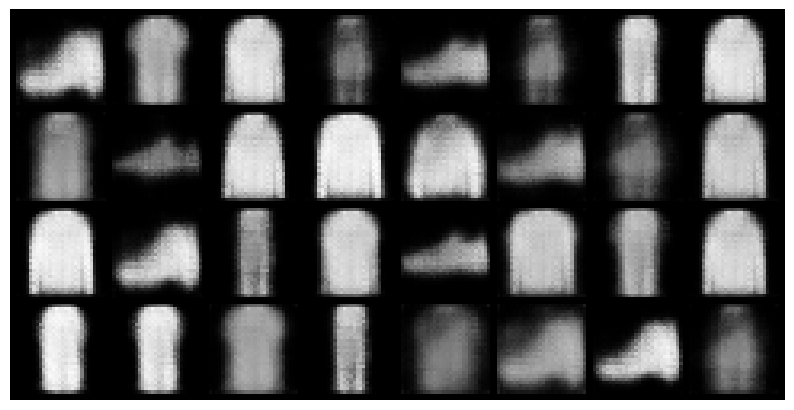

seed 5505
done
done2


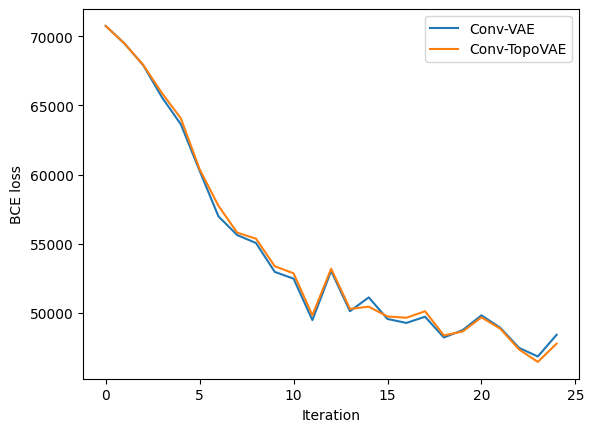

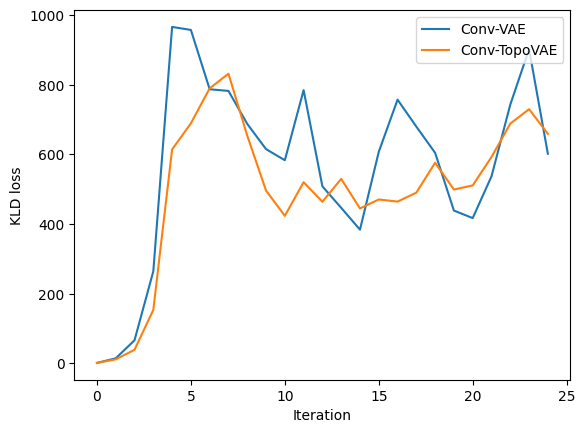

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


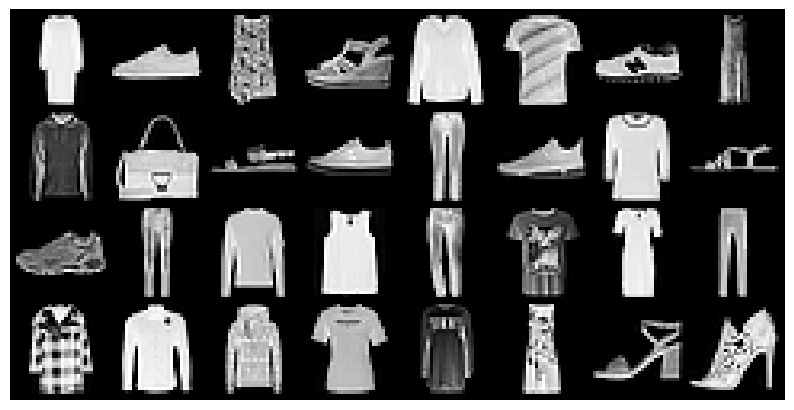

Model 0:


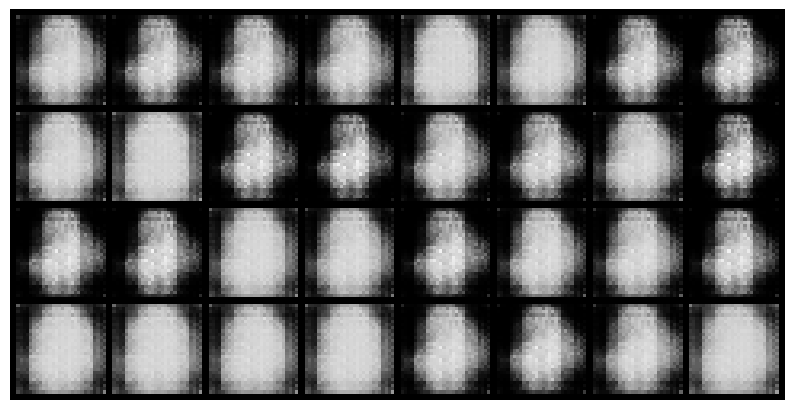

Model 2:


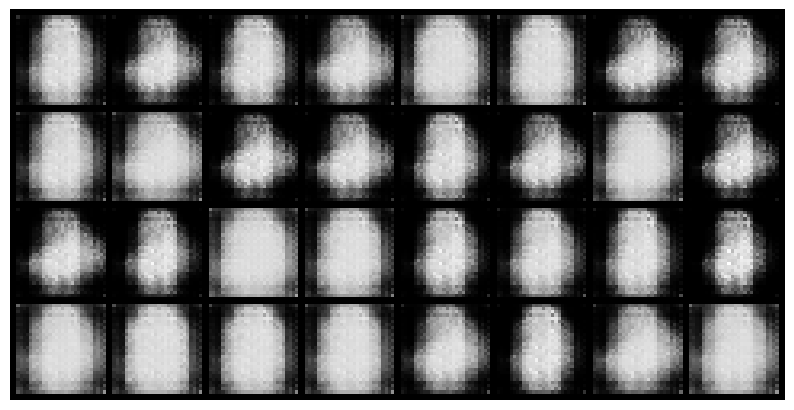

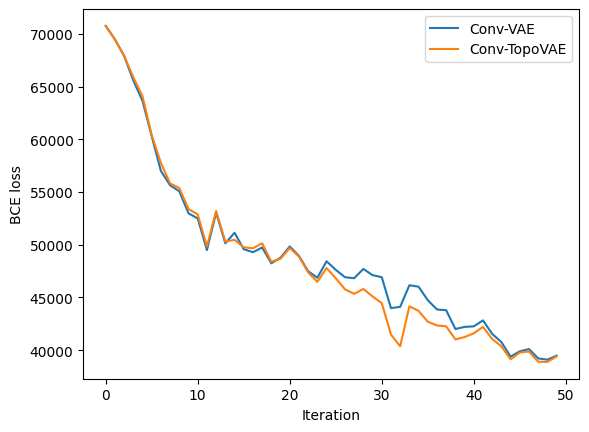

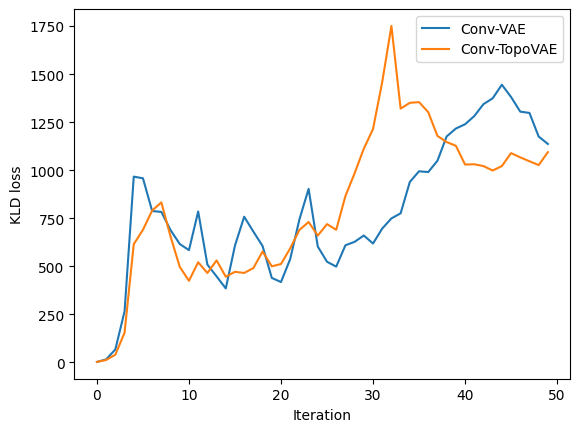

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


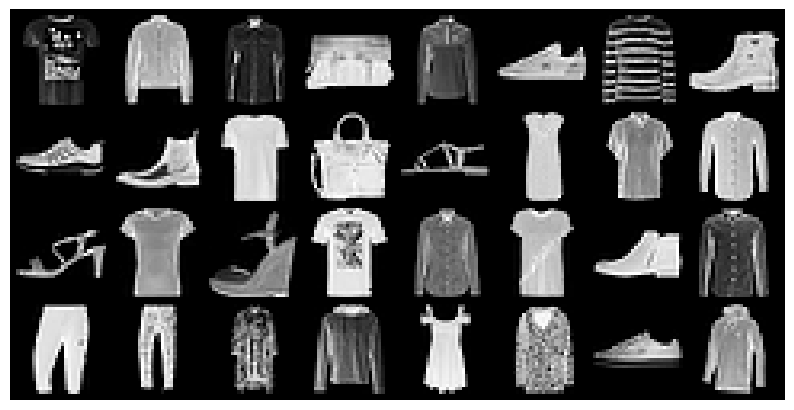

Model 0:


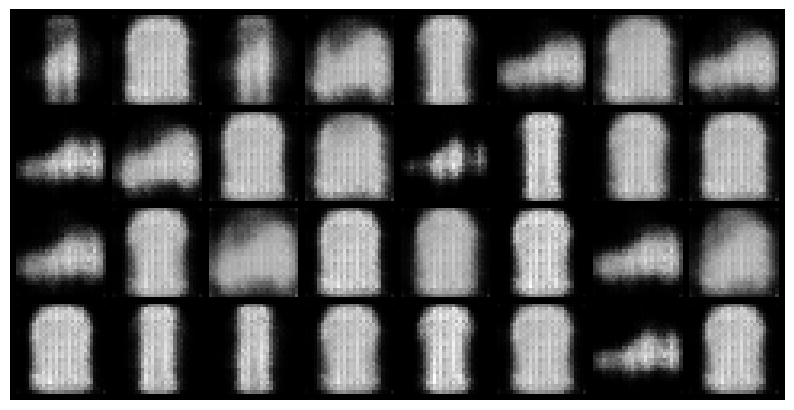

Model 2:


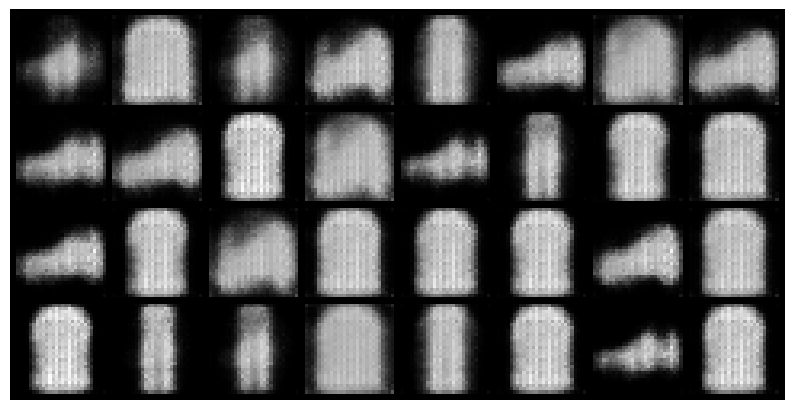

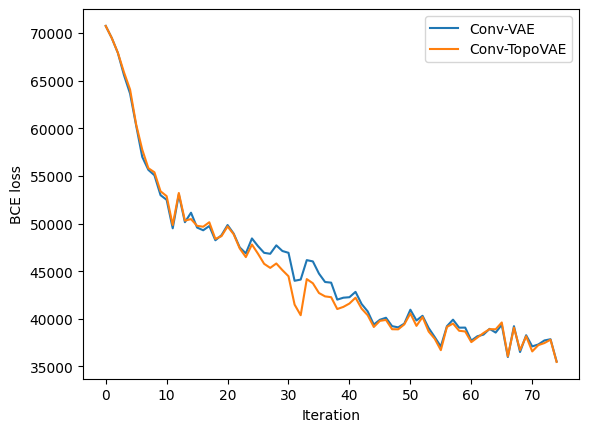

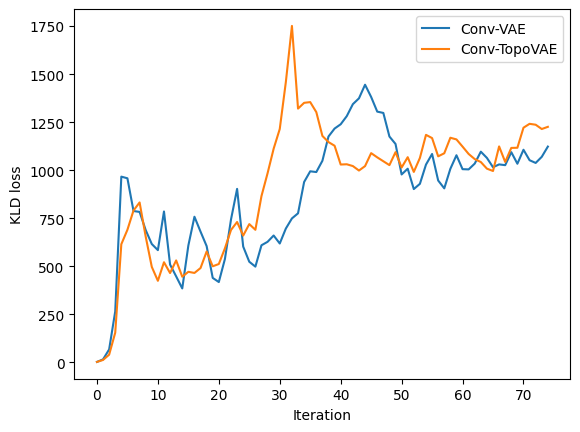

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


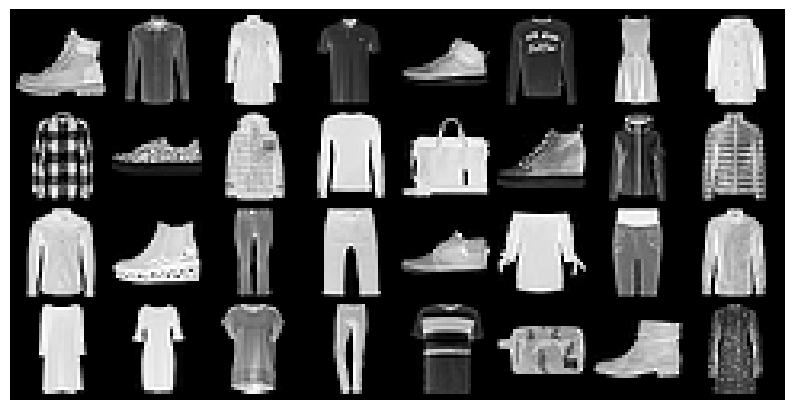

Model 0:


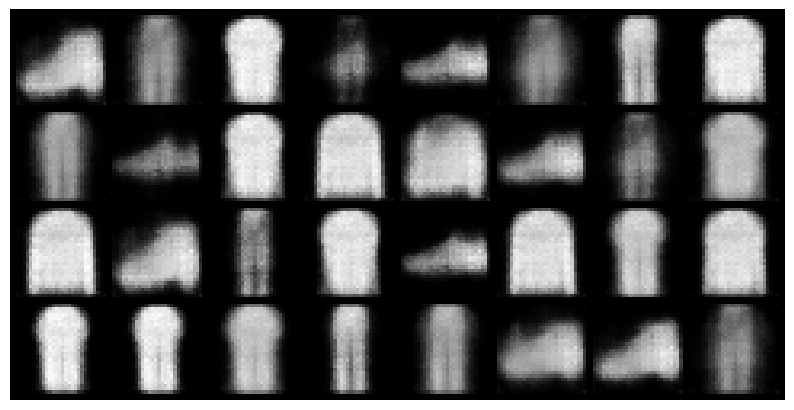

Model 2:


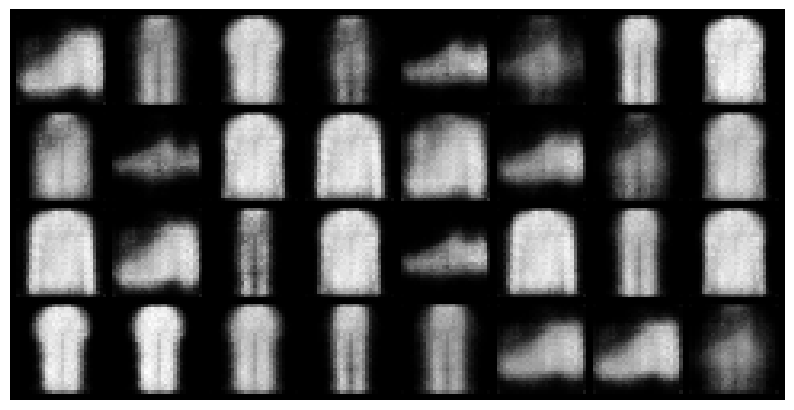

seed 77077
done
done2


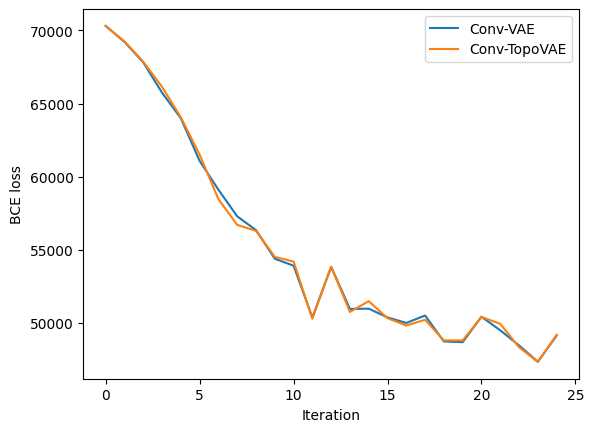

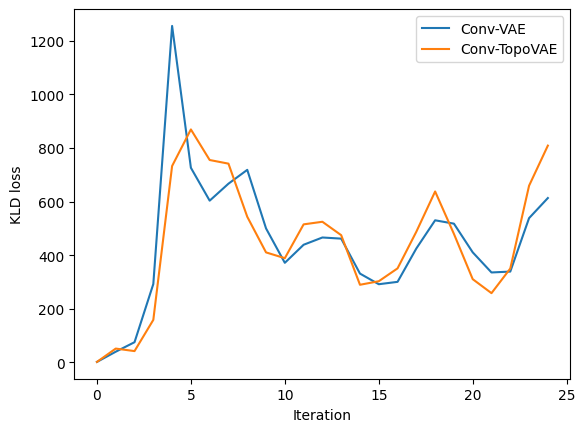

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


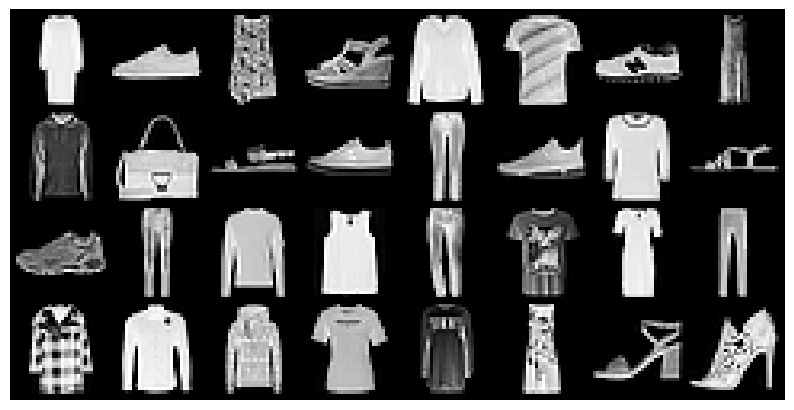

Model 0:


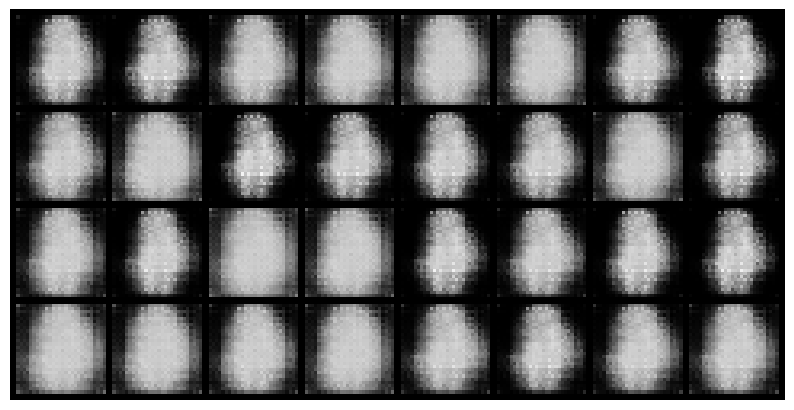

Model 2:


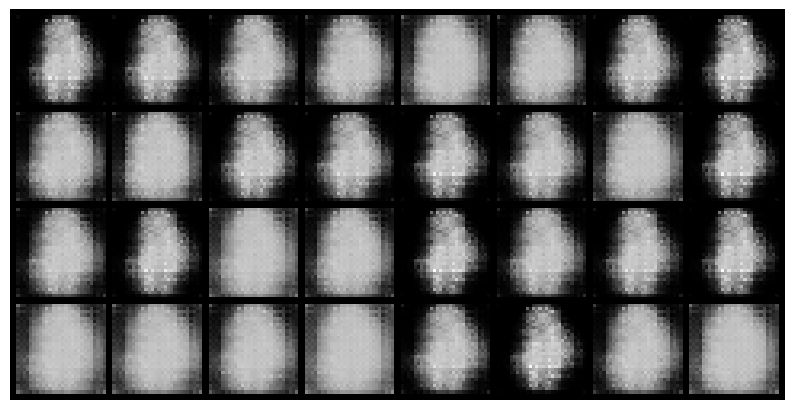

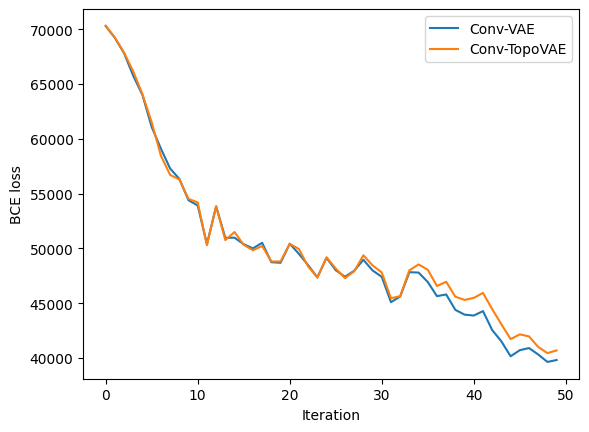

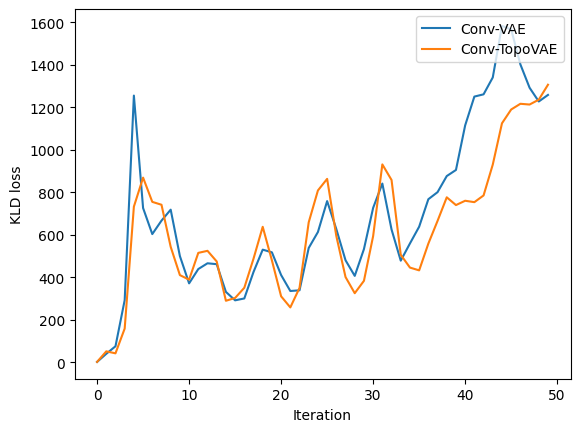

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


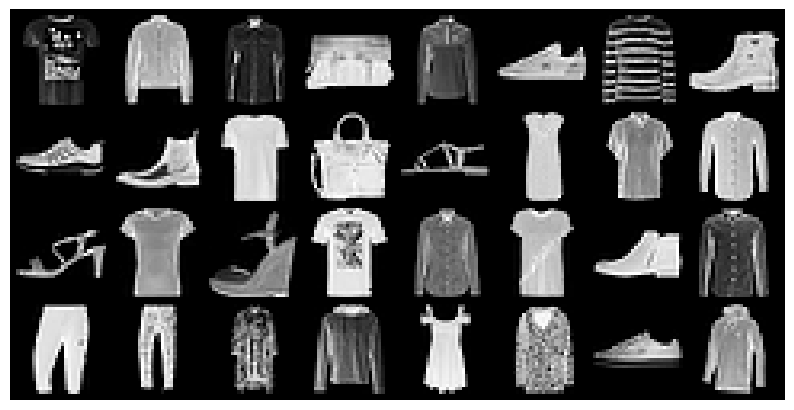

Model 0:


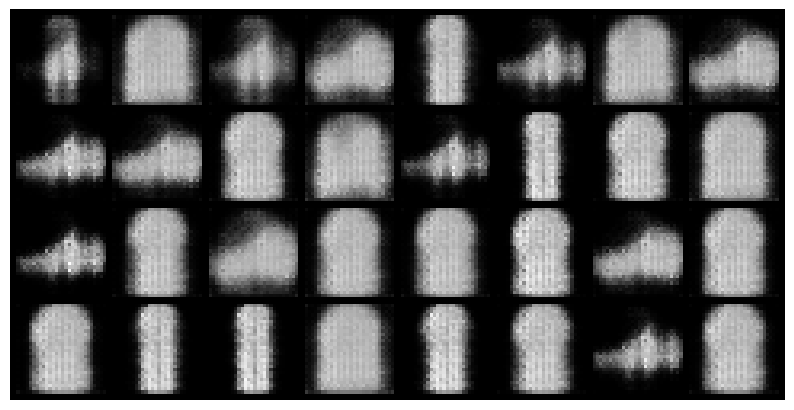

Model 2:


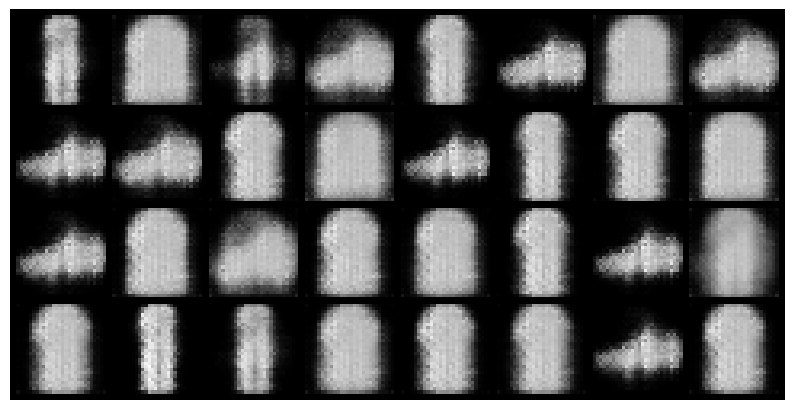

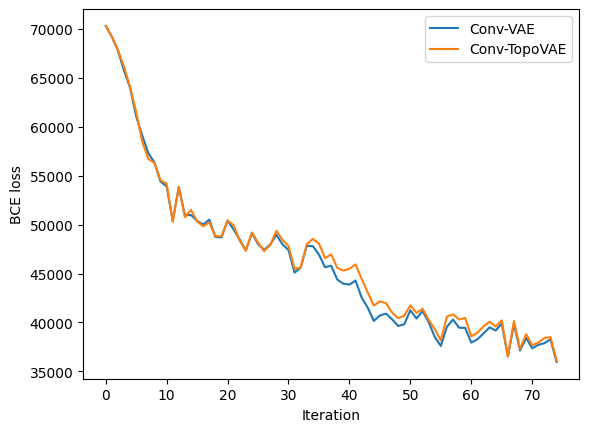

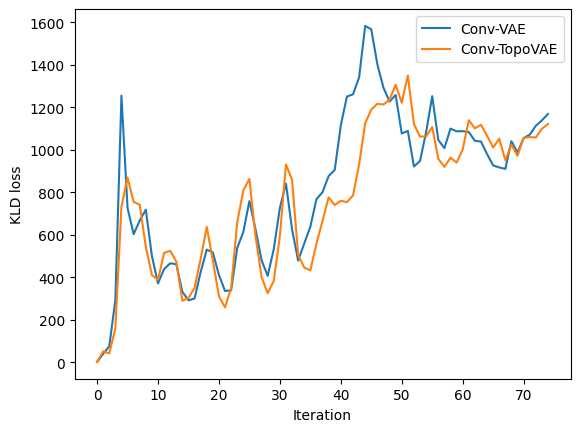

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


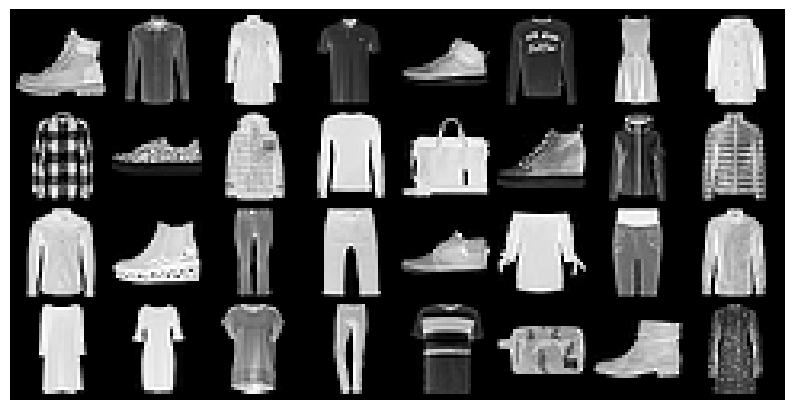

Model 0:


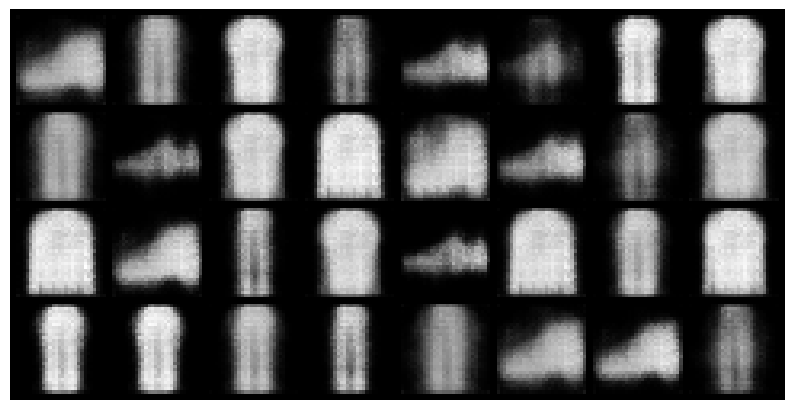

Model 2:


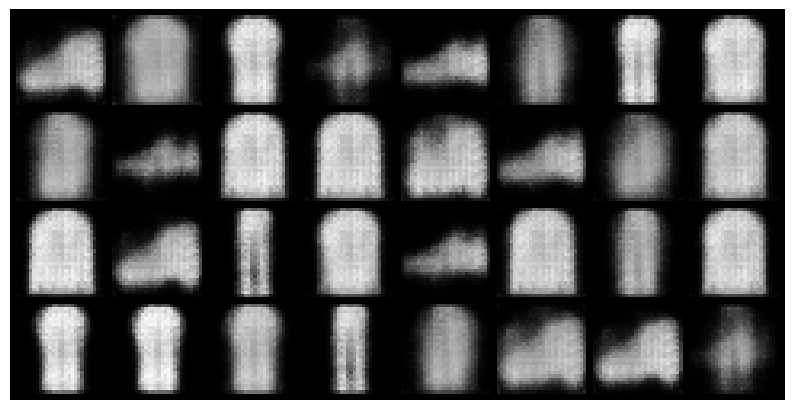

seed 80134
done
done2


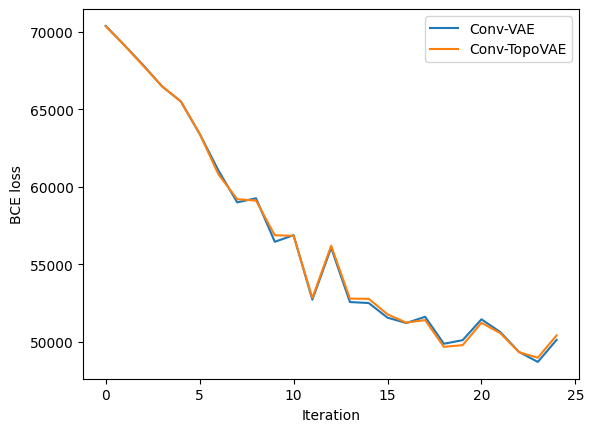

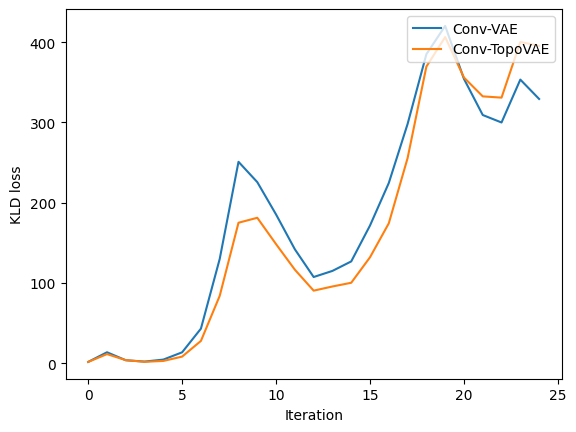

Epoch 1/10 - Batch 25/469
Input: real data (not trained on)
Real batch:


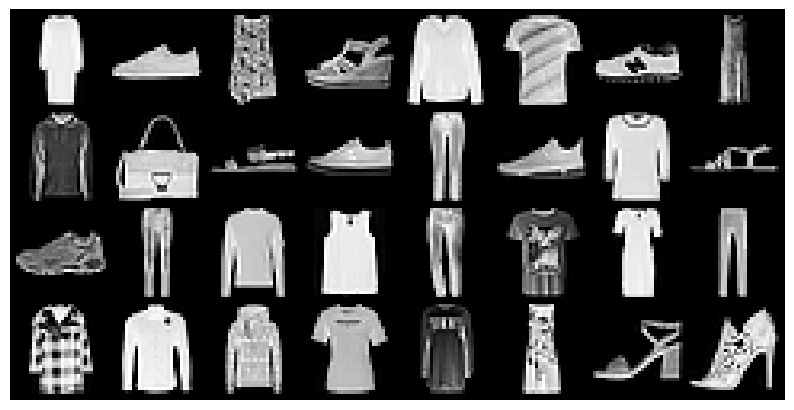

Model 0:


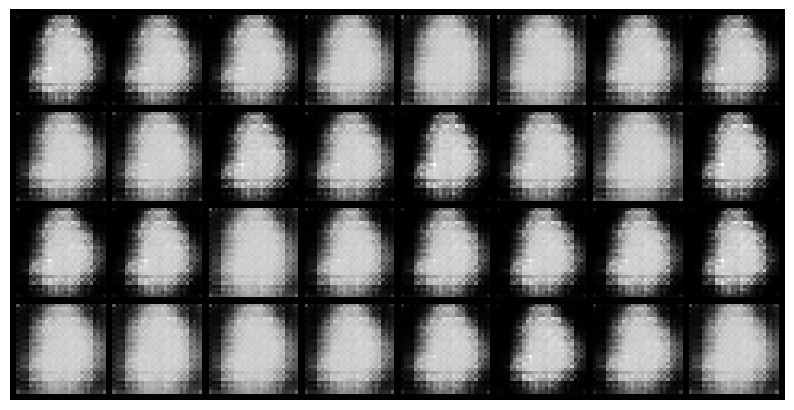

Model 2:


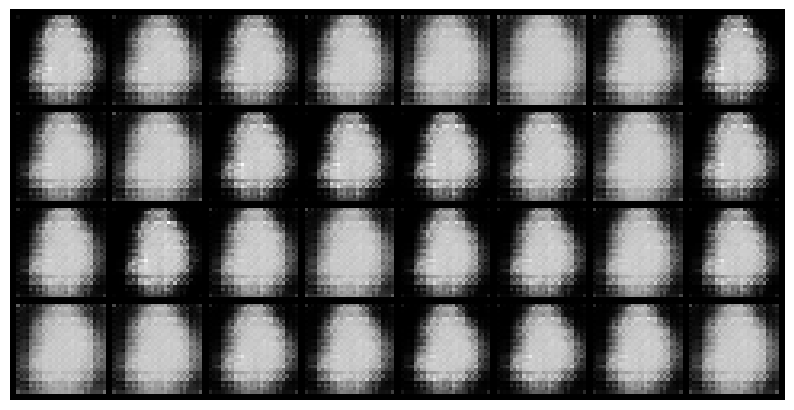

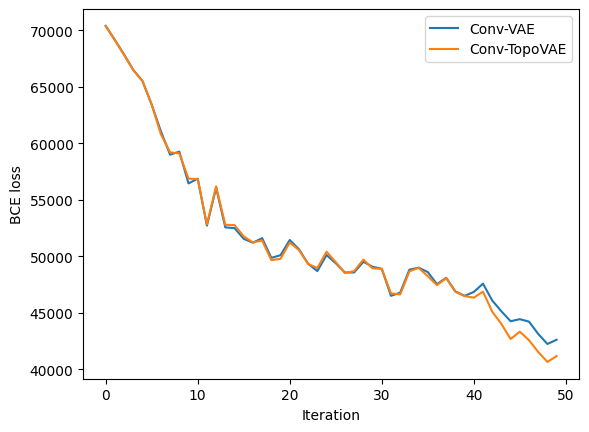

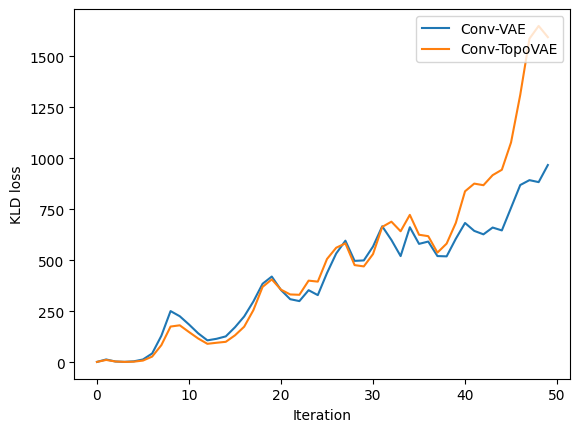

Epoch 1/10 - Batch 50/469
Input: real data (not trained on)
Real batch:


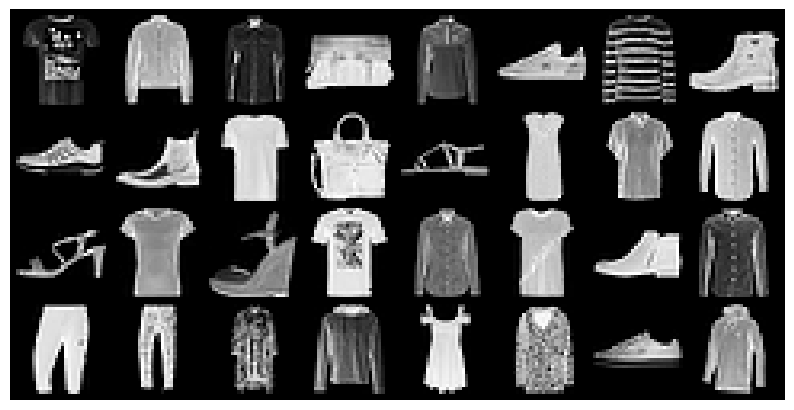

Model 0:


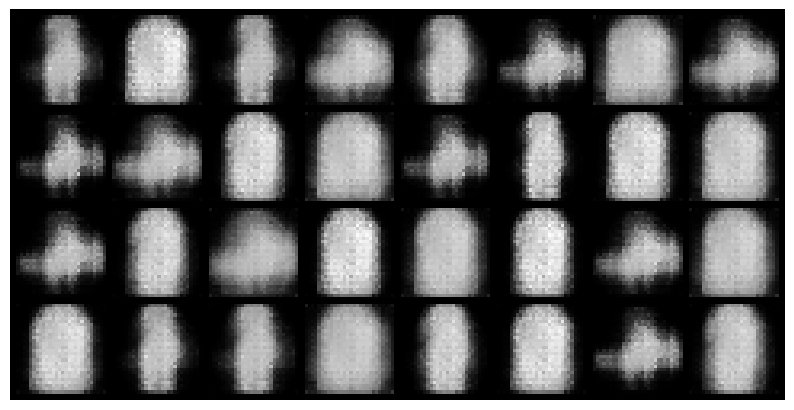

Model 2:


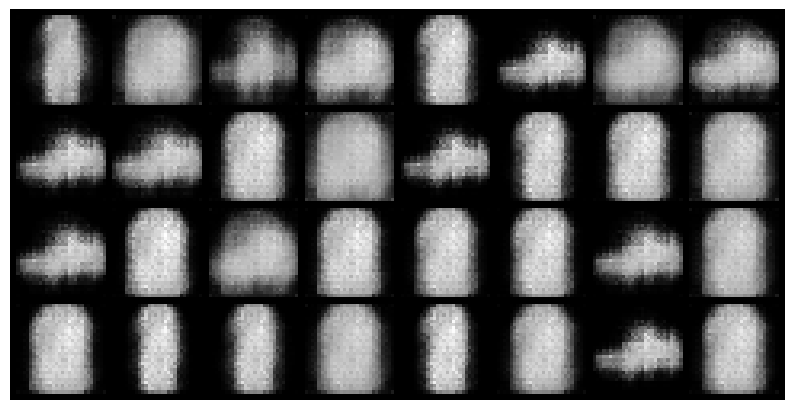

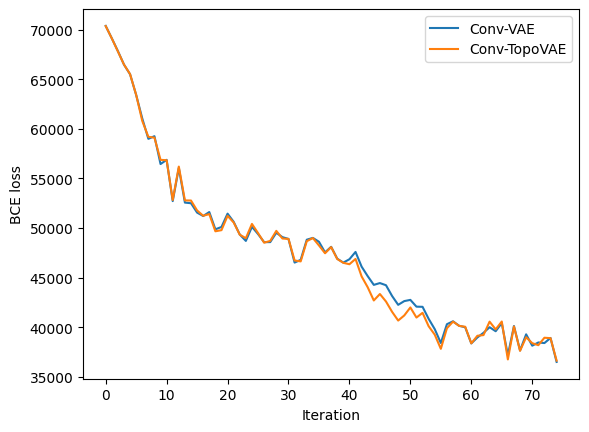

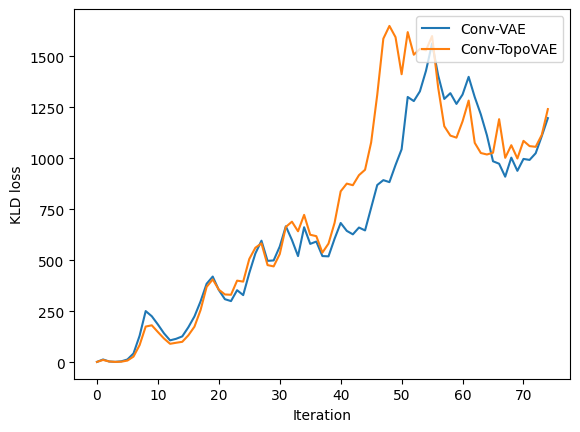

Epoch 1/10 - Batch 75/469
Input: real data (not trained on)
Real batch:


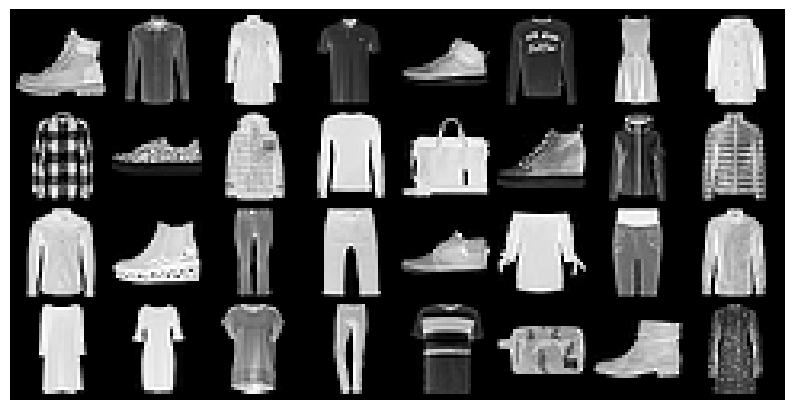

Model 0:


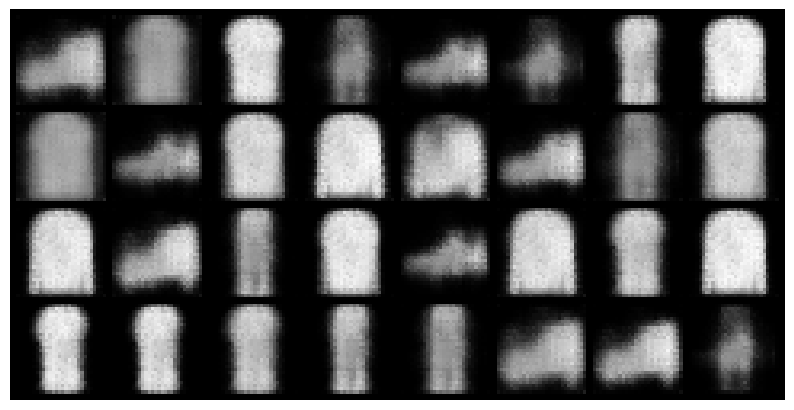

Model 2:


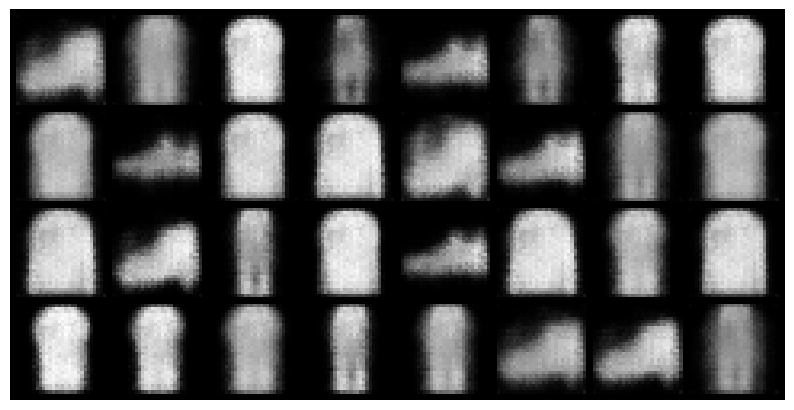

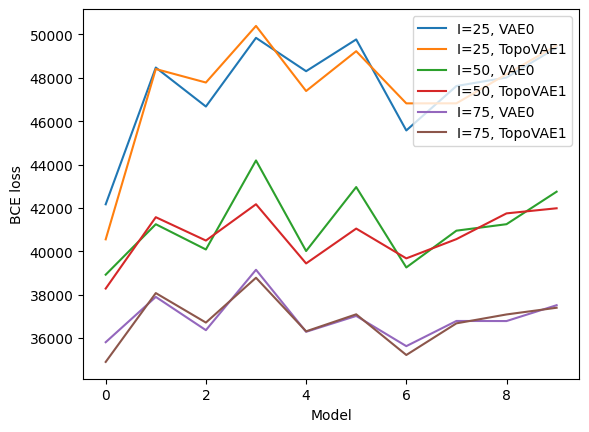

In [22]:
w0=5.
w1=5.
n_latent = 10
n_showplots = 25

# save bce losses after 25, 50, 75 iterations:
bce_25_m0 = []
bce_50_m0 = []
bce_25_m2 = []
bce_50_m2 = []
bce_75_m0 = []
bce_75_m2 = []

models0 = []
models2 = []

import pickle

for seed in [10, 31, 22, 83, 44, 15, 65, 5505, 77077, 80134]: #20 no, 100 done, 15 done, 12 and 8 done (worse). seeds: int(w)
  print("seed", seed)
  torch.manual_seed(seed)
  model0 = VAE(n_latent)
  model2 = pickle.loads(pickle.dumps(model0))
  '''
  ## added to have same parameters:
  #seed = 45
  torch.manual_seed(seed)
  model0 = VAE(n_latent)
  torch.manual_seed(seed)
  model2 = VAE(n_latent)
  '''

  optimizer0 = optim.Adam(model0.parameters(), lr=1e-3)
  optimizer2 = optim.Adam(model2.parameters(), lr=1e-3)
  model0.train()
  model2.train()
  losses = []
  losses2 = []
  lossestopo = []
  lossestopo2 = []

  for batch_idx, (data, _) in enumerate(train_loader):
      if batch_idx==76: break

      if batch_idx%n_showplots==0 and batch_idx>0:
        plt.plot(np.arange(len(losses)), losses, label='Conv-VAE')
        plt.plot(np.arange(len(lossestopo)), lossestopo, label='Conv-TopoVAE')
        plt.xlabel("Iteration")
        plt.ylabel("BCE loss")
        plt.legend(loc='upper right')
        plt.show()
        plt.plot(np.arange(len(losses2)), losses2, label='Conv-VAE')
        plt.plot(np.arange(len(lossestopo2)), lossestopo2, label='Conv-TopoVAE')
        plt.xlabel("Iteration")
        plt.ylabel("KLD loss")
        plt.legend(loc='upper right')
        plt.show()

      if batch_idx==0: print("done")
      if batch_idx==10: print("done2")
      #data = data.view(data.size(0), -1)
      #get dgm2:
      dgm2 = dgms_batches[batch_idx]

      #update the 2 models:
      optimizer0.zero_grad()
      optimizer2.zero_grad()

      #model0
      recon_batch, mean, log_var = model0(data)
      loss = loss_vae0(recon_batch, data, mean, log_var, 0)
      loss.backward()
      optimizer0.step()

      #model2
      recon_batch, mean, log_var = model2(data)
      dgm = get_dgm(recon_batch.view(data.size(0), -1), 1)
      loss = loss_fctn3(recon_batch, data, mean, log_var, dgm, dgm2, 3.5, 3.5, 0.1) # loss_fctn2(recon_batch, data, mean, log_var, dgm, dgm2, w0, w1)
      loss.backward()
      optimizer2.step()

      if batch_idx % n_showplots == 0 and batch_idx > 0:
        print(f"Epoch {epoch+1}/{epochs} - Batch {batch_idx}/{len(train_loader)}")
        print("Input: real data (not trained on)")
        with torch.no_grad():
            print("Real batch:")
            plot_batch(data)
            print("Model 0:")
            recon_batch, _, _ = model0(data)
            plot_batch(recon_batch)
            print("Model 2:")
            recon_batch, _, _ = model2(data)
            plot_batch(recon_batch)

  # save bce losses:
  bce_25_m0.append(losses[25])
  bce_50_m0.append(losses[50])
  bce_75_m0.append(losses[75])
  models0.append(model0)

  bce_25_m2.append(lossestopo[25])
  bce_50_m2.append(lossestopo[50])
  bce_75_m2.append(lossestopo[75])
  models2.append(model2)

xs = np.arange(len(bce_25_m0))
plt.plot(xs, bce_25_m0, label='I=25, VAE0')
plt.plot(xs, bce_25_m2, label='I=25, TopoVAE1')
plt.plot(xs, bce_50_m0, label='I=50, VAE0')
plt.plot(xs, bce_50_m2, label='I=50, TopoVAE1')
plt.plot(xs, bce_75_m0, label='I=75, VAE0')
plt.plot(xs, bce_75_m2, label='I=75, TopoVAE1')
plt.xlabel("Model")
plt.ylabel("BCE loss")
plt.legend(loc='upper right')

compare these losses:

In [24]:
n = len(bce_25_m0)
d25 = 0
d50 = 0
d75 = 0
avg25 = sum(bce_25_m0) / n
avg50 = sum(bce_50_m0) / n
avg75 = sum(bce_75_m0) / n
for i in range(n):
  d25 += (bce_25_m0[i] - bce_25_m2[i]) #=lossM0 - lossM2 -> >0: loss0>loss2
  d50 += (bce_50_m0[i] - bce_50_m2[i])
  d75 += (bce_75_m0[i] - bce_75_m2[i])
d25 /= n
d50 /= n
d75 /= n
print("Mean absolute difference of BCE at 25, 50, 75 iters:", d25, d50, d75, "Relative difference:", d25/avg25*100, d50/avg50*100, d75/avg75*100)

Mean absolute difference of BCE at 25, 50, 75 iters: 77.98203125 464.6875 98.3234375 Relative difference: 0.16388465122559343 1.1288744349435909 0.26627235209712696


In [ ]:
## ASO test: (results not shown in appendix)

for w in [5., 10., 20., 50., 100.]:
  print("w:", w)
  w0=w
  w1=w
  n_latent = 10
  n_showplots = 25

  # save bce losses after 25, 50, 75 iterations:
  bce_25_m0 = []
  bce_50_m0 = []
  bce_25_m2 = []
  bce_50_m2 = []
  bce_75_m0 = []
  bce_75_m2 = []

  models0 = []
  models2 = []

  import pickle

  for seed in [10, 31, 22, 83, 44, 15]: #20 no, 100 done, 15 done, 12 and 8 done (worse). seeds: int(w)
    print("seed", seed)
    torch.manual_seed(seed)
    model0 = VAE(n_latent)
    model2 = pickle.loads(pickle.dumps(model0))
    '''
    ## added to have same parameters:
    #seed = 45
    torch.manual_seed(seed)
    model0 = VAE(n_latent)
    torch.manual_seed(seed)
    model2 = VAE(n_latent)
    '''

    optimizer0 = optim.Adam(model0.parameters(), lr=1e-3)
    optimizer2 = optim.Adam(model2.parameters(), lr=1e-3)
    model0.train()
    model2.train()
    losses = []
    losses2 = []
    lossestopo = []
    lossestopo2 = []

    for batch_idx, (data, _) in enumerate(train_loader):
        if batch_idx==77: break

        if batch_idx%n_showplots==0 and batch_idx>0:
          plt.plot(np.arange(len(losses)), losses, label='Conv-VAE')
          plt.plot(np.arange(len(lossestopo)), lossestopo, label='Conv-TopoVAE')
          plt.xlabel("Iteration")
          plt.ylabel("BCE loss")
          plt.legend(loc='upper right')
          plt.show()
          plt.plot(np.arange(len(losses2)), losses2, label='Conv-VAE')
          plt.plot(np.arange(len(lossestopo2)), lossestopo2, label='Conv-TopoVAE')
          plt.xlabel("Iteration")
          plt.ylabel("KLD loss")
          plt.legend(loc='upper right')
          plt.show()

        if batch_idx==0: print("done")
        if batch_idx==10: print("done2")
        #data = data.view(data.size(0), -1)
        #get dgm2:
        dgm2 = dgms_batches[batch_idx]

        #update the 2 models:
        optimizer0.zero_grad()
        optimizer2.zero_grad()

        #model0
        recon_batch, mean, log_var = model0(data)
        loss = loss_vae0(recon_batch, data, mean, log_var, 0)
        loss.backward()
        optimizer0.step()

        #model2
        recon_batch, mean, log_var = model2(data)
        dgm = get_dgm(recon_batch.view(data.size(0), -1), 1)
        loss = loss_fctn2(recon_batch, data, mean, log_var, dgm, dgm2, w0, w1) #+ 0.5 * loss_fctn3(recon_batch, data, mean, log_var, dgm, dgm2, 1.5, 1.5, 0.2)
        loss.backward()
        optimizer2.step()

        if batch_idx % n_showplots == 0 and batch_idx > 0:
          print(f"Epoch {epoch+1}/{epochs} - Batch {batch_idx}/{len(train_loader)}")
          print("Input: real data (not trained on)")
          with torch.no_grad():
              print("Real batch:")
              plot_batch(data)
              print("Model 0:")
              recon_batch, _, _ = model0(data)
              plot_batch(recon_batch)
              print("Model 2:")
              recon_batch, _, _ = model2(data)
              plot_batch(recon_batch)

    # save bce losses:
    bce_25_m0.append(losses[25])
    bce_50_m0.append(losses[50])
    bce_75_m0.append(losses[75])
    models0.append(model0)

    bce_25_m2.append(lossestopo[25])
    bce_50_m2.append(lossestopo[50])
    bce_75_m2.append(lossestopo[75])
    models2.append(model2)

  xs = np.arange(len(bce_25_m0))
  plt.plot(xs, bce_25_m0, label='I=25, VAE0')
  plt.plot(xs, bce_25_m2, label='I=25, TopoVAE1')
  plt.plot(xs, bce_50_m0, label='I=50, VAE0')
  plt.plot(xs, bce_50_m2, label='I=50, TopoVAE1')
  plt.plot(xs, bce_75_m0, label='I=75, VAE0')
  plt.plot(xs, bce_75_m2, label='I=75, TopoVAE1')
  plt.xlabel("Model")
  plt.ylabel("BCE loss")
  plt.legend(loc='upper right')